## ВЫПУСКНАЯ КВАЛИФИКАЦИОННАЯ РАБОТА по курсу «Data Science Pro»

## Прогнозирование конечных свойств новых материалов (композиционных материалов). 
## Слушатель Пахомов И.А.

Задание:

Обучить алгоритм машинного обучения, который будет определять значения:

• Модуль упругости при растяжении, ГПа; 

• Прочность при растяжении, МПа.

Написать нейронную сеть, которая будет рекомендовать:
• Соотношение матрица-наполнитель

### Производим подключение внешних библиотек и модулей

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import tensorflow as tf
import seaborn as sns

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from tensorflow import keras 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import Flatten 
from pandas import read_excel, DataFrame, Series

from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Activation, Dropout
from numpy.random import seed
from scipy import stats
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.neural_network import MLPRegressor
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor

### Загружаем данные из exel файлов
На входе имеются данные о начальных свойствах компонентов композиционных материалов (количество связующего, наполнителя, температурный режим отверждения и т.д.). 
Кейс основан на реальных производственных задачах Центра НТИ «Цифровое материаловедение: новые материалы и вещества» (структурное подразделение МГТУ им. Н.Э. Баумана).

Помещаем данные в созданную нами папку "Datasets".
Считываем данные

In [2]:
df1 = pd.read_excel('Datasets\X_bp.xlsx')
df2 = pd.read_excel('Datasets\X_nup.xlsx')

In [3]:
# Просматриваем первые 5 строк данных находящиеся в первом датасете
df1.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [4]:
#Просматриваем  первые 5 строк данных второго датасета
df2.head()

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,0.0,4.0,57.0
1,1.0,0.0,4.0,60.0
2,2.0,0.0,4.0,70.0
3,3.0,0.0,5.0,47.0
4,4.0,0.0,5.0,57.0


### Объединияем датасеты в один

В условии задания сказано, что нужно сделать объединение этих двух таблиц по индексу, используя тип объединения INNER. Таблицы имеют разное количество строк, поэтому, перед тем как объединять их, предлагаю взглянуть на оба датасета в Excel и визуально оценить их.

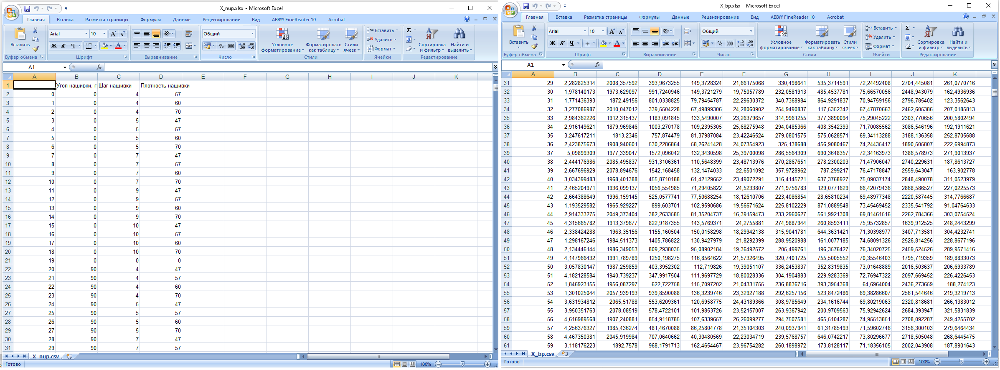

Для объединения датасетов используем методом DataFrame.merge(), с параметром "inner"

In [5]:
df = df1.merge(df2, how='inner')

In [6]:
#Просматриваем данные объединенного датасета
df.head().T

,0,1,2,3,4
Unnamed: 0,0.000000,1.000000,2.000000,3.000000,4.000000
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000


Удалим из датасета колонку с индексом 'Unnamed: 0'

In [7]:
df.drop(['Unnamed: 0'], axis=1, inplace=True)

Датасет после удаленя первого столбца

In [8]:
df.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


Просматриваем инормацию о имеющемся датасете

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки      

Проверяем датасет на наличие дубликатов

In [10]:
df.duplicated().sum()

0

Производим сохранение получившегося датасета

In [11]:
df.to_excel("Datasets\X_all.xlsx")

Далее просматриваем описательную статистику имеющихся данных

In [12]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


## Разведочный анализ данных 

### Строим гистограммы распределения

Производим построение гистограмм без нормализации и исключения шумов

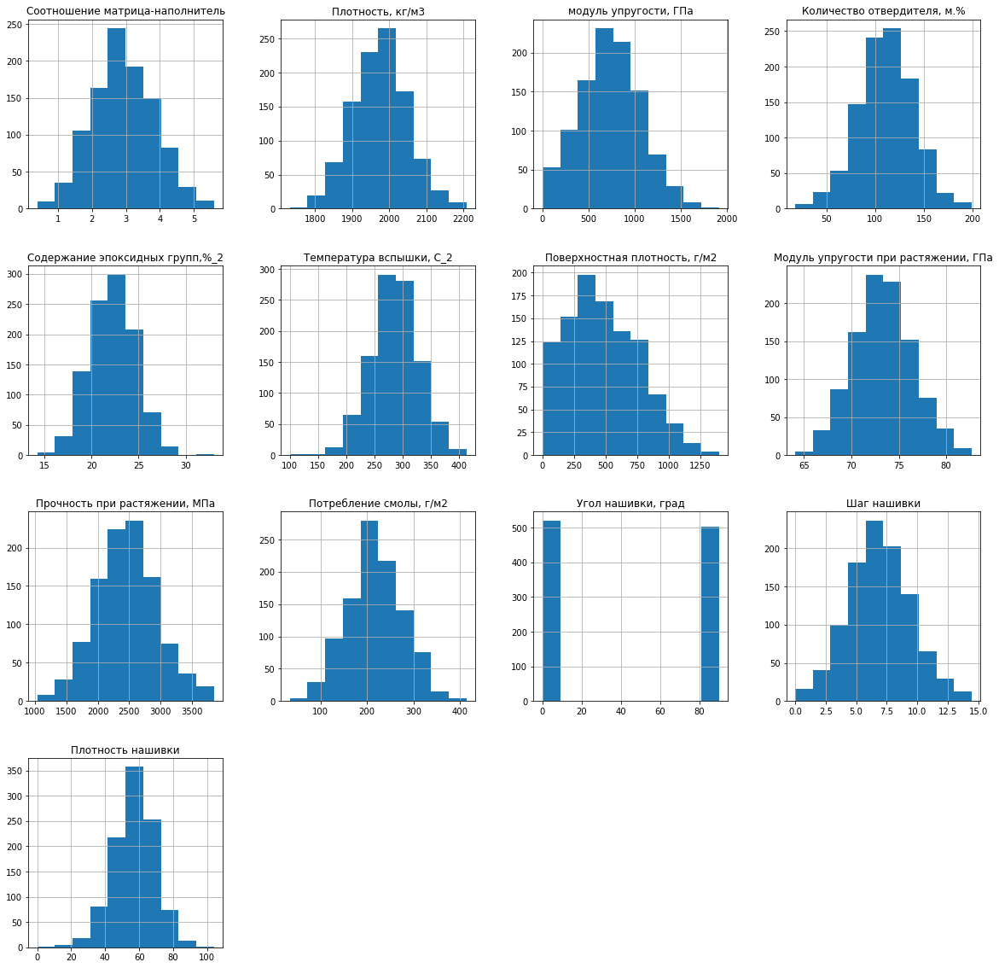

In [13]:
df.hist(figsize=(20,20))
plt.show()

Производим построение "ящиков с усами", шкалу приведем к величинам в диапазоне [0,1], чтобы все построения были одного масштаба

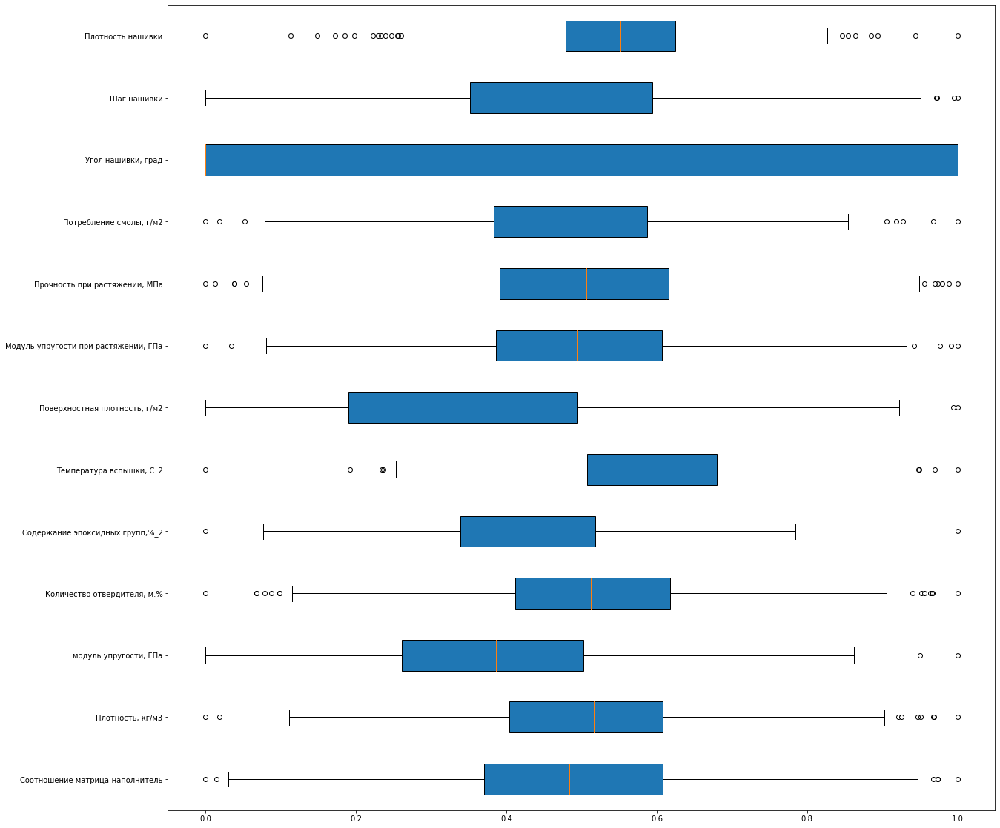

In [14]:
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize=(20, 20))

plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

Видим, что выбросы есть во всех исходных данных, кроме данных "Угол нашивки"

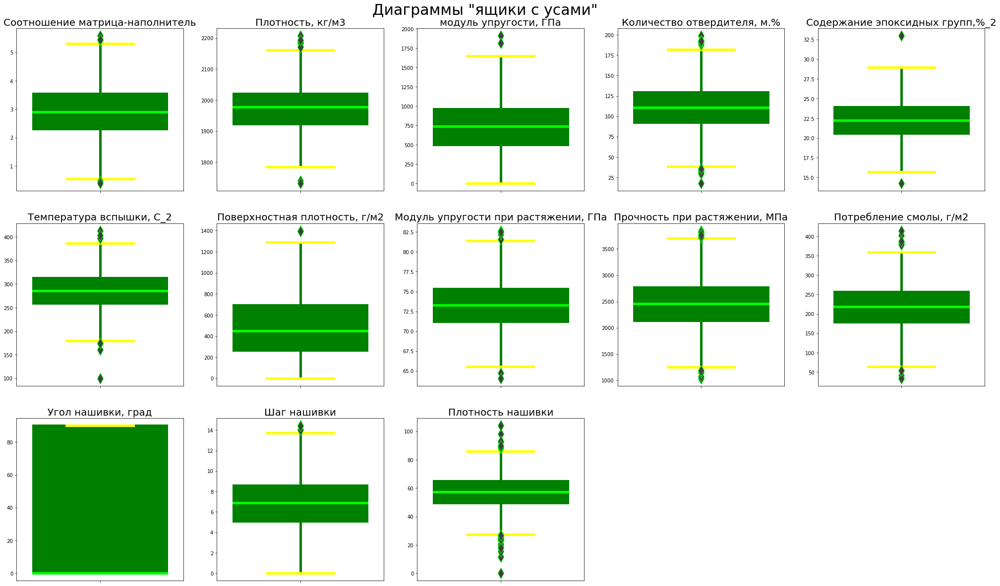

In [15]:
# Ящики с усами (второй вариант)
a = 5 # количество строк
b = 5 # количество столцбцов
c = 1 # инициализация plot counter

plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.boxplot(data = df, y = df[col], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'g'), medianprops = dict(color = 'lime'), whiskerprops = dict(color="g"), capprops = dict(color = "yellow"), flierprops = dict(color="y", markeredgecolor = "lime"))
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c += 1
# "Ящики с усами" показывают наличие выбросов во всех столбцах, кроме углов нашивки, значит, с ними будем работать

In [16]:
#Создадим переменную для названия всех столбцов. Это нам пригодится при построении моделей. И перейдем к визуализации данных
df.columns
#column_names = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
#         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
#         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
#        "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
column_names = df.columns

Соотношение матрица-наполнитель


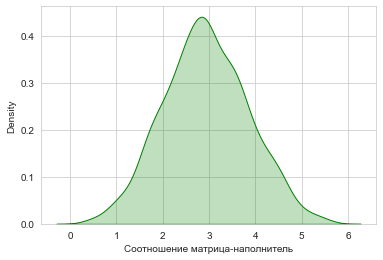

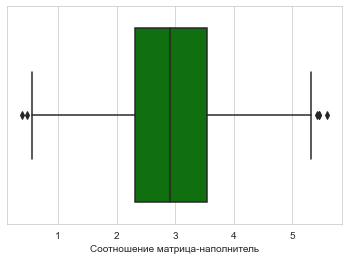

Минимальное значение:  0.389402605178414
Максимальное значение:  5.59174159869754
Среднее значение:  2.9303657734325506
Медианное значение:  2.90687765033521



Плотность, кг/м3


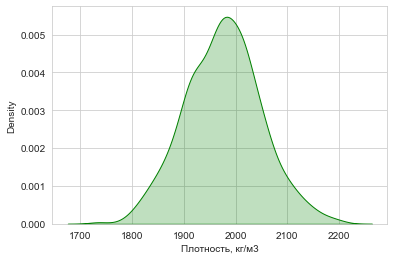

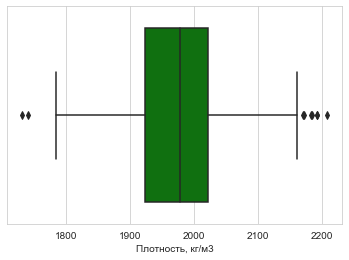

Минимальное значение:  1731.764635096
Максимальное значение:  2207.77348061119
Среднее значение:  1975.7348881101548
Медианное значение:  1977.62165679058



модуль упругости, ГПа


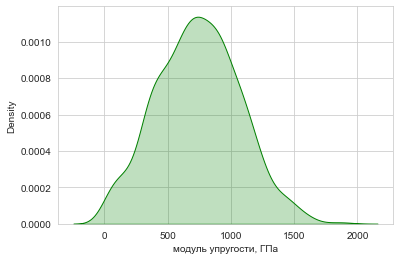

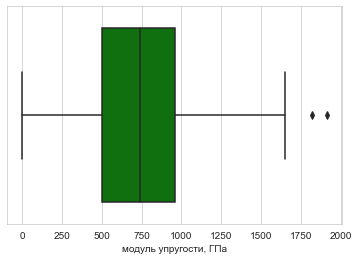

Минимальное значение:  2.4369087535075
Максимальное значение:  1911.53647700054
Среднее значение:  739.9232327560719
Медианное значение:  739.664327697792



Количество отвердителя, м.%


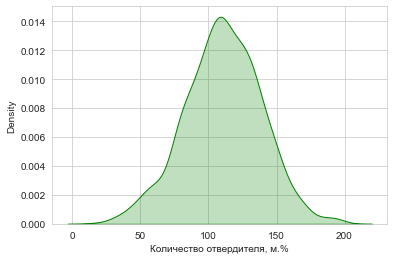

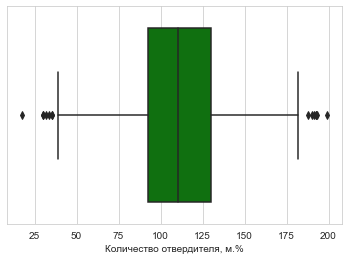

Минимальное значение:  17.7402745562519
Максимальное значение:  198.953207190451
Среднее значение:  110.57076864736258
Медианное значение:  110.564839894065



Содержание эпоксидных групп,%_2


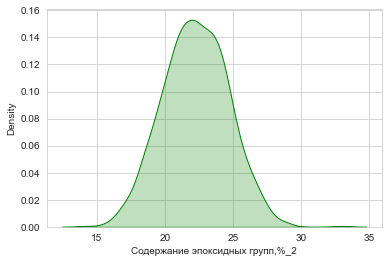

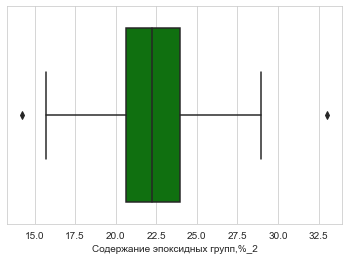

Минимальное значение:  14.2549854977161
Максимальное значение:  33.0
Среднее значение:  22.24438954776772
Медианное значение:  22.2307437560244



Температура вспышки, С_2


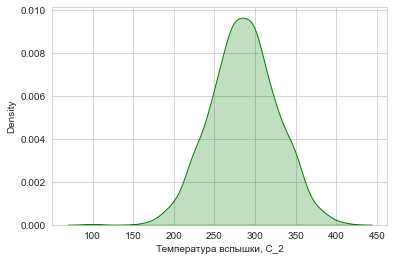

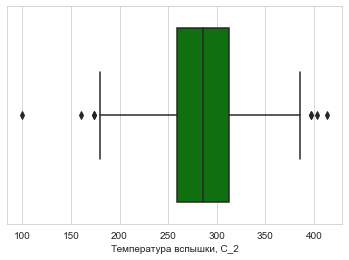

Минимальное значение:  100.0
Максимальное значение:  413.273418243566
Среднее значение:  285.88215135162227
Медианное значение:  285.896812331237



Поверхностная плотность, г/м2


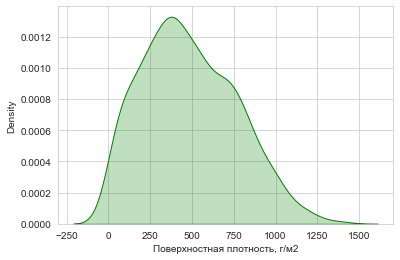

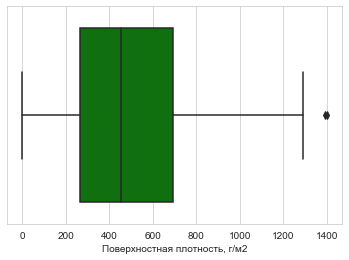

Минимальное значение:  0.603739925153945
Максимальное значение:  1399.54236233989
Среднее значение:  482.7318330384181
Медианное значение:  451.86436518306



Модуль упругости при растяжении, ГПа


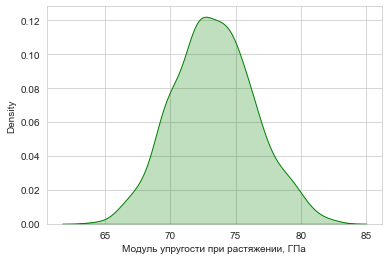

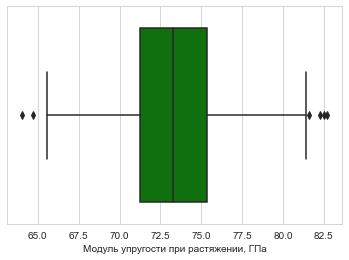

Минимальное значение:  64.0540605597917
Максимальное значение:  82.682051035271
Среднее значение:  73.32857125009073
Медианное значение:  73.2688045943481



Прочность при растяжении, МПа


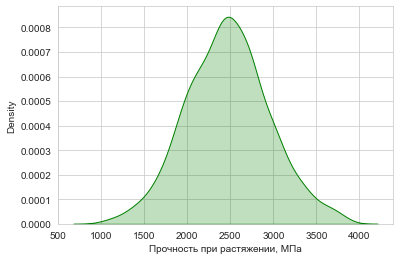

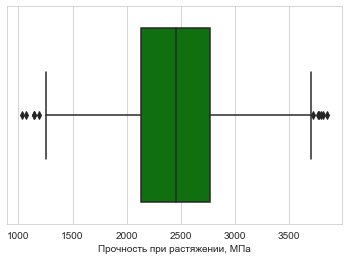

Минимальное значение:  1036.85660535
Максимальное значение:  3848.43673187618
Среднее значение:  2466.9228426979025
Медианное значение:  2459.52452600309



Потребление смолы, г/м2


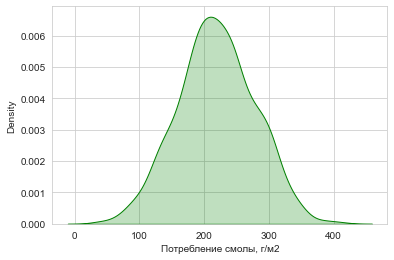

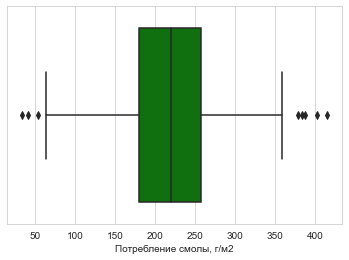

Минимальное значение:  33.8030255329625
Максимальное значение:  414.590628361534
Среднее значение:  218.42314367654265
Медианное значение:  219.198882195134



Угол нашивки, град


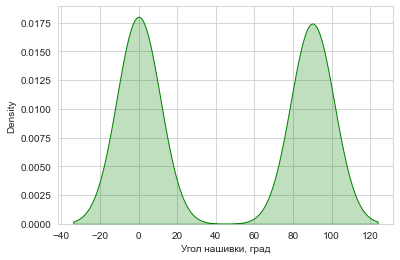

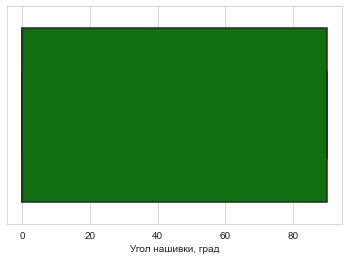

Минимальное значение:  0.0
Максимальное значение:  90.0
Среднее значение:  44.252199413489734
Медианное значение:  0.0



Шаг нашивки


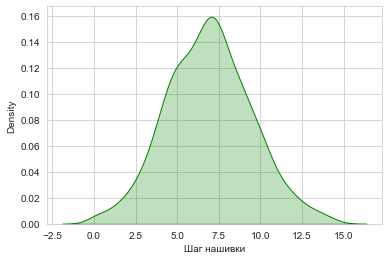

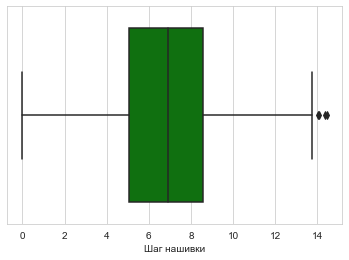

Минимальное значение:  0.0
Максимальное значение:  14.4405218753969
Среднее значение:  6.899222077675024
Медианное значение:  6.9161438559491



Плотность нашивки


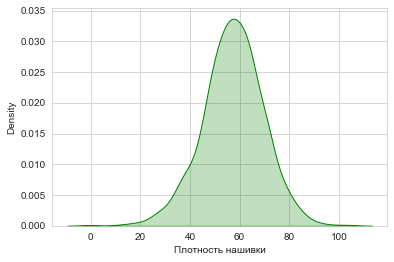

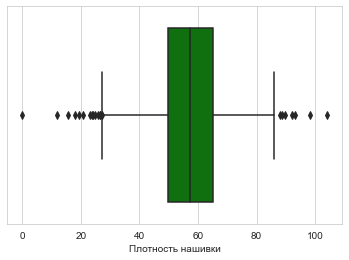

Минимальное значение:  0.0
Максимальное значение:  103.988901301494
Среднее значение:  57.15392943285763
Медианное значение:  57.3419198469929





In [17]:
# Гистограмма распределения и диаграмма "ящик с усами" вместе с данными по каждому столбцу
for column_name in column_names:
    print(column_name)
    
    #Гистограмма распределения
    gis = df[column_name]
    sns.set_style("whitegrid")
    sns.kdeplot(data = gis, shade = True, palette ='colorblind', color = "g")
    plt.show()
    
    #Диаграмма "Ящик с усами"
    sns.boxplot(x=gis, color = "g");
    plt.show()
    
    #Значения (мин макс ср)
    print("Минимальное значение: ", end = " ")
    print(np.min(gis))
    print("Максимальное значение: ", end=" ")
    print(np.max(gis))
    print("Среднее значение: ", end = " ")
    print(np.mean(gis))

    print("Медианное значение: ", end = " ")
    print(np.median(gis))
    print("\n\n")
# Кроме "Угол нашивки, град" и "Поверхностная плотность, г/м2" остальные переменные относительно хорошо соответствуют нормальному распределению

Создадим переменную со списком всех параметров, в которых есть выбросы

In [18]:
df.columns
column_list_drop = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки']

Произведем замену выбросов на пустые значения

In [19]:
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75,25])
    intr_qr = q75-q25
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
    df.loc[df[i]<min,i] = np.nan
    df.loc[df[i]>max,i] = np.nan

Выведем сумму выбросов по каждому из столбцов

In [20]:
df.isnull().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

Произведем удаление строк содержащие пустые значения

In [21]:
df = df.dropna(axis=0)

Посмотрим на сумму выбросов по каждому из столбцов

In [22]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Просмотрим информацию о датесете после удаления пропусков

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки       

Снова производим построение "ящиков с усами"

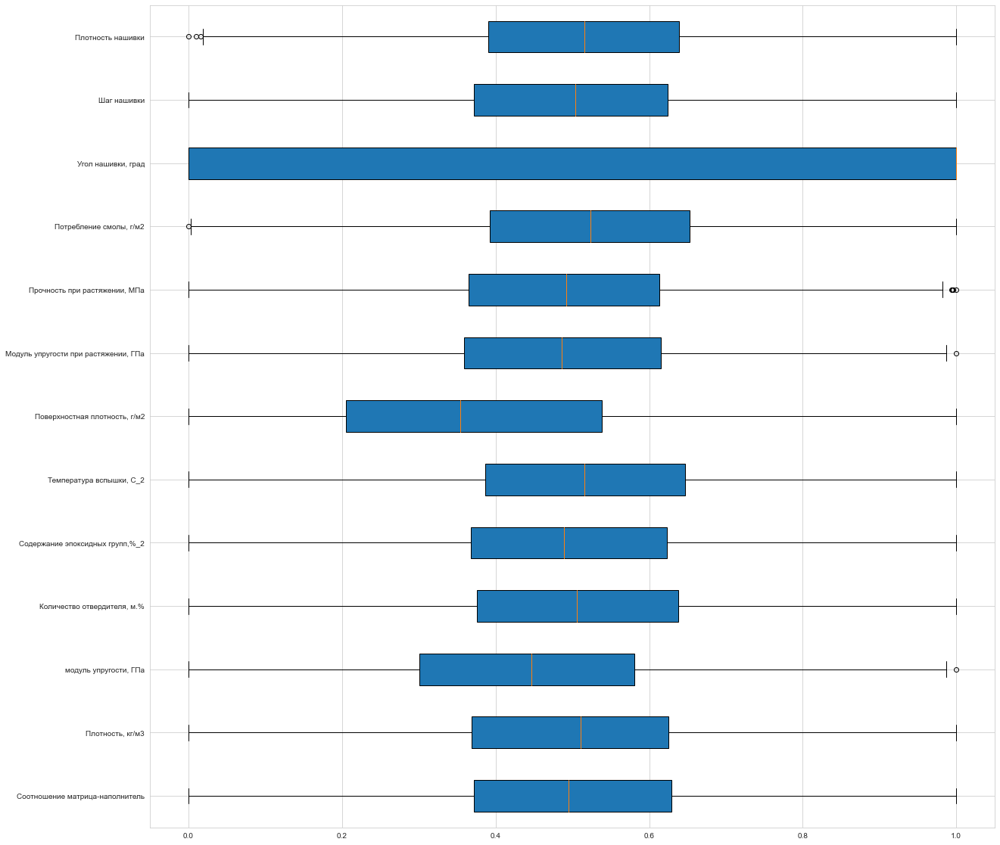

In [24]:
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize=(20, 20))

plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

Из полученных результатов видим, что выбросы остались в некоторых исходных данных. Производим повторное удаление выбросов Произведем замену выбросов на пустые значения

#### Повторим удаление выбросов

In [25]:
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75,25])
    intr_qr = q75-q25
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
    df.loc[df[i]<min,i] = np.nan
    df.loc[df[i]>max,i] = np.nan

Снова смотрим на сумму выбросов по каждому из столбцов

In [26]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   1
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    1
Прочность при растяжении, МПа           4
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       3
dtype: int64

Удаляем строки, которые содержат выбросы (т.е. пустые значения)

In [27]:
df = df.dropna(axis=0)

Повторно посмотрим на сумму выбросов по каждому из столбцов

In [28]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Повторно просматриваем информацию о датесете после удаления пропусков

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 926 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       926 non-null    float64
 1   Плотность, кг/м3                      926 non-null    float64
 2   модуль упругости, ГПа                 926 non-null    float64
 3   Количество отвердителя, м.%           926 non-null    float64
 4   Содержание эпоксидных групп,%_2       926 non-null    float64
 5   Температура вспышки, С_2              926 non-null    float64
 6   Поверхностная плотность, г/м2         926 non-null    float64
 7   Модуль упругости при растяжении, ГПа  926 non-null    float64
 8   Прочность при растяжении, МПа         926 non-null    float64
 9   Потребление смолы, г/м2               926 non-null    float64
 10  Угол нашивки, град                    926 non-null    float64
 11  Шаг нашивки       

Повторно строим "ящики с усами

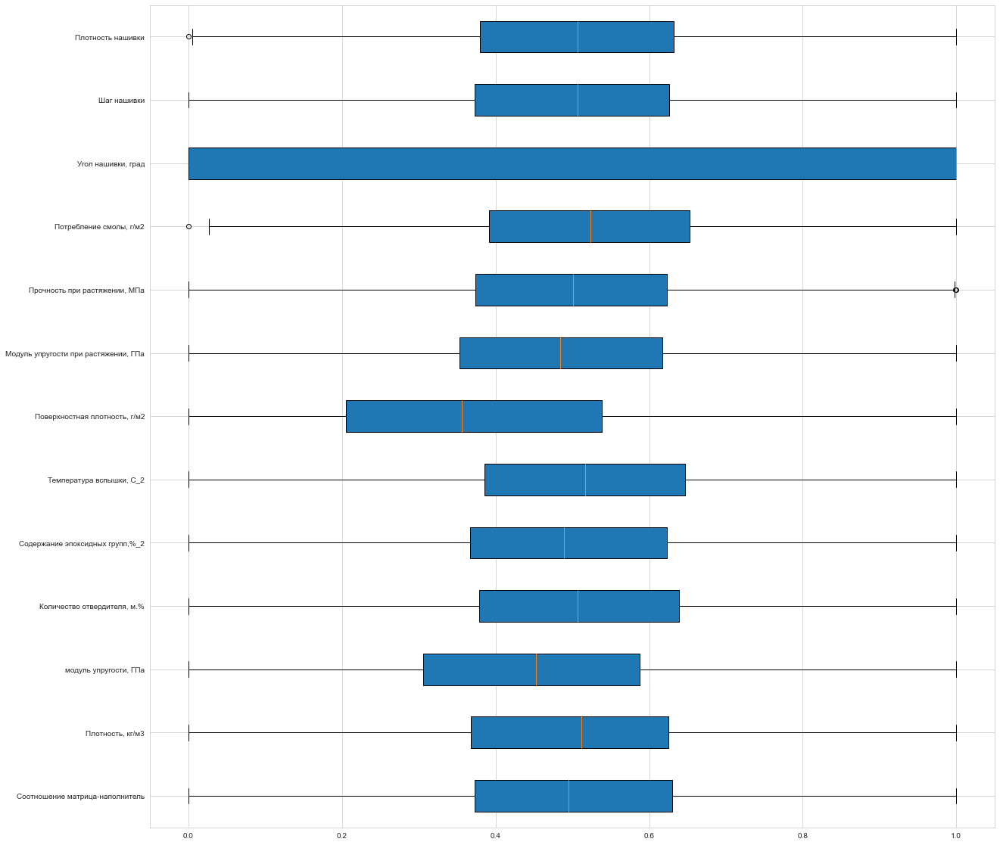

In [31]:
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize=(20, 20))

plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

#### Снова видим, что выбросы остались в некоторых исходных данных
#### Повторим удаление выбросов
Произведем замену выбросов на пустые значения

In [32]:

for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75,25])
    intr_qr = q75-q25
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
    df.loc[df[i]<min,i] = np.nan
    df.loc[df[i]>max,i] = np.nan

Посмотрим на сумму выбросов по каждому из столбцов

In [33]:

df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           2
Потребление смолы, г/м2                 1
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       1
dtype: int64

Удалим строки, которые содержат выбросы

In [34]:
df = df.dropna(axis=0)

Повторно посмотрим на сумму выбросов по каждому из столбцов

In [35]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Просмотриваем информацию о датесете после удаления пропусков

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    float64
 11  Шаг нашивки       

Также снова производим построение "ящиков с усами"

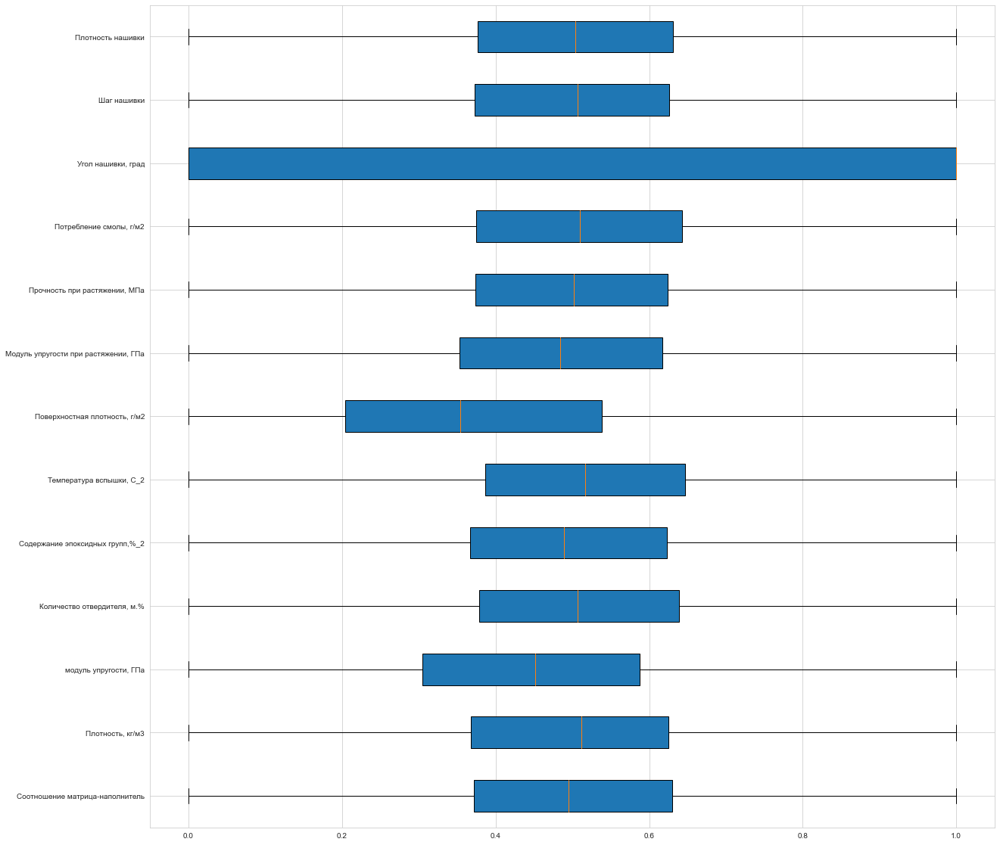

In [37]:
#Повторно построим на "ящики с усами"
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize=(20, 20))
#Выводим "ящики"
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

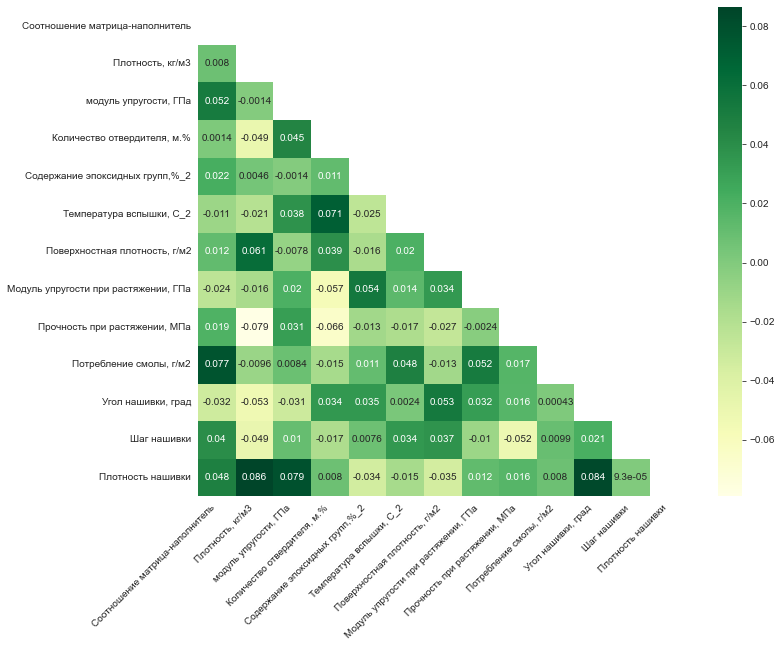

In [38]:
#Визуализация корреляционной матрицы с помощью тепловой карты
mask = np.triu(df.corr())
# Создаем полотно для отображения большого графика
f, ax = plt.subplots(figsize=(11, 9))
# # Визуализируем данные кореляции и создаем цветовую политру
sns.heatmap(df.corr(), mask = mask, annot = True, square = True, cmap = 'YlGn')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

На этот раз видим, что выбросов не осталось. Производим сохранние очищенного от выбросов датасет в папку "Datasets"

<AxesSubplot:>

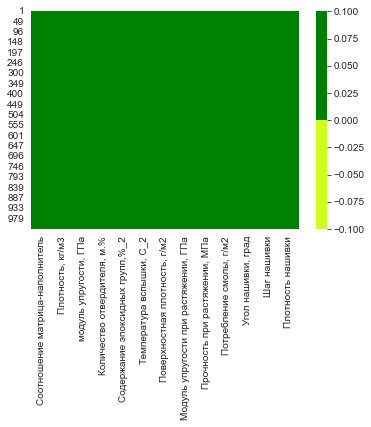

In [39]:
#светло-зеленый - не пропущенные, темнозеленый - пропущенные данные
cols = df.columns
colours = ['#ceff1d', '#008000'] 
sns.heatmap(df[cols].isnull(), cmap = sns.color_palette(colours))
#Тепловая карта, так же как info() и функция ISNULL() показывает, что пропусков нет.

#### выбросов не остались.

In [40]:
df.to_excel("Datasets\X_clear.xlsx")

Просматриваем информацию

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    float64
 11  Шаг нашивки       

Теперь посмотрим на корреляции между параметрами

In [42]:
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


Производим визуализацию данных корреляции

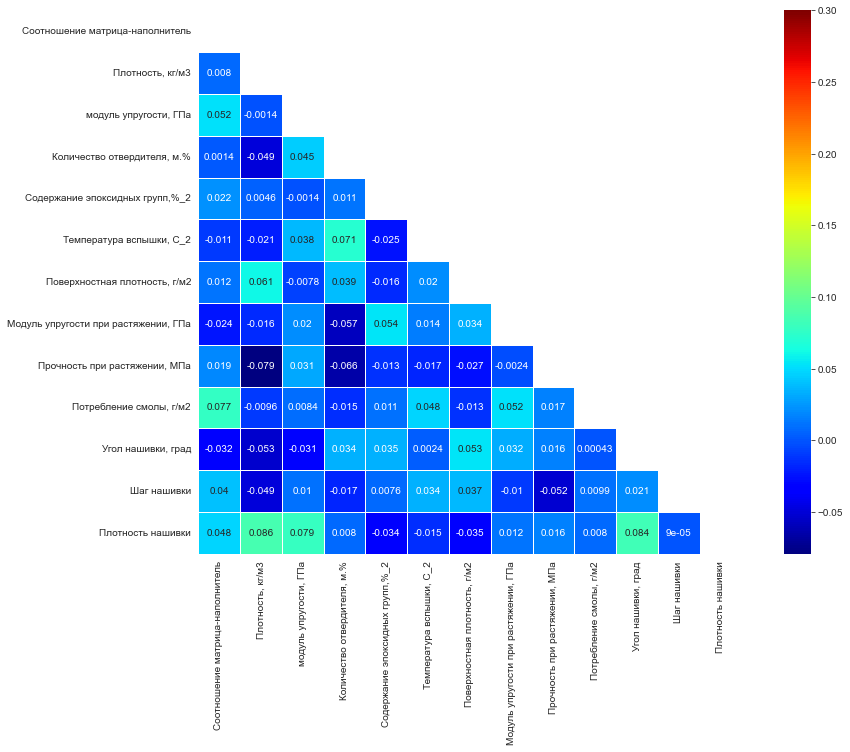

In [43]:
len(df)
f, ax = plt.subplots(figsize=(15, 10))
corr = np.round_(df.corr(), decimals=5)
sns.heatmap(corr,annot=True,cmap='jet',square=True,linewidths=1,vmax=.3, mask = np.triu(df.corr()));

Производим построение парных графиков рассеяния точек - вариант 1

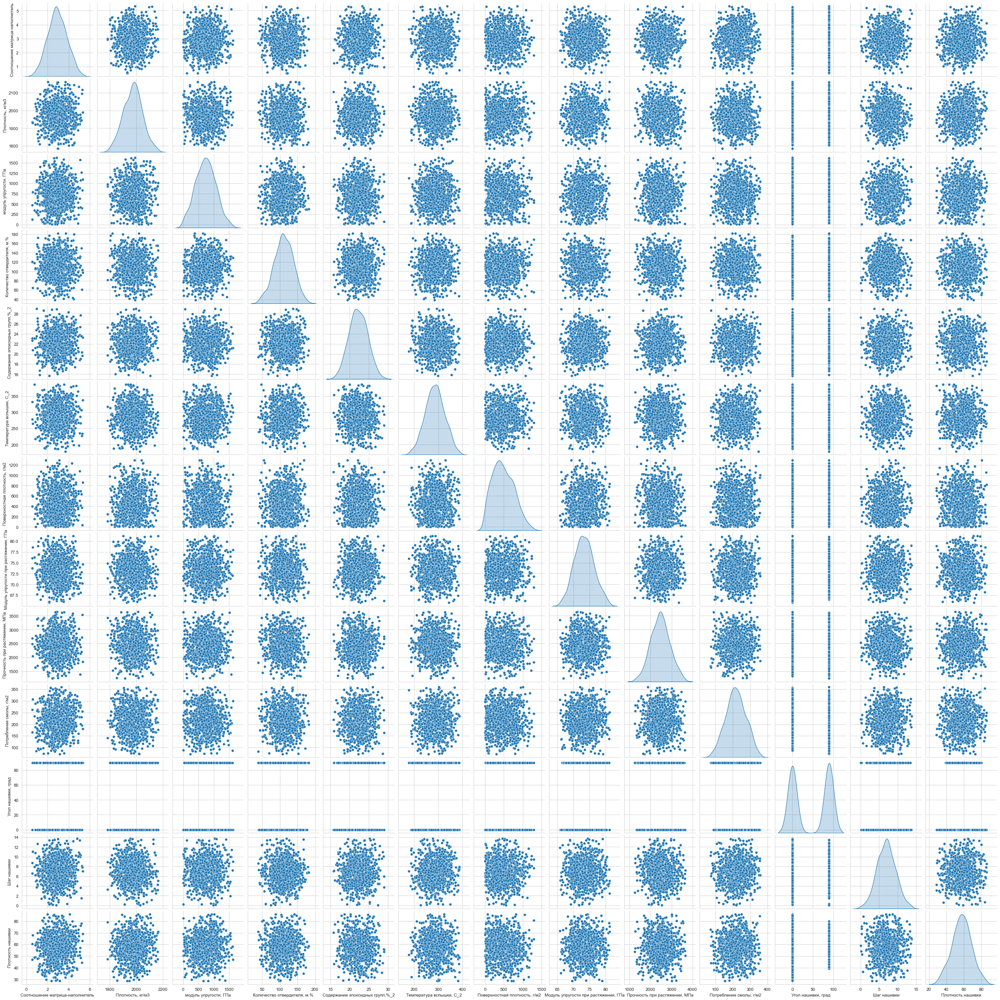

In [44]:
sns.pairplot(df, diag_kind='kde')
plt.show()

Производим построение парных графиков рассеяния точек - вариант 2

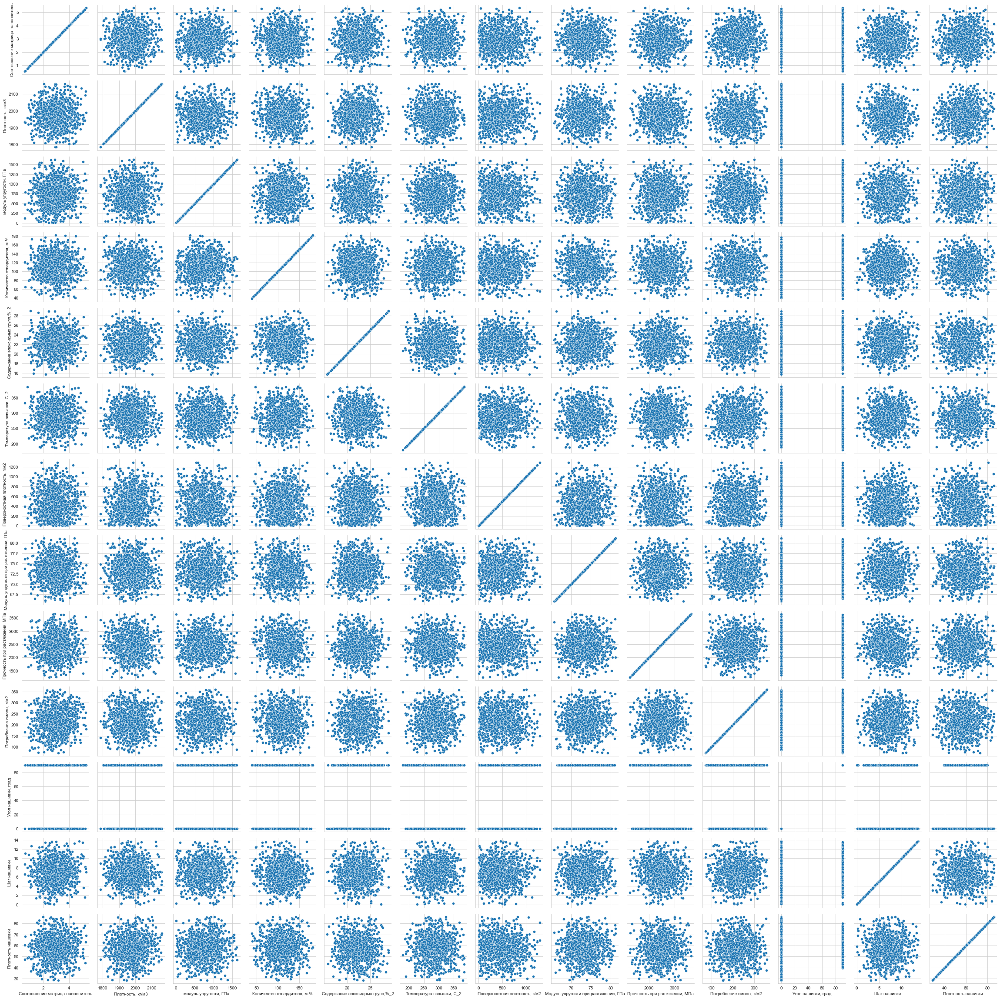

In [45]:
col = df.columns
p = sns.PairGrid(df[col])
p.map(sns.scatterplot)

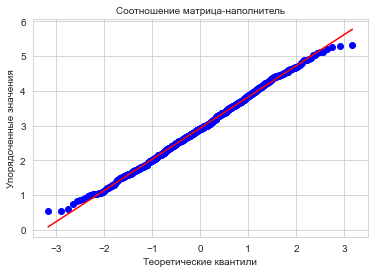

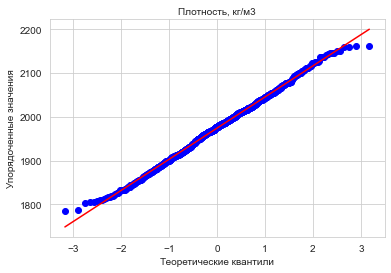

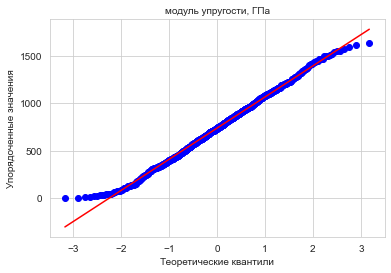

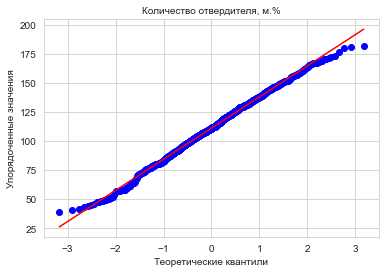

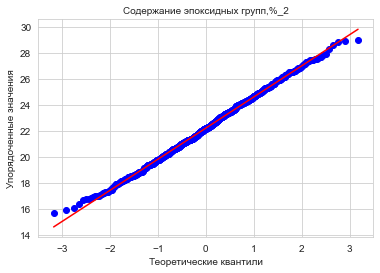

...

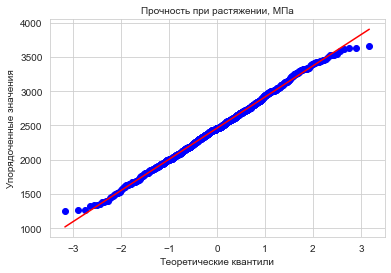

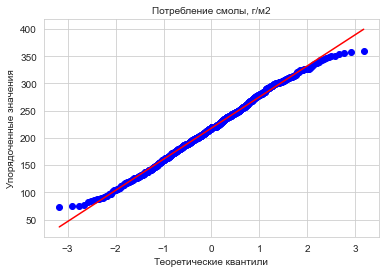

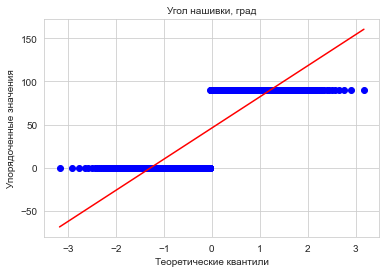

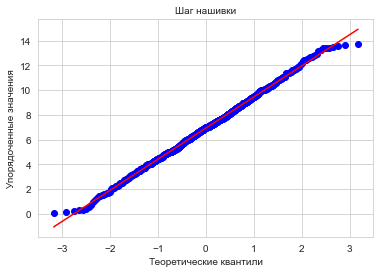

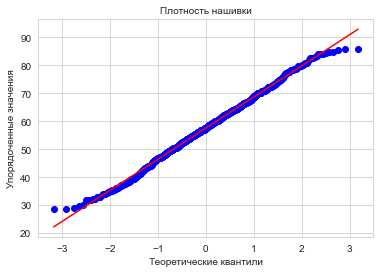

In [46]:
# график qq
for i in df.columns:
    plt.figure(figsize = (6, 4))
    res = stats.probplot(df[i], plot = plt)
    plt.title(i, fontsize = 10)
    plt.xlabel("Теоретические квантили", fontsize = 10)
    plt.ylabel("Упорядоченные значения", fontsize = 10)
    plt.show()

In [47]:
df_norm = df.copy()

Просматриваем информацию

In [48]:
df_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    float64
 11  Шаг нашивки       

### Нормализуем данные

<AxesSubplot:ylabel='Density'>

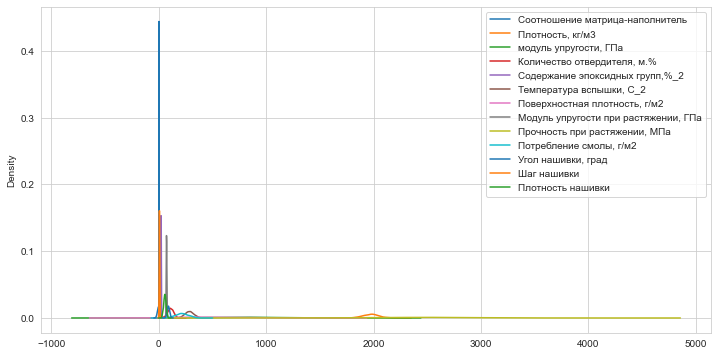

In [49]:
# На данный момент в нашем датасете всего 922 строки. Они все без выбросов, пропущенных значений, все имеют int или float. 
fig, ax = plt.subplots(figsize = (12, 6))
df_norm.plot(kind = 'kde', ax = ax)
# Оценка плотности ядра показывает, что наши данные находятся в разных диапазонах. А в связи с тем, что диапазоны очень разные, данные нужно нормализовать. Можем приступать к нормализации данных.

Проводим нормализацию с помощью MinMaxScaler()

In [50]:
scaler = preprocessing.MinMaxScaler()
col = df.columns
result = scaler.fit_transform(df)

df_minmax_n = pd.DataFrame(result, columns=col)
df_minmax_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.274768,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.466552,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.465836,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.424236,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.361662,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.607674,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.573391,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.662497,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


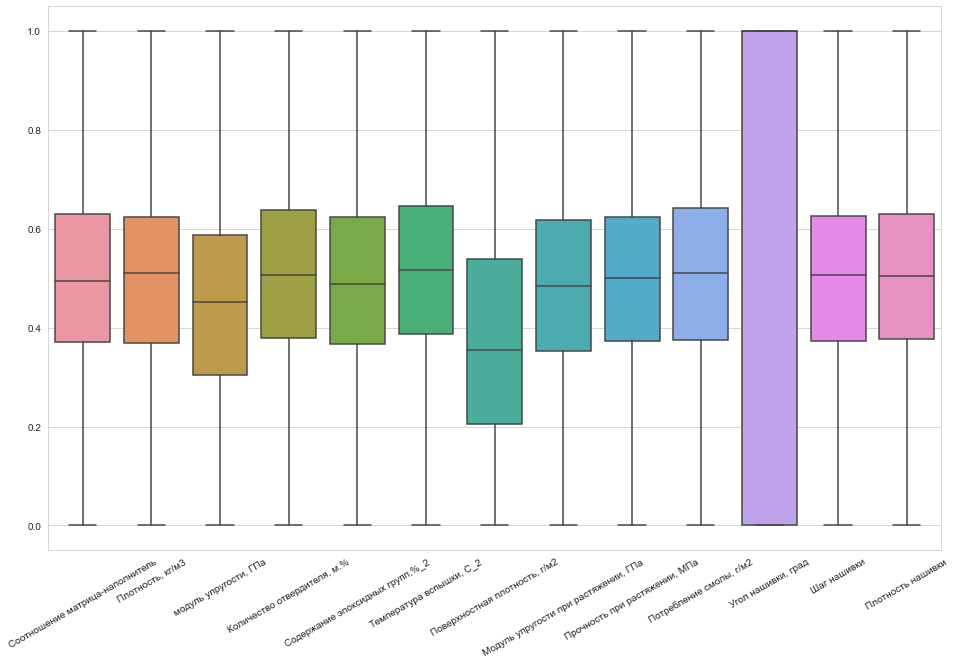

In [51]:
plt.figure(figsize = (16,10))
ax = sns.boxplot(data = df_minmax_n)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30);

<AxesSubplot:ylabel='Density'>

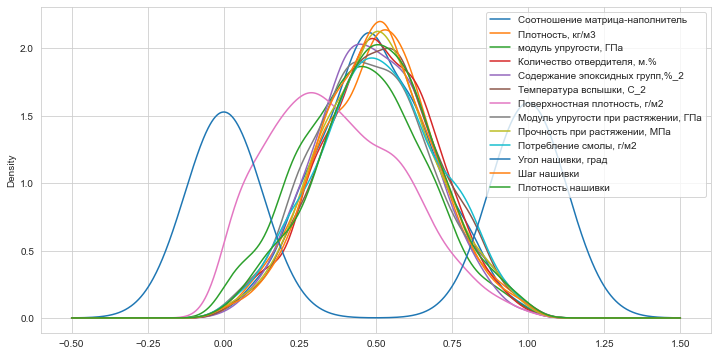

In [52]:
fig, ax = plt.subplots(figsize = (12, 6))
df_minmax_n.plot(kind = 'kde', ax = ax)

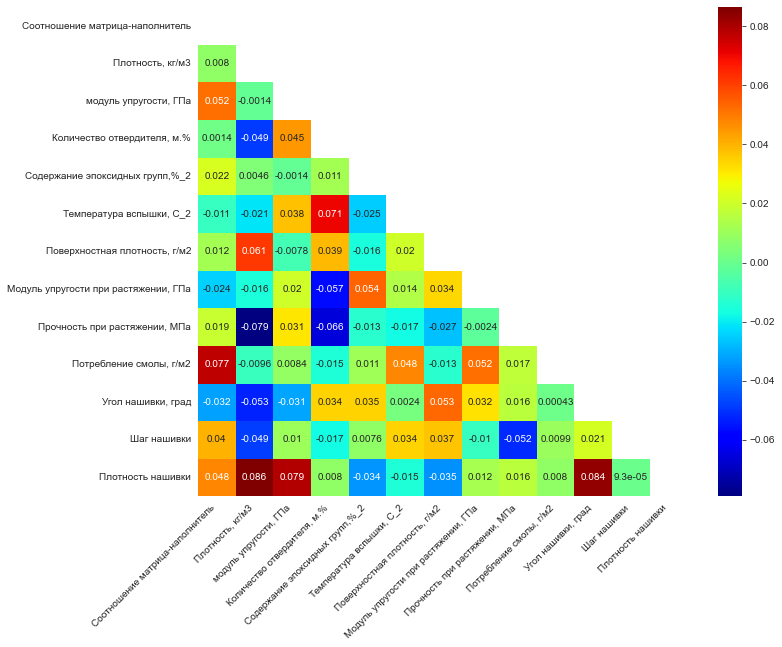

In [53]:
mask = np.triu(df_minmax_n.corr())
f, ax = plt.subplots(figsize = (11, 9))
sns.heatmap(df_minmax_n.corr(), mask = mask, annot = True, square = True, cmap = 'jet')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

Проводим нормализацию с помощью Normalizer()

In [54]:
#Проводим нормализацию с помощью Normalizer()
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
res = normalizer.fit_transform(df)
df_norm_n = pd.DataFrame(res, columns=df.columns)
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.022522,0.735625,0.038520,0.027733,0.002797,0.014489
918,0.001078,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.022819,0.738645,0.036842,0.028164,0.003306,0.016820
919,0.000953,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.021709,0.773510,0.068729,0.026143,0.001209,0.019645
920,0.001191,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.023802,0.665970,0.063368,0.028931,0.002029,0.018728


Производим построение данных до нормализации

In [55]:
df.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0
7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0.0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,60.0
10,2.919678,2160.0,933.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,70.0
11,2.877358,1990.0,1628.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,9.0,47.0


Посмотрим на корреляции между параметрами после нормализации - вариант 1

In [56]:
df_norm_n[df_norm_n.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.281488,0.032476,0.137326,0.221488,0.179958,0.025477,0.261994,-0.257858,0.157642,-0.011248,0.136809,0.175749
"Плотность, кг/м3",0.281488,1.000000,-0.042224,0.390116,0.658090,0.564718,0.067310,0.875175,-0.837989,0.314096,0.080545,0.291797,0.445046
"модуль упругости, ГПа",0.032476,-0.042224,1.000000,0.049350,-0.028083,0.003072,-0.026010,-0.026914,-0.386665,-0.009530,-0.039956,0.002264,0.044295
"Количество отвердителя, м.%",0.137326,0.390116,0.049350,1.000000,0.305241,0.311439,0.067240,0.376291,-0.379865,0.143053,0.063824,0.121285,0.202985
"Содержание эпоксидных групп,%_2",0.221488,0.658090,-0.028083,0.305241,1.000000,0.404662,0.027363,0.660016,-0.551384,0.244688,0.097130,0.236576,0.280553
"Температура вспышки, С_2",0.179958,0.564718,0.003072,0.311439,0.404662,1.000000,0.038343,0.563617,-0.509870,0.246304,0.061930,0.216715,0.260528
"Поверхностная плотность, г/м2",0.025477,0.067310,-0.026010,0.067240,0.027363,0.038343,1.000000,0.055157,-0.318750,0.007690,0.043537,0.065951,-0.017476
"Модуль упругости при растяжении, ГПа",0.261994,0.875175,-0.026914,0.376291,0.660016,0.563617,0.055157,1.000000,-0.741380,0.328857,0.108170,0.302305,0.416121
"Прочность при растяжении, МПа",-0.257858,-0.837989,-0.386665,-0.379865,-0.551384,-0.509870,-0.318750,-0.741380,1.000000,-0.282561,-0.060505,-0.279876,-0.379501
"Потребление смолы, г/м2",0.157642,0.314096,-0.009530,0.143053,0.244688,0.246304,0.007690,0.328857,-0.282561,1.000000,0.032392,0.116592,0.140585


<AxesSubplot:ylabel='Density'>

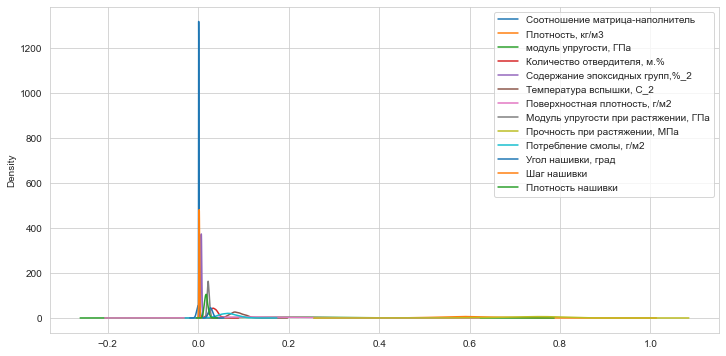

In [57]:
fig, ax = plt.subplots(figsize = (12, 6))
df_norm_n.plot(kind = 'kde', ax = ax)

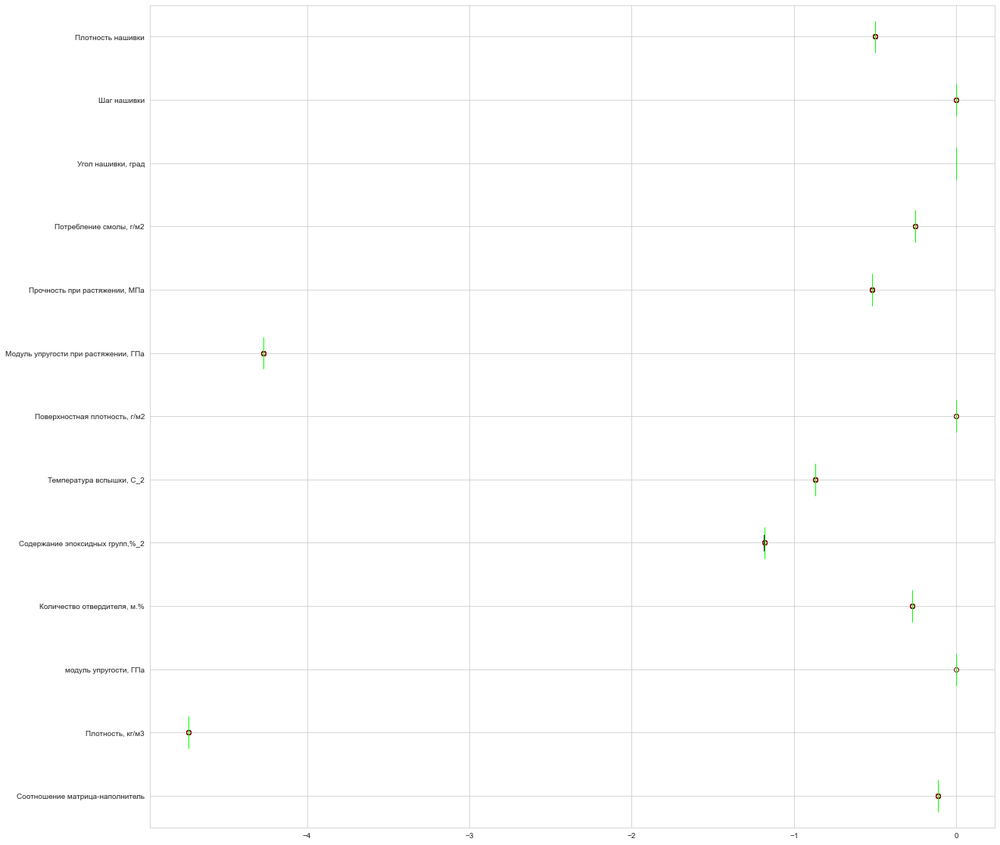

In [58]:
#Построим на "ящики с усами"
scaler = MinMaxScaler()
scaler.fit(df)
plt.figure(figsize=(20, 20))
#Выводим "ящики"
plt.boxplot(pd.DataFrame(scaler.transform(df_norm_n)), labels = df_norm_n.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color="black"), flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()

Посмотрим на корреляции между параметрами после нормализации - вариант 2

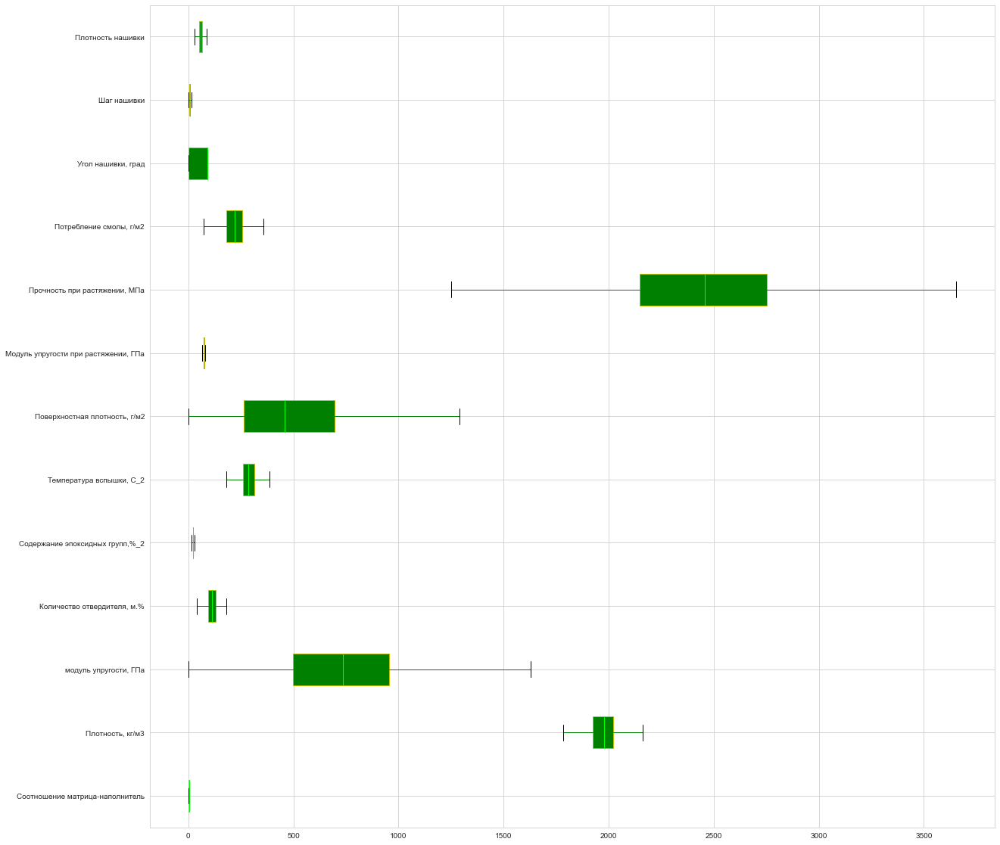

In [59]:
#Попытаемся посмотреть на "ящики с усами"
scaler = MinMaxScaler()
scaler.fit(df_minmax_n)
plt.figure(figsize = (20, 20))
#Выводим "ящики"
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df_minmax_n.columns, patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'g', color = 'y'),medianprops = dict(color = 'lime'), whiskerprops = dict(color = "g"), capprops = dict(color = "black"), flierprops = dict(color = "y", markeredgecolor = "maroon"))
plt.show()


 Визуализация графиков показывает, что нормализация при помощи "Normalizer" дает нам большое количество выбросов

In [60]:
df_minmax_n[df_minmax_n.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


In [61]:
df_minmax_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.274768,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.466552,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.465836,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.424236,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.361662,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.607674,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.573391,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.662497,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


In [62]:
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.022522,0.735625,0.038520,0.027733,0.002797,0.014489
918,0.001078,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.022819,0.738645,0.036842,0.028164,0.003306,0.016820
919,0.000953,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.021709,0.773510,0.068729,0.026143,0.001209,0.019645
920,0.001191,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.023802,0.665970,0.063368,0.028931,0.002029,0.018728


Произведем построение "ящиков с усами"

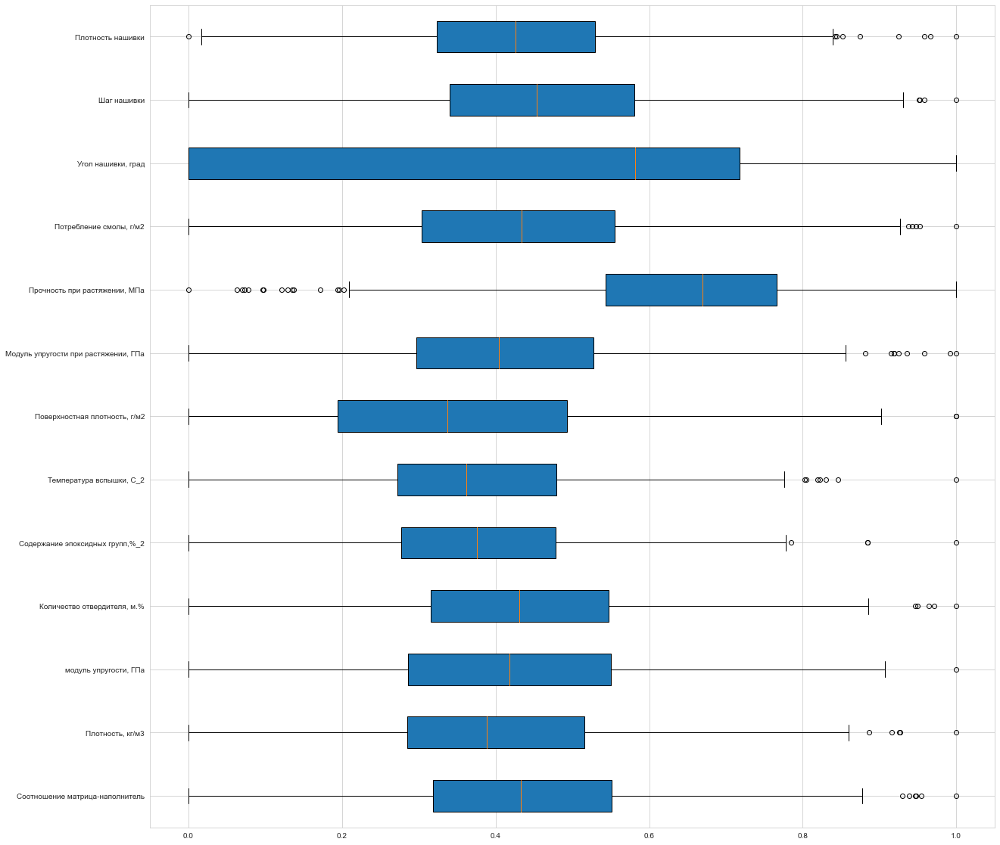

In [63]:
scaler = MinMaxScaler()
scaler.fit(df_norm_n)
plt.figure(figsize=(20, 20))

plt.boxplot(pd.DataFrame(scaler.transform(df_norm_n)), labels = df_norm_n.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

Произведем построение "ящиков с усами"

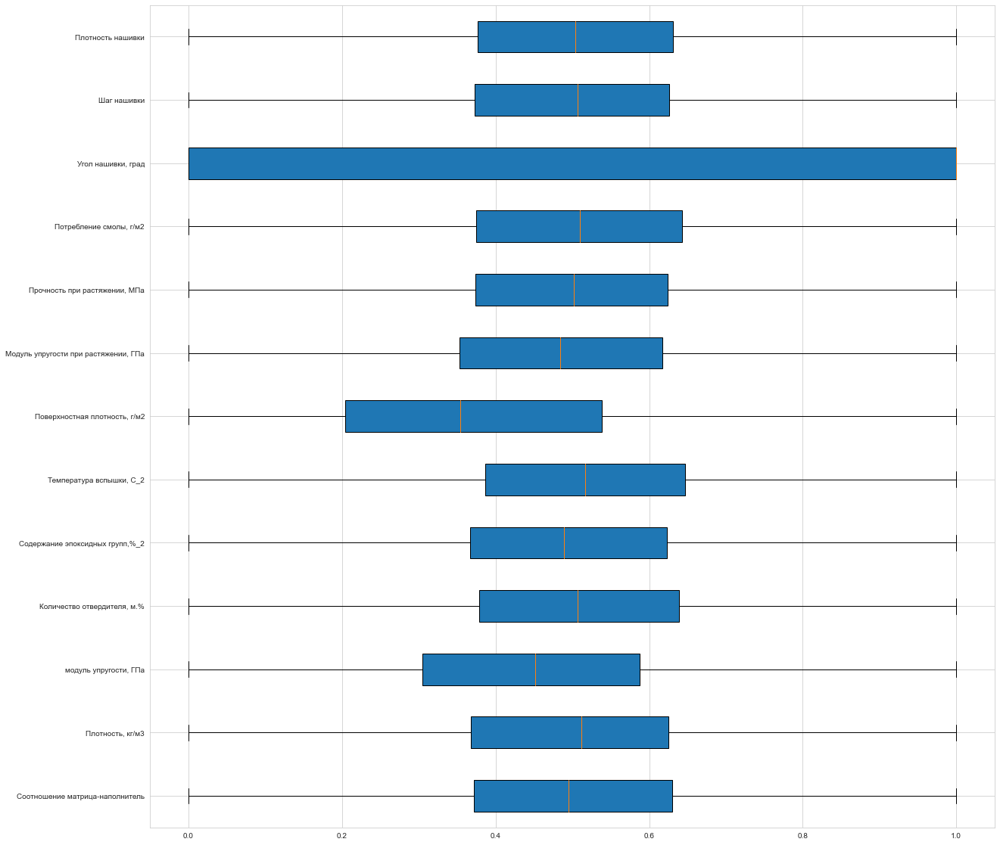

In [64]:
#Построим на "ящики с усами"
scaler = MinMaxScaler()
scaler.fit(df_minmax_n)
plt.figure(figsize=(20, 20))
#Выводим "ящики"
plt.boxplot(pd.DataFrame(scaler.transform(df_minmax_n)), labels = df_minmax_n.columns, patch_artist=True, meanline=True,vert=False)
plt.show()

Из получившихся графиков видим, что нормализация с помощью "Normalizer" добавляет большое количество выбросов

### Стандартизируем данные

In [65]:
X1 = df_minmax_n.copy()
X2 = df_norm_n.copy()

In [66]:
df_std_X1 = preprocessing.StandardScaler().fit(X1)
df_standart_X1 = df_std_X1.transform(X1)
df_standart_1 = pd.DataFrame(df_standart_X1)

<AxesSubplot:ylabel='Density'>

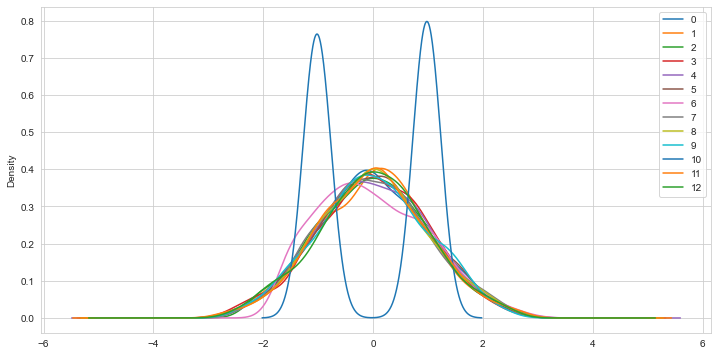

In [67]:
fig, ax = plt.subplots(figsize = (12, 6))
df_standart_1.plot(kind = 'kde', ax = ax)

In [68]:
df_standart_1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.733662,-0.310284,0.539767,-0.902956,-0.868217,0.979545,-0.974830,-0.070267,-0.163679,-1.629244,0.978538,0.853400,-0.948449
918,0.576611,1.069974,-0.889924,1.303201,-1.087006,-0.811326,-0.470122,-0.126524,-0.223019,-1.756683,0.978538,1.446055,-0.342933
919,0.394018,-0.024589,-0.975122,-0.022536,0.734311,-0.958342,0.919470,0.473140,0.444312,0.324984,0.978538,-1.102660,0.905599
920,0.868603,1.305328,0.016356,1.131763,-1.234469,-0.263996,0.567419,0.244441,-0.859827,-0.366368,0.978538,-0.246233,0.062808


In [69]:
df_std_X2 = preprocessing.StandardScaler().fit(X2)
df_standart_X2 = df_std_X2.transform(X2)
df_standart_2 = pd.DataFrame(df_standart_X2)

In [70]:
df_standart_2

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.350192,-0.799214,-0.225252,-2.254820,-0.328970,-0.670746,-1.055146,-1.354391,1.085327,-0.366843,-1.010334,-1.269833,-0.336654
1,-1.351555,-0.805818,-0.226871,0.109705,-0.994960,-0.399931,-1.055671,-1.360303,1.076239,-0.369337,-1.010334,-0.938452,-1.260561
2,-0.493340,-0.808635,-0.187538,-0.404676,-0.727764,-0.676408,-1.055895,-1.362824,1.072364,-0.370400,-1.010334,-0.939006,-0.553760
3,-0.484470,-0.894906,-0.191820,-0.389125,-0.700427,-0.652807,-1.052772,-1.327673,1.126398,-0.355573,-1.010334,-0.931289,-0.321661
4,-0.648471,-1.195238,-0.003777,-0.357015,-0.643981,-0.604077,-1.046323,-1.255094,1.237965,-0.324958,-1.010334,-0.915357,0.437054
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.646989,0.071191,0.640442,-0.763387,-0.506773,0.899549,-0.959234,0.141979,0.067474,-1.480249,1.005430,0.862355,-0.767250
918,0.675557,0.692301,-0.845442,1.342074,-0.573159,-0.465864,-0.419079,0.261611,0.111113,-1.571006,1.036772,1.493218,-0.152252
919,0.238696,-0.372565,-1.034584,-0.172081,0.240071,-0.957594,0.836860,-0.185900,0.614927,0.153180,0.889866,-1.103964,0.592721
920,1.072359,1.046907,0.191534,1.316523,-0.520298,0.139479,0.731995,0.657348,-0.939056,-0.136692,1.092539,-0.087790,0.351030


Производим визуализацию данных корреляции

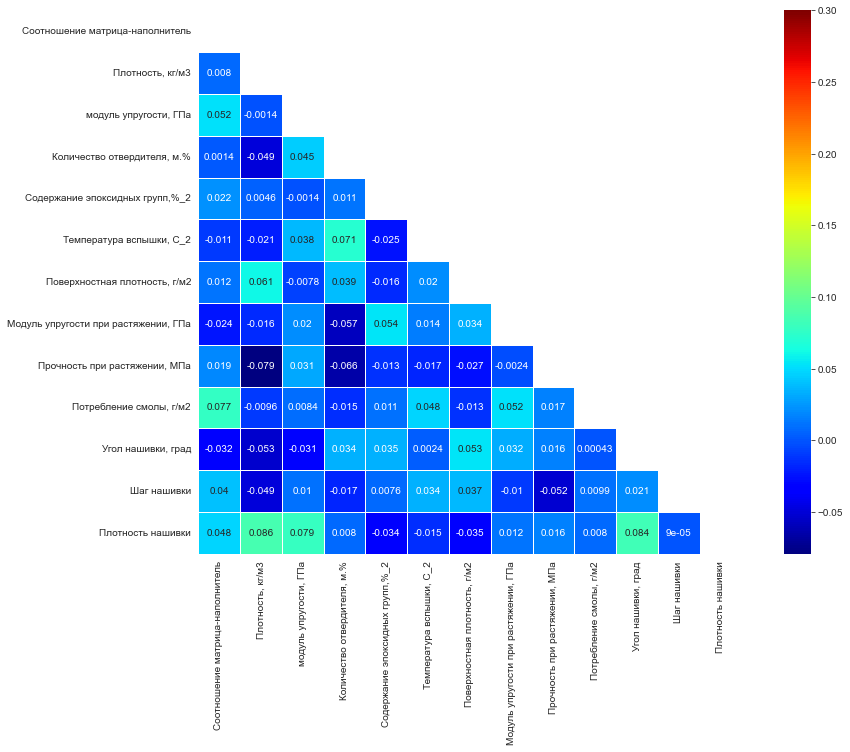

In [71]:
#Визуализаруем данные корреляции
len(X1)
f, ax = plt.subplots(figsize=(15, 10))
corr = np.round_(X1.corr(), decimals=5)
sns.heatmap(corr,annot=True,cmap='jet',square=True,linewidths=1,vmax=.3, mask = np.triu(X1.corr()));

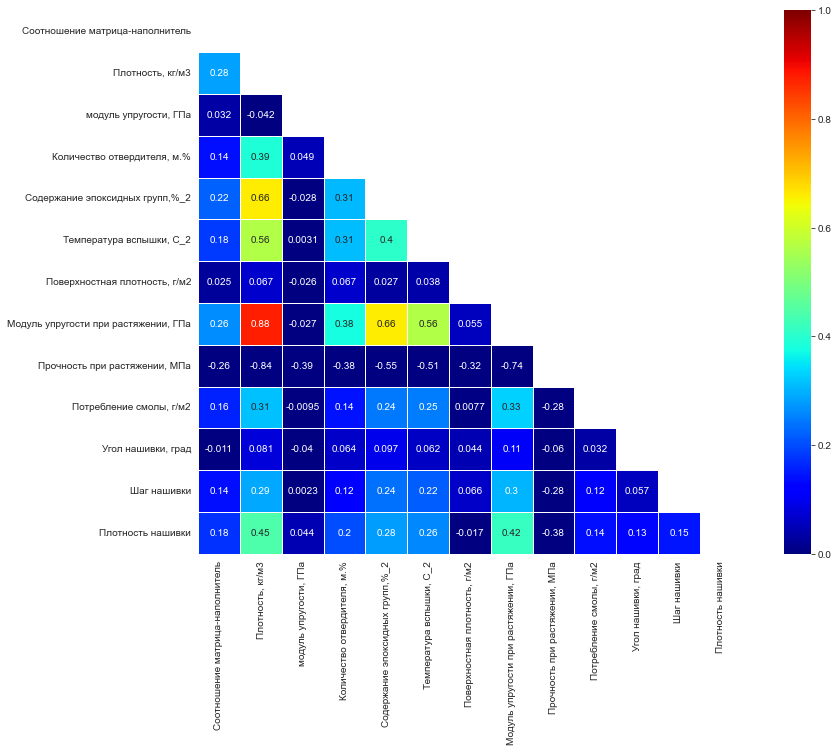

In [72]:
len(X2)
f, ax = plt.subplots(figsize=(15, 10))
corr = np.round_(X2.corr(), decimals=5)
sns.heatmap(corr,annot=True,cmap='jet',square=True,linewidths=1,vmin=0, vmax=1, mask = np.triu(X2.corr()));

Производим визуализацию данных корреляции

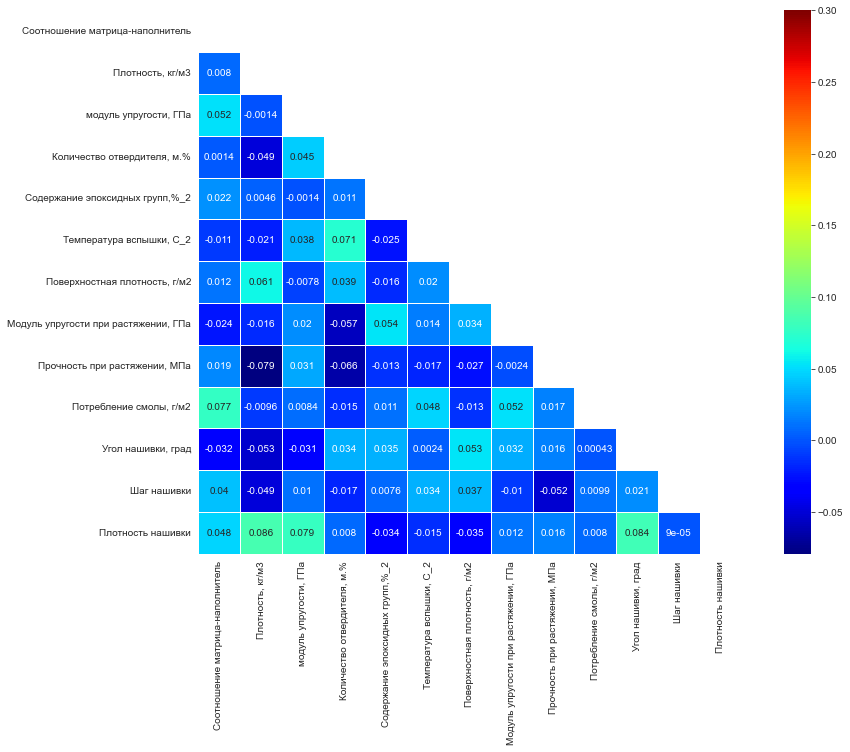

In [73]:
len(df)
f, ax = plt.subplots(figsize=(15, 10))
corr = np.round_(df.corr(), decimals=5)
sns.heatmap(corr,annot=True,cmap='jet',square=True,linewidths=1,vmax=.3, mask = np.triu(df.corr()));

In [74]:
df_norm_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.000885,0.596933,0.220034,0.033650,0.006715,0.086555,0.144856,0.022170,0.730955,0.065896,0.013900,0.002100,0.017398
std,0.000286,0.064469,0.095697,0.008970,0.001016,0.015040,0.083856,0.002484,0.069241,0.018504,0.013765,0.000808,0.003793
min,0.000163,0.444650,0.000709,0.011339,0.004113,0.049402,0.000230,0.016105,0.462927,0.021630,0.000000,0.000011,0.007195
25%,0.000685,0.552643,0.150854,0.027607,0.005990,0.076164,0.080741,0.020402,0.688019,0.052457,0.000000,0.001543,0.014855
50%,0.000872,0.591998,0.219789,0.033547,0.006653,0.084991,0.140085,0.021966,0.740423,0.065555,0.021931,0.002053,0.017293
75%,0.001067,0.640028,0.289210,0.039557,0.007346,0.096577,0.204258,0.023756,0.780490,0.077870,0.027092,0.002629,0.019756
max,0.001803,0.823683,0.524864,0.062919,0.010879,0.147861,0.414371,0.030598,0.877580,0.122973,0.037721,0.004519,0.030905


In [75]:
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Разработка и обучение моделей 

Данные в нашем итоговом датасете в основном непрерывные и на ум приходит сразу решение данной задачи с использованием регрессионных моделей. 
Но попарные графики рассеивания точек и тепловая карта не дают нам реальной взаимосвязи и возможности прямого прогнозирования, поэтому будем использовать и категориальные подходы к прогнозированию (например, попробуем метод ближайших соседей) или обучение со скрытыми слоями, чтобы выявить дополнительные взаимосвязи. 
'Данные в нашем итоговом датасете в основном непрерывные и на ум приходит сразу решение данной задачи с использованием регрессионных моделей.
Но попарные графики рассеивания точек и тепловая карта не дают нам реальной взаимосвязи и возможности прямого прогнозирования, поэтому будем использовать и категориальные подходы к прогнозированию (например, попробуем метод ближайших соседей) или обучение со скрытыми слоями, чтобы выявить дополнительные взаимосвязи.

# Первый вариант

In [76]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Прочность при растяжении, МПа'],
    df[['Прочность при растяжении, МПа']],
       test_size = 0.3,
    random_state = 42)

In [77]:
# Проверка правильности разбивки
df_norm_n.shape[0] - x_train_1.shape[0] - x_test_1.shape[0]

0

In [78]:
x_train_1.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.000528,0.588865,0.132104,0.020990,0.006252,0.071426,0.186019,0.020212,0.073012,0.026146,0.002284,0.015558
650,0.000430,0.617063,0.232420,0.027241,0.007343,0.075550,0.081315,0.024828,0.056818,0.027692,0.001349,0.018303
483,0.000580,0.585227,0.170459,0.043386,0.007071,0.096516,0.132760,0.021190,0.041473,0.026529,0.002249,0.018923
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.018527,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595470,0.263881,0.034151,0.007516,0.089544,0.095557,0.023511,0.086300,0.028987,0.002764,0.017172


In [79]:
y_train_1

,"Прочность при растяжении, МПа"
552,2641.571967
735,2404.068921
554,2619.854215
403,2793.783901
948,2298.985700
...,...
120,1994.674603
306,2419.732206
959,2758.414767
497,2347.135204


In [80]:
y_test_1

,"Прочность при растяжении, МПа"
360,2167.533030
427,2705.819718
611,2952.839631
336,2305.241225
604,1399.118555
...,...
479,3305.286922
149,2085.866383
561,2461.609016
632,2616.114331


In [81]:
y_train_1.shape

(645, 1)

In [82]:
#Функция для сравнения результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_1):
    return [np.mean(y_test_1) for _ in range(len(y_test_1))]
y_1_pred_mean = mean_model(y_test_1)

C:\Users\PC\AppData\Roaming\Python\Python39\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


# Проверка различных моделей при стандартных параметрах

## Метод опорных векторов - 1

In [83]:
svr = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr.fit(x_train_1, np.ravel(y_train_1))
#вычисляем коэффициент детерминации
y_pred_svr=svr.predict(x_test_1)
mae_svr = mean_absolute_error(y_pred_svr, y_test_1)
mse_svr_elast = mean_squared_error(y_test_1,y_pred_svr)
print('Обработка результатов регрессии опорного вектора:') 
print("Оценка теста: {:.2f}".format(svr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Результаты регрессии опорных векторов:')
print('SVR_MAE - Метод опорных векторов для решения задач регрессии:', round(mean_absolute_error(y_test_1, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_svr)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast)))
print("Оценка теста: {:.2f}".format(svr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Обработка результатов регрессии опорного вектора:
Оценка теста: 0.99
Результаты регрессии опорных векторов:
SVR_MAE - Метод опорных векторов для решения задач регрессии: 79
SVR_MAPE: 0.04
SVR_MSE: 11675.37
SVR_RMSE: 108.05
Оценка теста: 0.95


In [84]:
#Результаты модели, выдающей среднее значение
mse_lin_elast_mean = mean_squared_error(y_test_1, y_1_pred_mean)
print("MAE среднее значение: ", mean_absolute_error(y_test_1, y_1_pred_mean))
print("MSE среднее значение: ", mse_lin_elast_mean)
print("RMSE среднее значение: ", np.sqrt(mse_lin_elast_mean))

MAE среднее значение:  368.96801863398946
MSE среднее значение:  214046.3755454378
RMSE среднее значение:  462.65146227526157


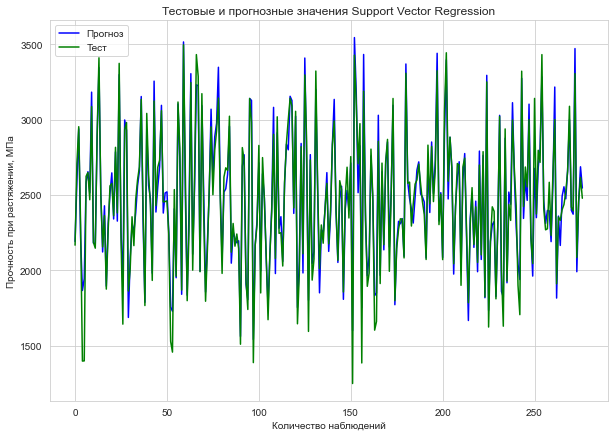

In [85]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr, label = "Прогноз", color = "blue")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

# Метод случайного леса - Random Forest Regressor - 2

In [86]:
#построение модели и вузуализация метода случайный лес
rfr = RandomForestRegressor(n_estimators=15,max_depth=7, random_state=33)
rfr.fit(x_train_1, y_train_1.values)
y_pred_forest = rfr.predict(x_test_1)
mae_rfr = mean_absolute_error(y_pred_forest, y_test_1)
mse_rfr_elast = mean_squared_error(y_test_1,y_pred_forest)
print('Последовательность результатов случайного лесного регрессора:')
print("Оценка теста: {:.2f}".format(rfr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Результаты случайного лесного регрессора:')
print('RF_MAE: ', round(mean_absolute_error(y_test_1, y_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast)))
print("Оценка теста: {:.2f}".format(rfr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Последовательность результатов случайного лесного регрессора:
Оценка теста: 0.98
Результаты случайного лесного регрессора:
RF_MAE:  76
RF_MAPE: 0.03
RF_MSE: 9444.06
RF_RMSE: 97.18
Оценка теста: 0.96


C:\Users\PC\AppData\Local\Temp\ipykernel_260\3433026780.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(x_train_1, y_train_1.values)


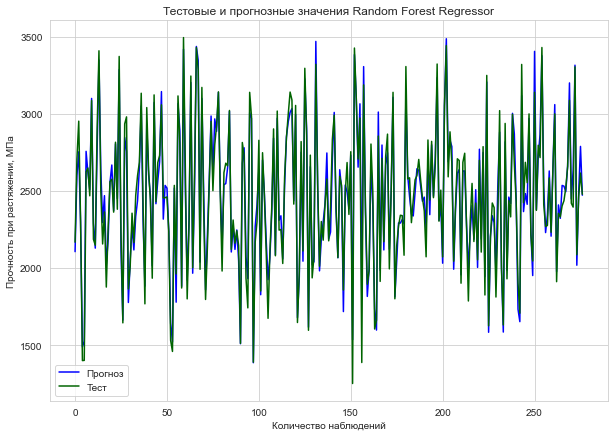

In [87]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y_pred_forest, label = "Прогноз", color = "blue")
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [88]:
#построение модели и вузуализация Линейной регрессии
lr = LinearRegression()
lr.fit(x_train_1, y_train_1)
y_pred_lr = lr.predict(x_test_1)
mae_lr = mean_absolute_error(y_pred_lr, y_test_1)
mse_lin_elast = mean_squared_error(y_test_1, y_pred_lr)
print('Обработка результатов линейной регрессии:') # Скор для тренировочной выборки
print("Оценка теста: {:.2f}".format(lr.score(x_train_1, y_train_1)))
print('Результаты линейной регрессии:')    
print('lr_MAE: ', round(mean_absolute_error(y_test_1, y_pred_lr)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_lr)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast)))
print("Оценка теста: {:.2f}".format(lr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Обработка результатов линейной регрессии:
Оценка теста: 0.97
Результаты линейной регрессии:
lr_MAE:  62
lr_MAPE: 0.03
lr_MSE: 6150.48
lr_RMSE: 78.43
Оценка теста: 0.97


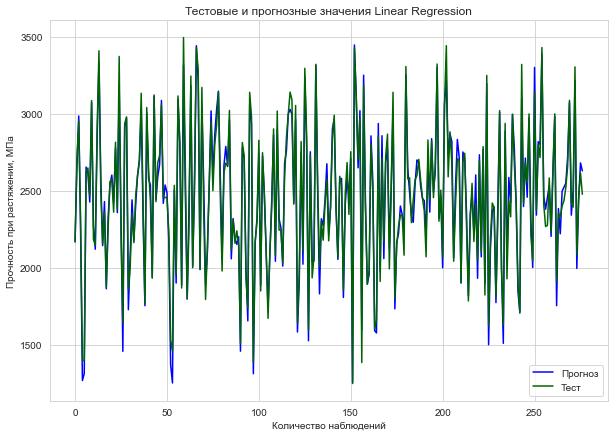

In [89]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr, label="Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

#Линейная регрессия с задачей справилась в 97 % случаев.

In [90]:
#Визуализация гистограммы распределения ошибки

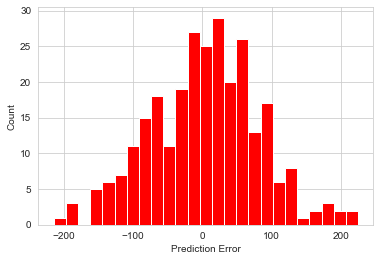

In [91]:
error = y_test_1 - y_pred_lr
plt.hist(error, bins = 25, color = "r")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

## Метода градиентного бустинга - Gradient Boosting Regressor - 4

In [92]:
gbr = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gbr.fit(x_train_1, np.ravel(y_train_1))
y_pred_gbr = gbr.predict(x_test_1)
mae_gbr = mean_absolute_error(y_pred_gbr, y_test_1)
mse_gbr_elast = mean_squared_error(y_test_1,y_pred_gbr)
print('Последовательность результатов регрессора градиентного повышения:')
print("Оценка теста: {:.2f}".format(gbr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Результаты регрессора градиентного повышения:')
print('GBR_MAE: ', round(mean_absolute_error(y_test_1, y_pred_gbr)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_gbr)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast)))
print("Оценка теста: {:.2f}".format(gbr.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Последовательность результатов регрессора градиентного повышения:
Оценка теста: 0.99
Результаты регрессора градиентного повышения:
GBR_MAE:  64
GBR_MAPE: 0.03
GBR_MSE: 6584.76
GBR_RMSE: 81.15
Оценка теста: 0.97


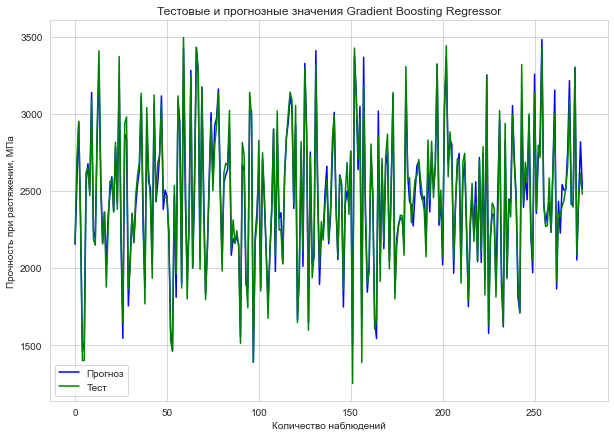

In [93]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr, label = "Прогноз", color = "blue")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);
#Градиентный бустинг с задачей справился в 97 % случаев.

# Метод К ближайших соседей - K Neighbors Regressor - 5

In [94]:
# Метод К ближайших соседей - K Neighbors Regressor - 5
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train_1, y_train_1)
y_pred_knn = knn.predict(x_test_1)
mae_knr = mean_absolute_error(y_pred_knn, y_test_1)
mse_knn_elast = mean_squared_error(y_test_1,y_pred_knn)
print('Последовательность результатов регрессора Метод К ближайших соседей:')
print("Test scoree: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Результы регрессора Метод К ближайших соседей:')
print('KNN_MAE: ', round(mean_absolute_error(y_test_1, y_pred_knn)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_knn)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast)))
print("Test score: {:.2f}".format(knn.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Последовательность результатов регрессора Метод К ближайших соседей:
Test scoree: 0.94
Результы регрессора Метод К ближайших соседей:
KNN_MAE:  102
KNN_MAPE: 0.04
KNN_MSE: 16367.88
KNN_RMSE: 127.94
Test score: 0.92


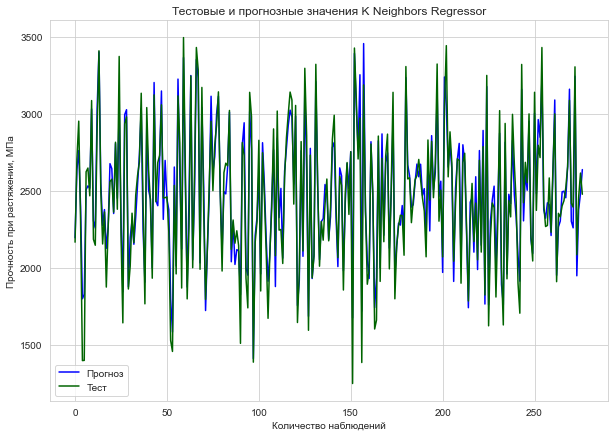

In [95]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn, label = "Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

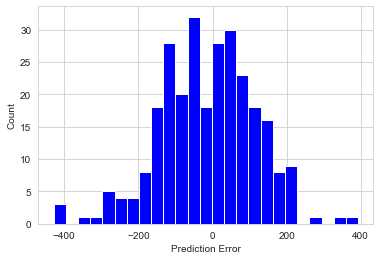

In [96]:
#Визуализация гистограммы распределения ошибки
error = y_test_1 - y_pred_knn
plt.hist(error, bins = 25, color = "b")
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

## Деревья решений - Decision Tree Regressor - 6

In [97]:
#Деревья решений - Decision Tree Regressor - 6

dtr = DecisionTreeRegressor()
dtr.fit(x_train_1, y_train_1.values)
y_pred_dtr = dtr.predict(x_test_1)
mae_dtr = mean_absolute_error(y_pred_dtr, y_test_1)
mse_dtr_elast = mean_squared_error(y_test_1,y_pred_dtr)
print('Последовательность результатов регрессора дерева решений:')
print("Оценка теста: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Результаты регрессора дерева решений:')
print('DTR_MAE: ', round(mean_absolute_error(y_test_1, y_pred_dtr)))
print('DTR_MSE: {:.2f}'.format(mse_dtr_elast))
print("DTR_RMSE: {:.2f}".format (np.sqrt(mse_dtr_elast)))
print('DTR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_dtr)))
print("Оценка теста: {:.2f}".format(dtr.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Последовательность результатов регрессора дерева решений:
Оценка теста: 0.94
Результаты регрессора дерева решений:
DTR_MAE:  111
DTR_MSE: 19807.53
DTR_RMSE: 140.74
DTR_MAPE: 0.05
Оценка теста: 0.91


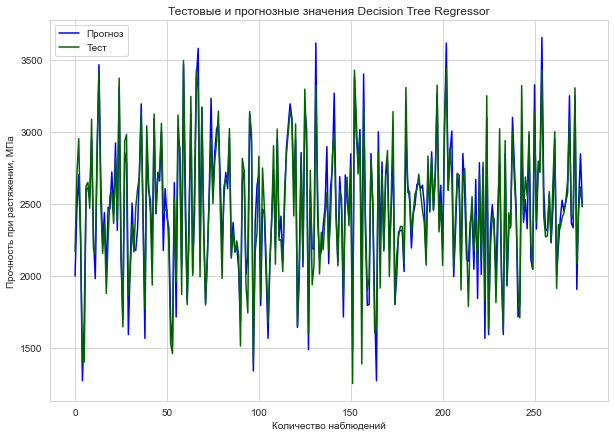

In [98]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor")
plt.plot(y_pred_dtr, label = "Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

## Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7

In [99]:
# Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7 

sdg = SGDRegressor()
sdg.fit(x_train_1, y_train_1)
y_pred_sdg = sdg.predict(x_test_1)
mae_sdg = mean_absolute_error(y_pred_sdg, y_test_1)
mse_sdg_elast = mean_squared_error(y_test_1,y_pred_sdg)
print('Последовательность результатов регрессора стохастического градиентного спуска:')
print("Оценка теста: {:.2f}".format(sdg.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Результаты регрессора стохастического градиентного спуска:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_sdg)))
print('SGD_MSE: {:.2f}'.format(mse_sdg_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_sdg_elast)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_sdg)))
print("Оценка теста: {:.2f}".format(sdg.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Последовательность результатов регрессора стохастического градиентного спуска:
Оценка теста: 0.74
Результаты регрессора стохастического градиентного спуска:
SGD_MAE:  182
SGD_MSE: 52349.74
SGD_RMSE: 228.80
SGD_MAPE: 0.08
Оценка теста: 0.76


C:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


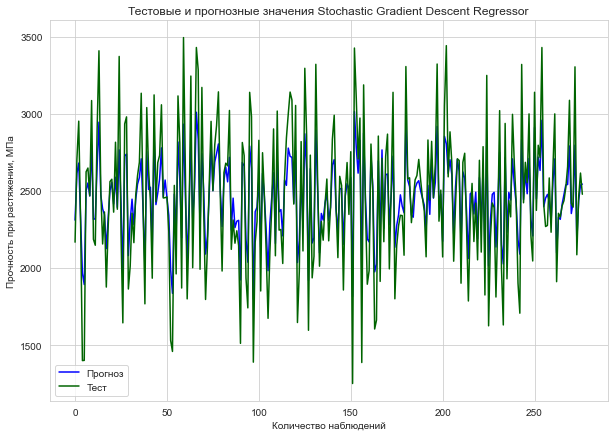

In [100]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Stochastic Gradient Descent Regressor")
plt.plot(y_pred_sdg, label = "Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

## Многослойный перцептрон - Multi-layer Perceptron regressor - 8

In [101]:
# Многослойный перцептрон - Multi-layer Perceptron regressor - 8

mlp = MLPRegressor(random_state = 1, max_iter = 500)
mlp.fit(x_train_1, y_train_1)
y_pred_mlp = mlp.predict(x_test_1)
mae_mlp = mean_absolute_error(y_pred_mlp, y_test_1)
mse_mlp_elast = mean_squared_error(y_test_1,y_pred_mlp)
print('Последовательность результатов многослойного регрессора перцептрона:')
print("Оценка теста: {:.2f}".format(mlp.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Multi-layer Perceptron regressor Results:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_mlp)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_mlp)))
print('SGD_MSE: {:.2f}'.format(mse_mlp_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_mlp_elast)))
print("Оценка теста: {:.2f}".format(mlp.score(x_test_1, y_test_1)))# Скор для тестовой выборки

C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1599: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Последовательность результатов многослойного регрессора перцептрона:
Оценка теста: -16.25
Multi-layer Perceptron regressor Results:
SGD_MAE:  1807
SGD_MAPE: 0.72
SGD_MSE: 3514752.02
SGD_RMSE: 1874.77
Оценка теста: -15.42


C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


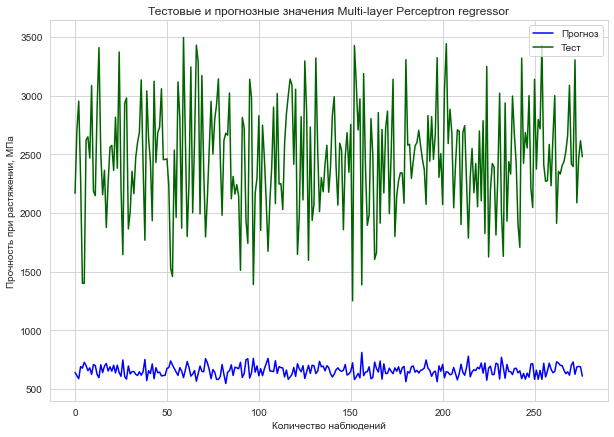

In [102]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Multi-layer Perceptron regressor")
plt.plot(y_pred_mlp, label = "Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

## Лассо регрессия - the Lasso - 9

In [103]:
# Лассо регрессия - the Lasso - 9

clf = linear_model.Lasso(alpha=0.1)
clf.fit(x_train_1, y_train_1)
y_pred_clf = clf.predict(x_test_1)
mae_clf = mean_absolute_error(y_pred_clf, y_test_1)
mse_clf_elast = mean_squared_error(y_test_1,y_pred_clf)
print('Поезд результатов лассо-регрессии:')
print("Оценка теста: {:.2f}".format(clf.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Результаты лассо-регрессии:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_1, y_pred_clf)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_clf)))
print('SGD_MSE: {:.2f}'.format(mse_clf_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_clf_elast)))
print("Оценка теста: {:.2f}".format(clf.score(x_test_1, y_test_1)))# Скор для тестовой выборки

Поезд результатов лассо-регрессии:
Оценка теста: 0.95
Результаты лассо-регрессии:
SGD_MAE:  69
SGD_MAPE: 0.03
SGD_MSE: 7755.63
SGD_RMSE: 88.07
Оценка теста: 0.96


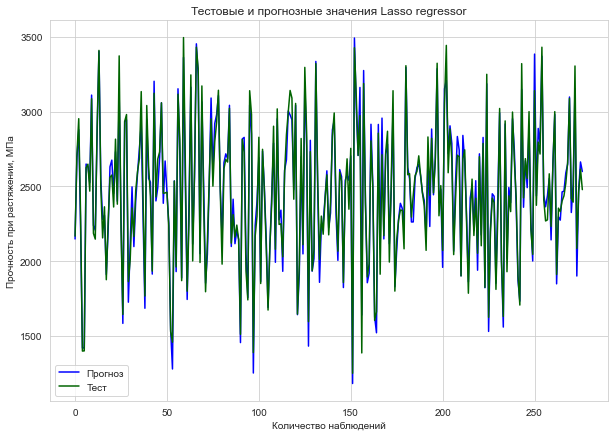

In [104]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Lasso regressor")
plt.plot(y_pred_clf, label = "Прогноз", color = 'blue')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [105]:
#сравним наши модели по метрике МАЕ
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_dtr, mae_sdg, mae_mlp, mae_clf]} 

mae_df = pd.DataFrame(mae_df)

In [106]:
mae_df

,Регрессор,MAE
0,Support Vector,78.504335
1,RandomForest,76.232467
2,Linear Regression,61.997363
3,GradientBoosting,63.587420
4,KNeighbors,101.706291
5,DecisionTree,110.604948
6,SGD,181.812673
7,MLP,1807.247962
8,Lasso,69.470901



# Поиск оптимальных гиперпараметров.

В машинном обучении гиперпараметрами называют параметры алгоритмов, значения которых устанавливаются перед запуском процесса обучения.

В этом смысле они и отличаются от обычных параметров, вычисляемых в процессе обучения. Гиперпараметры используются для управления процессом обучения.

Один из способов настройки гиперпараметров состоит в том, чтобы заставить компьютер попробовать все возможные комбинации значений параметров. 

Для этого используем модуль GridSearchCV из библиотеки Scikit Learn. Попытаемся найти наилучшую комбинацию гиперпараметров для построения классификатора для нашего набора данных.

-Метод GridSearch:

ПЛЮСЫ: Этот метод получит требуемые оптимальные гиперпараметры.

МИНУСЫ: Операция является исчерпывающей. Если диапазон или число гиперпараметров велики, то вероятности могут исчисляться миллионами, и на завершение потребуется довольно много времени.
Для этого используем модуль GridSearchCV из библиотеки Scikit Learn. Попытаемся найти наилучшую комбинацию гиперпараметров для построения классификатора для нашего набора данных.

-Метод GridSearch:

ПЛЮСЫ: Этот метод получит требуемые оптимальные гиперпараметры.

МИНУСЫ: Операция является исчерпывающей. Если диапазон или число гиперпараметров велики, то вероятности могут исчисляться миллионами, и на завершение потребуется довольно много времени.

In [107]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# модели случайного леса - Random Forest Regressor - 2

parametrs = { 'n_estimators': [200, 300],
              'max_depth': [9, 15],
              'max_features': ['auto'],
              'criterion': ['mse'] }
grid = GridSearchCV(estimator = rfr, param_grid = parametrs, cv = 10)
grid.fit(x_train_1, y_train_1)

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['mse'], 'max_depth': [9, 15],
                         'max_features': ['auto'], 'n_estimators': [200, 300]})

In [108]:
grid.best_params_

{'criterion': 'mse',
 'max_depth': 15,
 'max_features': 'auto',
 'n_estimators': 300}

In [109]:
#Выводим гиперпараметры для оптимальной модели
print(grid.best_estimator_)
knr_upr = grid.best_estimator_
print(f'R2-score RFR для прочности при растяжении, МПа: {knr_upr.score(x_test_1, y_test_1).round(3)}')

RandomForestRegressor(criterion='mse', max_depth=15, n_estimators=300,
                      random_state=33)
R2-score RFR для прочности при растяжении, МПа: 0.964


In [110]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr_grid = RandomForestRegressor(n_estimators = 200, criterion = 'mse', max_depth = 15, max_features = 'auto')
#Обучаем модель
rfr_grid.fit(x_train_1, y_train_1)

predictions_rfr_grid = rfr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_rfr_grid = mean_absolute_error(predictions_rfr_grid, y_test_1)
mae_rfr_grid

C:\Users\PC\AppData\Local\Temp\ipykernel_260\3714436440.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr_grid.fit(x_train_1, y_train_1)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


68.48166906120477

In [111]:
new_row_in_mae_df = {'Регрессор': 'RandomForest_GridSearchCV', 'MAE': mae_rfr_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_260\2950673685.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)


In [112]:
# поиск гипермараметров не дал улучшений для уже имеющейся модели RandomForestRegressor
# вероятно, нужно указывать больше вариаций параметров при работе с GridSearchCV
mae_df

,Регрессор,MAE
0,Support Vector,78.504335
1,RandomForest,76.232467
2,Linear Regression,61.997363
3,GradientBoosting,63.587420
4,KNeighbors,101.706291
5,DecisionTree,110.604948
6,SGD,181.812673
7,MLP,1807.247962
8,Lasso,69.470901
9,RandomForest_GridSearchCV,68.481669


In [113]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn = KNeighborsRegressor()
knn_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs = GridSearchCV(knn, knn_params, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs.fit(x_train_1, y_train_1)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 7, 'weights': 'distance'}

In [114]:
#Выводим гиперпараметры для оптимальной модели
print(gs.best_estimator_)
gs1 = gs.best_estimator_
print(f'R2-score KNR для прочности при растяжении, МПа: {gs1.score(x_test_1, y_test_1).round(3)}')

KNeighborsRegressor(n_neighbors=7, weights='distance')
R2-score KNR для прочности при растяжении, МПа: 0.923


In [115]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn_grid.fit(x_train_1, y_train_1)

predictions_knn_grid = knn_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_knn_grid = mean_absolute_error(predictions_knn_grid, y_test_1)
mae_knn_grid

98.8759722540006

In [116]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': mae_knn_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

C:\Users\PC\AppData\Local\Temp\ipykernel_260\1380152629.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)


,Регрессор,MAE
0,Support Vector,78.504335
1,RandomForest,76.232467
2,Linear Regression,61.997363
3,GradientBoosting,63.587420
4,KNeighbors,101.706291
5,DecisionTree,110.604948
6,SGD,181.812673
7,MLP,1807.247962
8,Lasso,69.470901
9,RandomForest_GridSearchCV,68.481669


In [117]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
#Деревья решений - Decision Tree Regressor - 6
criterion = ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
splitter = ['best', 'random']
max_depth = [3,5,7,9,11]
min_samples_leaf = [100,150,200]
min_samples_split = [200,250,300]
max_features = ['auto', 'sqrt', 'log2']
param_grid = {'criterion': criterion,
               'splitter': splitter,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features}
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs4 = GridSearchCV(dtr, param_grid, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs4.fit(x_train_1, y_train_1)
dtr_3 = gs4.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


{'algorithm': 'auto', 'n_neighbors': 7, 'weights': 'distance'}

In [118]:
#Выводим гиперпараметры для оптимальной модели
print(gs4.best_estimator_)
gs1 = gs4.best_estimator_
print(f'R2-score DTR для прочности при растяжении, МПа: {gs4.score(x_test_1, y_test_1).round(3)}')

DecisionTreeRegressor(criterion='poisson', max_depth=5, max_features='auto',
                      min_samples_leaf=100, min_samples_split=250)
R2-score DTR для прочности при растяжении, МПа: 0.779


In [119]:
#подставим оптимальные гиперпараметры в нашу модель метода деревья решений
dtr_grid = DecisionTreeRegressor(criterion = 'poisson', max_depth = 7, max_features = 'auto',
                      min_samples_leaf = 100, min_samples_split = 250)
#Обучаем модель
dtr_grid.fit(x_train_1, y_train_1)

predictions_dtr_grid = dtr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_dtr_grid = mean_absolute_error(predictions_dtr_grid, y_test_1)
mae_dtr_grid

168.6187557145854

In [120]:
new_row_in_mae_df = {'Регрессор': 'DecisionTree_GridSearchCV', 'MAE': mae_dtr_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index = True)
mae_df

C:\Users\PC\AppData\Local\Temp\ipykernel_260\3433968707.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df.append(new_row_in_mae_df, ignore_index = True)


,Регрессор,MAE
0,Support Vector,78.504335
1,RandomForest,76.232467
2,Linear Regression,61.997363
3,GradientBoosting,63.587420
4,KNeighbors,101.706291
5,DecisionTree,110.604948
6,SGD,181.812673
7,MLP,1807.247962
8,Lasso,69.470901
9,RandomForest_GridSearchCV,68.481669


In [121]:
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators = 100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [DecisionTreeRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [SGDRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [MLPRegressor(random_state = 1, max_iter = 500)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [linear_model.Lasso(alpha = 0.1)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid = GridSearchCV(pipe, param_grid, cv = 10)
grid.fit(x_train_1, np.ravel(y_train_1))
print("Наилучшие параметры:\n{}\n".format(grid.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(x_test_1, y_test_1)))

C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Ma

C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Наилучшие параметры:
{'preprocessing': MinMaxScaler(), 'regressor': Lasso(alpha=0.1)}

Наилучшее значение правильности перекрестной проверки: 0.97
Правильность на тестовом наборе: 0.97


C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [122]:
print("Наилучшая модель:\n{}".format(grid.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', Lasso(alpha=0.1))])


## Прогнозируем модуль упругости при растяжении, ГПа

In [123]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
normalizer = Normalizer()
res = normalizer.fit_transform(df)
df_norm_n = pd.DataFrame(res, columns = df.columns)
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Модуль упругости при растяжении, ГПа'],
    df[['Модуль упругости при растяжении, ГПа']],
       test_size = 0.3,
    random_state = 42)

In [124]:
# Проверка правильности разбивки
df_norm_n.shape[0] - x_train_2.shape[0] - x_test_2.shape[0]

0

In [125]:
x_train_2.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.000528,0.588865,0.132104,0.020990,0.006252,0.071426,0.186019,0.767419,0.073012,0.026146,0.002284,0.015558
650,0.000430,0.617063,0.232420,0.027241,0.007343,0.075550,0.081315,0.739696,0.056818,0.027692,0.001349,0.018303
483,0.000580,0.585227,0.170459,0.043386,0.007071,0.096516,0.132760,0.772233,0.041473,0.026529,0.002249,0.018923
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.757679,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595470,0.263881,0.034151,0.007516,0.089544,0.095557,0.740451,0.086300,0.028987,0.002764,0.017172


In [126]:
y_train_2

,"Модуль упругости при растяжении, ГПа"
552,69.573625
735,80.691499
554,71.887367
403,68.314525
948,72.997468
...,...
120,74.519119
306,70.325533
959,77.995289
497,70.199234


In [127]:
y_train_2.shape

(645, 1)

In [128]:
# Функция для сравнения результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_2):
    return [np.mean(y_test_2) for _ in range(len(y_test_2))]
y_2_pred_mean = mean_model(y_test_2)

C:\Users\PC\AppData\Roaming\Python\Python39\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


# Проверка различных моделей при стандартных параметрах
# Метод опорных векторов - 1 

In [132]:
svr2 = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr2.fit(x_train_2, np.ravel(y_train_2))
#вычисляем коэффициент детерминации
y_pred_svr2 = svr2.predict(x_test_2)
mae_svr2 = mean_absolute_error(y_pred_svr2, y_test_2)
mse_svr_elast2 = mean_squared_error(y_test_2,y_pred_svr2)
print('Support Vector Regression Results Train:') 
print("Оценка теста: {:.2f}".format(svr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Результаты регрессии опорных векторов:')
print('SVR_MAE:', round(mean_absolute_error(y_test_2, y_pred_svr2)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_svr2)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast2))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast2)))
print("Оценка теста: {:.2f}".format(svr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Оценка теста: 0.90
Результаты регрессии опорных векторов:
SVR_MAE: 3
SVR_MAPE: 0.05
SVR_MSE: 19.21
SVR_RMSE: 4.38
Оценка теста: -0.94


In [133]:
#Результаты модели, выдающей среднее значение
mse_lin_elast2_mean = mean_squared_error(y_test_2, y_2_pred_mean)
print("MAE для среднего значения: ", mean_absolute_error(y_test_2, y_2_pred_mean))
print("MSE для среднего значения: ", mse_lin_elast2_mean)
print("RMSE для среднего значения: ", np.sqrt(mse_lin_elast2_mean))

MAE для среднего значения:  2.578499535756179
MSE для среднего значения:  9.910360742106828
RMSE для среднего значения:  3.148072543971442


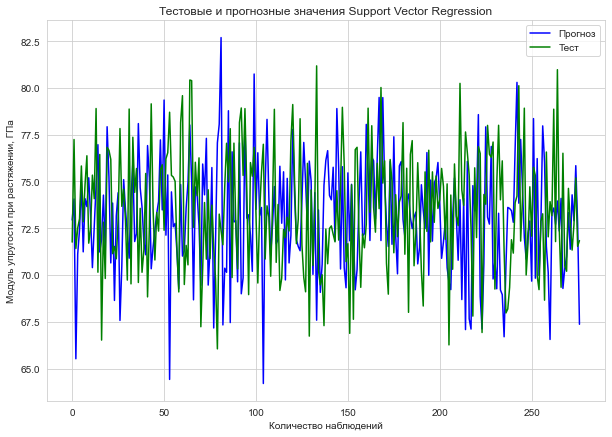

In [134]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr2, label = "Прогноз", color = "blue")
plt.plot(y_test_2.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Метод случайного леса - Random Forest Regressor - 2

In [135]:
#построение модели и вузуализация метода случайный лес
rfr2 = RandomForestRegressor(n_estimators = 15,max_depth = 7, random_state = 33)
rfr2.fit(x_train_2, y_train_2.values)
y2_pred_forest = rfr2.predict(x_test_2)
mae_rfr2 = mean_absolute_error(y2_pred_forest, y_test_2)
mse_rfr_elast2 = mean_squared_error(y_test_2,y2_pred_forest)
print('Последовательность результатов случайного лесного регрессора:')
print("Оценка теста: {:.2f}".format(rfr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Результаты случайного лесного регрессора:')
print('RF_MAE: ', round(mean_absolute_error(y_test_2, y2_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y2_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast2))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast2)))
print("Оценка теста: {:.2f}".format(rfr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Последовательность результатов случайного лесного регрессора:
Оценка теста: 0.43
Результаты случайного лесного регрессора:
RF_MAE:  3
RF_MAPE: 0.04
RF_MSE: 10.21
RF_RMSE: 3.20
Оценка теста: -0.03


C:\Users\PC\AppData\Local\Temp\ipykernel_260\2680555923.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr2.fit(x_train_2, y_train_2.values)


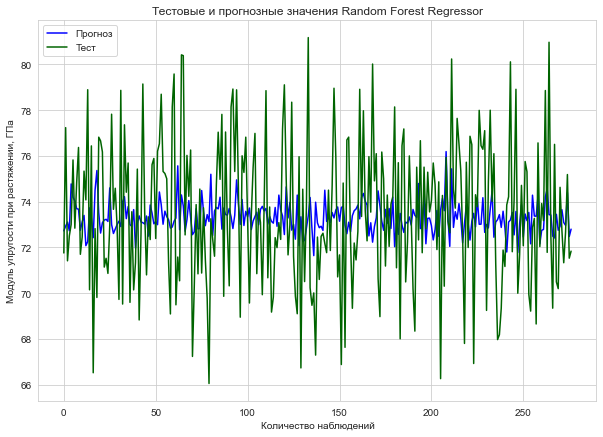

In [136]:
plt.figure(figsize=(10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y2_pred_forest, label = "Прогноз", color = "blue")
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Метод линейной регрессии - Linear Regression - 3

In [137]:
#построение модели и вузуализация Линейной регрессии
lr2 = LinearRegression()
lr2.fit(x_train_2, y_train_2)
y_pred_lr2 = lr2.predict(x_test_2)
mae_lr2 = mean_absolute_error(y_pred_lr2, y_test_2)
mse_lin_elast2 = mean_squared_error(y_test_2, y_pred_lr2)
print('Обработка результатов линейной регрессии:') # Скор для тренировочной выборки
print("Оценка теста: {:.2f}".format(lr2.score(x_train_2, y_train_2)))
print('Результаты линейной регрессии:')    
print('lr_MAE: ', round(mean_absolute_error(y_test_2, y_pred_lr2)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_lr2)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast2))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast2)))
print("Оценка теста: {:.2f}".format(lr2.score(x_test_2, y_test_2))) # Скор для тестовой выборки

Обработка результатов линейной регрессии:
Оценка теста: 0.02
Результаты линейной регрессии:
lr_MAE:  3
lr_MAPE: 0.04
lr_MSE: 10.16
lr_RMSE: 3.19
Оценка теста: -0.03


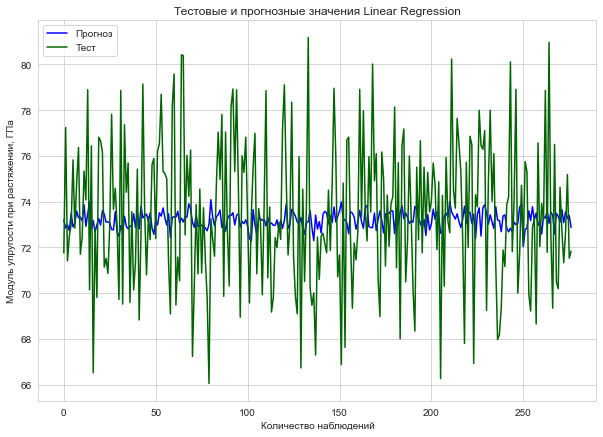

In [138]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

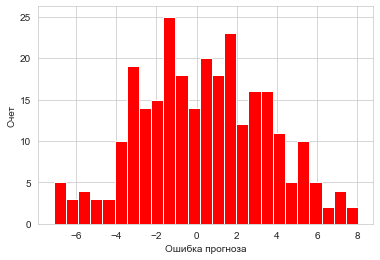

In [140]:
error = y_test_2 - y_pred_lr2
plt.hist(error, bins = 25, color = "r")
plt.xlabel('Ошибка прогноза')
_ = plt.ylabel('Счет')

## градиентный бустинг -4

In [141]:
gbr2 = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gbr2.fit(x_train_2, np.ravel(y_train_2))
y_pred_gbr2 = gbr2.predict(x_test_2)
mae_gbr2 = mean_absolute_error(y_pred_gbr2, y_test_2)
mse_gbr_elast2 = mean_squared_error(y_test_2,y_pred_gbr2)
print('Последовательность результатов регрессора градиентного повышения:')
print("Оценка теста: {:.2f}".format(gbr2.score(x_train_2, y_train_2))) # Скор для тренировочной выборки
print('Результаты регрессора градиентного повышения:')
print('GBR_MAE: ', round(mean_absolute_error(y_test_2, y_pred_gbr2)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_gbr2)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast2))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast2)))
print("Оценка теста: {:.2f}".format(gbr2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Последовательность результатов регрессора градиентного повышения:
Оценка теста: 0.52
Результаты регрессора градиентного повышения:
GBR_MAE:  3
GBR_MAPE: 0.04
GBR_MSE: 10.79
GBR_RMSE: 3.29
Оценка теста: -0.09


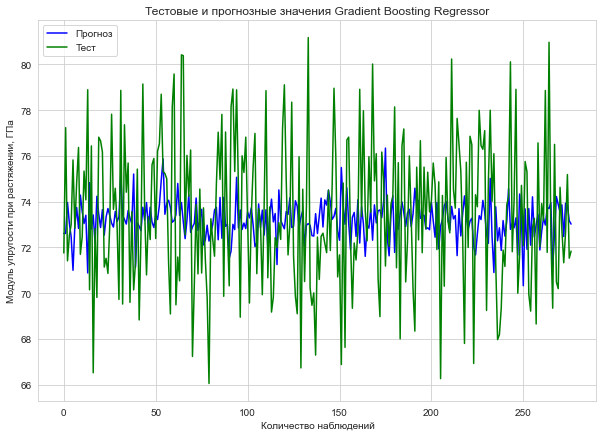

In [142]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr2, label = "Прогноз", color = "blue")
plt.plot(y_test_2.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Метод К ближайших соседей - K Neighbors Regressor - 5

In [143]:
# Метод К ближайших соседей - K Neighbors Regressor - 5
knn2 = KNeighborsRegressor(n_neighbors=5)
knn2.fit(x_train_2, y_train_2)
y_pred_knn2 = knn2.predict(x_test_2)
mae_knr2 = mean_absolute_error(y_pred_knn2, y_test_2)
mse_knn_elast2 = mean_squared_error(y_test_2,y_pred_knn2)
print('Последовательность результатов регрессора Метода К ближайших соседей:')
print("Оценка теста: {:.2f}".format(knn2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Результаты регрессора Метода К ближайших соседей:')
print('KNN_MAE: ', round(mean_absolute_error(y_test_2, y_pred_knn2)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_knn2)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast2))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast2)))
print("Оценка теста: {:.2f}".format(knn2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Последовательность результатов регрессора Метода К ближайших соседей:
Оценка теста: 0.17
Результаты регрессора Метода К ближайших соседей:
KNN_MAE:  3
KNN_MAPE: 0.04
KNN_MSE: 11.77
KNN_RMSE: 3.43
Оценка теста: -0.19


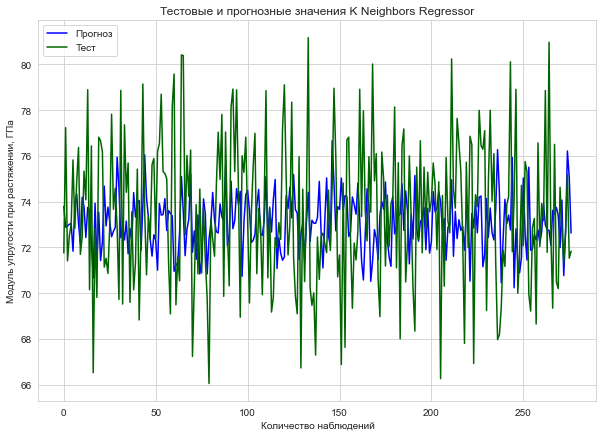

In [144]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

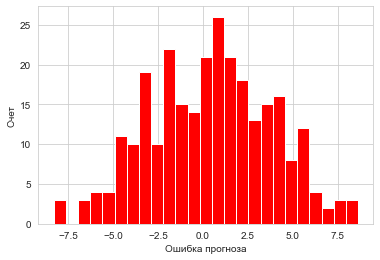

In [145]:
#Визуализация гистограммы распределения ошибки
error = y_test_2 - y_pred_knn2
plt.hist(error, bins = 25, color = "r")
plt.xlabel('Ошибка прогноза')
_ = plt.ylabel('Счет')

##  Деревья решений - Decision Tree Regressor - 6

In [146]:
#Деревья решений - Decision Tree Regressor - 6

dtr2 = DecisionTreeRegressor()
dtr2.fit(x_train_2, y_train_2.values)
y_pred_dtr2 = dtr2.predict(x_test_2)
mae_dtr2 = mean_absolute_error(y_pred_dtr2, y_test_2)
mse_dtr_elast2 = mean_squared_error(y_test_2,y_pred_dtr2)
print('Последовательность результатов регрессора дерева решений:')
print("Оценка теста: {:.2f}".format(dtr2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Результаты регрессора дерева решений:')
print('DTR_MAE: ', round(mean_absolute_error(y_test_2, y_pred_dtr2)))
print('DTR_MSE: {:.2f}'.format(mse_dtr_elast2))
print("DTR_RMSE: {:.2f}".format (np.sqrt(mse_dtr_elast2)))
print('DTR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_dtr2)))
print("Оценка теста: {:.2f}".format(dtr2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Последовательность результатов регрессора дерева решений:
Оценка теста: 1.00
Результаты регрессора дерева решений:
DTR_MAE:  4
DTR_MSE: 21.09
DTR_RMSE: 4.59
DTR_MAPE: 0.05
Оценка теста: -1.13


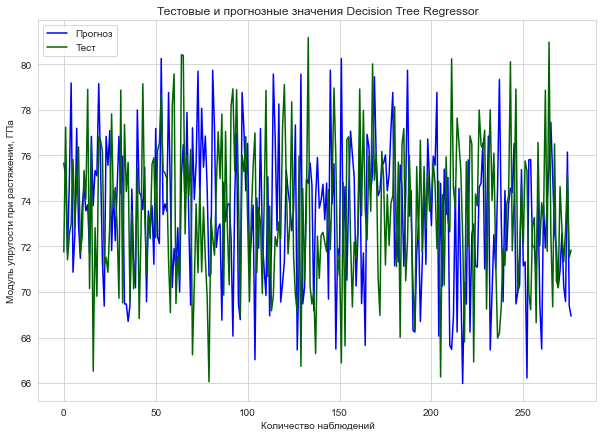

In [147]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor")
plt.plot(y_pred_dtr2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7

In [148]:
# Стохастический градиентный спуск (SGD) - Stochastic Gradient Descent Regressor - 7 

sdg2 = SGDRegressor()
sdg2.fit(x_train_2, y_train_2)
y_pred_sdg2 = sdg2.predict(x_test_2)
mae_sdg2 = mean_absolute_error(y_pred_sdg2, y_test_2)
mse_sdg_elast2 = mean_squared_error(y_test_2,y_pred_sdg2)
print('Последовательность результатов регрессора стохастического градиентного спуска:')
print("Оценка теста: {:.2f}".format(sdg2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Результаты регрессора стохастического градиентного спуска:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_sdg2)))
print('SGD_MSE: {:.2f}'.format(mse_sdg_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_sdg_elast2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_sdg2)))
print("Оценка теста: {:.2f}".format(sdg2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Последовательность результатов регрессора стохастического градиентного спуска:
Оценка теста: -0.01
Результаты регрессора стохастического градиентного спуска:
SGD_MAE:  3
SGD_MSE: 10.22
SGD_RMSE: 3.20
SGD_MAPE: 0.04
Оценка теста: -0.03


C:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


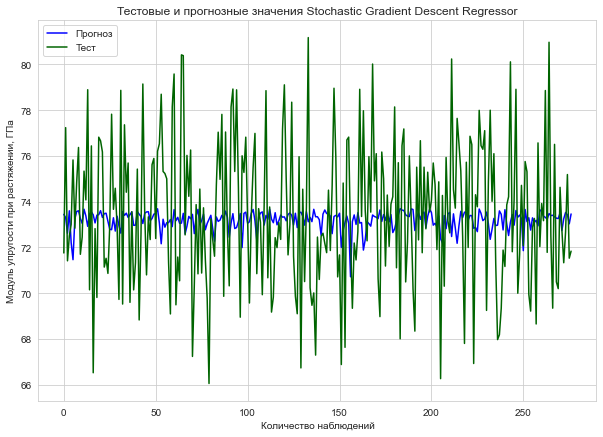

In [149]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Stochastic Gradient Descent Regressor")
plt.plot(y_pred_sdg2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Многослойный перцептрон - Multi-layer Perceptron regressor - 8

In [150]:
# Многослойный перцептрон - Multi-layer Perceptron regressor - 8

mlp2 = MLPRegressor(random_state = 1, max_iter = 500)
mlp2.fit(x_train_2, y_train_2)
y_pred_mlp2 = mlp2.predict(x_test_2)
mae_mlp2 = mean_absolute_error(y_pred_mlp2, y_test_2)
mse_mlp_elast2 = mean_squared_error(y_test_2,y_pred_mlp2)
print('Последовательность результатов многослойного регрессора перцептрона:')
print("Оценка теста: {:.2f}".format(mlp2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Результаты многослойного регрессора перцептрона:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_mlp2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_mlp2)))
print('SGD_MSE: {:.2f}'.format(mse_mlp_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_mlp_elast2)))
print("Оценка теста: {:.2f}".format(mlp2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1599: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Последовательность результатов многослойного регрессора перцептрона:
Оценка теста: -0.38
Результаты многослойного регрессора перцептрона:
SGD_MAE:  3
SGD_MAPE: 0.04
SGD_MSE: 14.14
SGD_RMSE: 3.76
Оценка теста: -0.43


C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


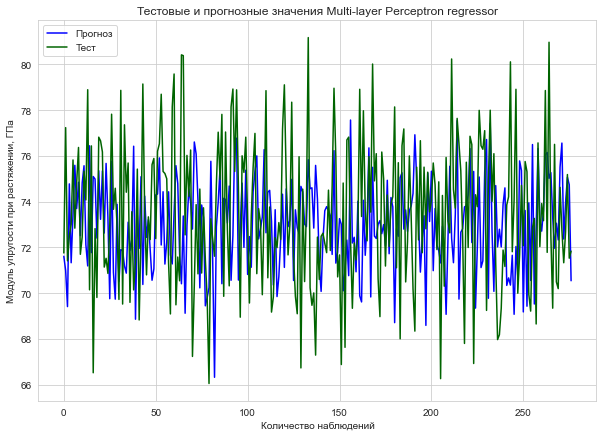

In [151]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Multi-layer Perceptron regressor")
plt.plot(y_pred_mlp2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

## Лассо регрессия - the Lasso - 9

In [152]:
# Лассо регрессия - the Lasso - 9

clf2 = linear_model.Lasso(alpha = 0.1)
clf2.fit(x_train_2, y_train_2)
y_pred_clf2 = clf2.predict(x_test_2)
mae_clf2 = mean_absolute_error(y_pred_clf2, y_test_2)
mse_clf_elast2 = mean_squared_error(y_test_2,y_pred_clf2)
print('Поезд результатов лассо-регрессии:')
print("Оценка теста: {:.2f}".format(clf2.score(x_train_2, y_train_2)))# Скор для тренировочной выборки
print('Результаты лассо-регрессии:')
print('SGD_MAE: ', round(mean_absolute_error(y_test_2, y_pred_clf2)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_2, y_pred_clf2)))
print('SGD_MSE: {:.2f}'.format(mse_clf_elast2))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_clf_elast2)))
print("Оценка теста: {:.2f}".format(clf2.score(x_test_2, y_test_2)))# Скор для тестовой выборки

Поезд результатов лассо-регрессии:
Оценка теста: 0.00
Результаты лассо-регрессии:
SGD_MAE:  3
SGD_MAPE: 0.04
SGD_MSE: 10.00
SGD_RMSE: 3.16
Оценка теста: -0.01


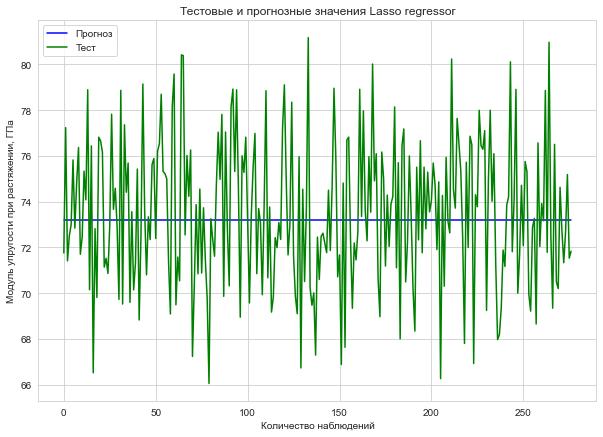

In [154]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Lasso regressor")
plt.plot(y_pred_clf2, label = "Прогноз", color = 'blue')
plt.plot(y_test_2.values, label = "Тест", color = 'green')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [155]:
#сравним наши модели по метрике МАЕ
mae_df2 = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 'MAE': [mae_svr2, mae_rfr2, mae_lr2, mae_gbr2, mae_knr2, mae_dtr2, mae_sdg2, mae_mlp2, mae_clf2]} 
mae_df2 = pd.DataFrame(mae_df2)

In [157]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# модели случайного леса - Random Forest Regressor - 2

parametrs = { 'n_estimators': [200, 300],
              'max_depth': [9, 15],
              'max_features': ['auto'],
              'criterion': ['mse'] }
grid21 = GridSearchCV(estimator = rfr2, param_grid  = parametrs, cv=10)
grid21.fit(x_train_2, y_train_2)

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
C:\Anaconda3\l

GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['mse'], 'max_depth': [9, 15],
                         'max_features': ['auto'], 'n_estimators': [200, 300]})

In [158]:
grid21.best_params_

{'criterion': 'mse',
 'max_depth': 9,
 'max_features': 'auto',
 'n_estimators': 300}

In [159]:
#Выводим гиперпараметры для оптимальной модели
print(grid21.best_estimator_)
knr_u = grid21.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {knr_u.score(x_test_2, y_test_2).round(3)}')

RandomForestRegressor(criterion='mse', max_depth=9, n_estimators=300,
                      random_state=33)
R2-score RFR для модуля упругости при растяжении: -0.034


In [160]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr21_grid = RandomForestRegressor(n_estimators=200, criterion='mse', max_depth=15, max_features='auto')
#Обучаем модель
rfr21_grid.fit(x_train_2, y_train_2)

predictions_rfr21_grid = rfr21_grid.predict(x_test_2)
#Оцениваем точность на тестовом наборе
mae_rfr21_grid = mean_absolute_error(predictions_rfr21_grid, y_test_2)
mae_rfr21_grid

C:\Users\PC\AppData\Local\Temp\ipykernel_260\2122925077.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr21_grid.fit(x_train_2, y_train_2)
C:\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


2.603650666479658

In [161]:
new_row_in_mae_df = {'Регрессор': 'RandomForest1_GridSearchCV', 'MAE': mae_rfr21_grid} 

mae_df = mae_df2.append(new_row_in_mae_df, ignore_index = True)

C:\Users\PC\AppData\Local\Temp\ipykernel_260\1791604826.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df2.append(new_row_in_mae_df, ignore_index = True)


In [162]:
mae_df

,Регрессор,MAE
0,Support Vector,3.447736
1,RandomForest,2.611586
2,Linear Regression,2.609323
3,GradientBoosting,2.657063
4,KNeighbors,2.809242
5,DecisionTree,3.683844
6,SGD,2.602826
7,MLP,3.024273
8,Lasso,2.580193
9,RandomForest1_GridSearchCV,2.603651


In [163]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
# Метода К ближайших соседей - K Neighbors Regressor - 5
knn21 = KNeighborsRegressor()
knn21_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(knn21, knn21_params, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(x_train_2, y_train_2)
knn_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 299, 'weights': 'distance'}

In [164]:
#Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs121 = gs21.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {gs121.score(x_test_2, y_test_2).round(3)}')

KNeighborsRegressor(n_neighbors=299, weights='distance')
R2-score KNR для модуля упругости при растяжении: -0.018


In [165]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn21_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn21_grid.fit(x_train_2, y_train_2)

predictions_knn21_grid = knn21_grid.predict(x_test_2)
#Оцениваем точность на тестовом наборе
mae_knn21_grid = mean_absolute_error(predictions_knn21_grid, y_test_2)
mae_knn21_grid

2.751513302872468

In [166]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors1_GridSearchCV', 'MAE': mae_knn21_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

C:\Users\PC\AppData\Local\Temp\ipykernel_260\2265619992.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)


,Регрессор,MAE
0,Support Vector,3.447736
1,RandomForest,2.611586
2,Linear Regression,2.609323
3,GradientBoosting,2.657063
4,KNeighbors,2.809242
5,DecisionTree,3.683844
6,SGD,2.602826
7,MLP,3.024273
8,Lasso,2.580193
9,RandomForest1_GridSearchCV,2.603651


In [167]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество блоков равно 10 (cv = 10), для 
#Деревья решений - Decision Tree Regressor - 6
criterion21 = ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
splitter21 = ['best', 'random']
max_depth21 = [3,5,7,9,11]
min_samples_leaf21 = [100,150,200]
min_samples_split21 = [200,250,300]
max_features21 = ['auto', 'sqrt', 'log2']
param_grid21 = {'criterion': criterion21,
               'splitter': splitter21,
               'max_depth': max_depth21,
               'min_samples_split': min_samples_split21,
               'min_samples_leaf': min_samples_leaf21,
               'max_features': max_features21}
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs21 = GridSearchCV(dtr2, param_grid21, cv = 10, verbose = 1, n_jobs=-1, scoring = 'r2')
gs21.fit(x_train_2, y_train_2)
dtr_21 = gs21.best_estimator_
gs21.best_params_

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


{'criterion': 'friedman_mse',
 'max_depth': 9,
 'max_features': 'auto',
 'min_samples_leaf': 150,
 'min_samples_split': 200,
 'splitter': 'random'}

In [168]:
#Выводим гиперпараметры для оптимальной модели
print(gs21.best_estimator_)
gs21 = gs21.best_estimator_
print(f'R2-score DTR для модуля упругости при растяжении: {gs21.score(x_test_2, y_test_2).round(3)}')

DecisionTreeRegressor(criterion='friedman_mse', max_depth=9,
                      max_features='auto', min_samples_leaf=150,
                      min_samples_split=200, splitter='random')
R2-score DTR для модуля упругости при растяжении: -0.009


In [169]:
#подставим оптимальные гиперпараметры в нашу модель метода деревья решений
dtr21_grid = DecisionTreeRegressor(criterion='poisson', max_depth=7, max_features='auto',
                      min_samples_leaf=100, min_samples_split=250)
#Обучаем модель
dtr21_grid.fit(x_train_2, y_train_2)

predictions_dtr21_grid = dtr21_grid.predict(x_test_2)
#Оцениваем точность на тестовом наборе
mae_dtr21_grid = mean_absolute_error(predictions_dtr21_grid, y_test_2)
mae_dtr21_grid

2.614842021387834

In [170]:
new_row_in_mae_df = {'Регрессор': 'DecisionTree1_GridSearchCV', 'MAE': mae_dtr21_grid} 

mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)
mae_df

C:\Users\PC\AppData\Local\Temp\ipykernel_260\372731635.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mae_df = mae_df.append(new_row_in_mae_df, ignore_index=True)


,Регрессор,MAE
0,Support Vector,3.447736
1,RandomForest,2.611586
2,Linear Regression,2.609323
3,GradientBoosting,2.657063
4,KNeighbors,2.809242
5,DecisionTree,3.683844
6,SGD,2.602826
7,MLP,3.024273
8,Lasso,2.580193
9,RandomForest1_GridSearchCV,2.603651


In [171]:
pipe2 = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid2 = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [DecisionTreeRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [SGDRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [MLPRegressor(random_state=1, max_iter=500)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [linear_model.Lasso(alpha=0.1)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},]
grid2 = GridSearchCV(pipe2, param_grid2, cv=10)
grid2.fit(x_train_2, np.ravel(y_train_2))
print("Наилучшие параметры:\n{}\n".format(grid2.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid2.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid2.score(x_test_2, y_test_2)))

C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Opti

Наилучшие параметры:
{'preprocessing': StandardScaler(), 'regressor': SVR(C=1, gamma=1), 'regressor__C': 1, 'regressor__gamma': 1}

Наилучшее значение правильности перекрестной проверки: -0.00
Правильность на тестовом наборе: -0.01


C:\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [172]:
print("Наилучшая модель:\n{}".format(grid2.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', StandardScaler()),
                ('regressor', SVR(C=1, gamma=1))])


После обучения моделей была проведена оценка точности этих моделей на обучающей и тестовых выборках. В качестве параметра оценки модели использовалась средняя абсолютная ошибка (MAE). Обе модели даже на тренировочном датасете не смогли обучиться и приблизиться к исходным данным. Поэтому ошибка на тестовом датасете выше

# Второй вариант
Еще одна попытка


In [99]:
#Входные переменные
col_in = ["Плотность, кг/м3", "модуль упругости, ГПа", "Количество отвердителя, м.%",
          "Содержание эпоксидных групп,%_2", "Температура вспышки, С_2",
          "Поверхностная плотность, г/м2", "Потребление смолы, г/м2",
          "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
#Входные данные
df_trn1 = df_minmax_n[col_in]
df_trn2 = df_norm_n[col_in]

#выходные переменные
col_out = ["Соотношение матрица-наполнитель",
           "Модуль упругости при растяжении, ГПа",
           "Прочность при растяжении, МПа"]

#Выходные данные
df_trg1 = df_minmax_n[col_out]
df_trg2 = df_norm_n[col_out]

тестовая и обучающая выборки 70/30

In [100]:
Xtrain1, Xtest1, Ytrain1, Ytest1 = train_test_split(df_trn1, df_trg1, test_size=0.3)
Xtrain2, Xtest2, Ytrain2, Ytest2 = train_test_split(df_trn2, df_trg2, test_size=0.3)

In [101]:
model_list1 = [LinearRegression(),   # метод наименьших квадратов
               KNeighborsRegressor(n_neighbors=5), # метод ближайших соседей
               SVR(kernel='linear')]               # метод опорных векторов с линейным ядром

model_list1

[LinearRegression(), KNeighborsRegressor(), SVR(kernel='linear')]

Проверка различных моделей при стандартных параметрах

In [103]:
#создаем временные структуры
TestModels1 = pd.DataFrame()
tmp1 = {}
#для каждой модели из списка
for model1 in model_list1:
    #получаем имя модели
    m1 = str(model1)
    tmp1['Model1'] = m1[:m1.index('(')]    
    #для каждого столбца результирующего набора
    for i in range(Ytrain1.shape[1]):
        #обучаем модель
        model1.fit(Xtrain1, Ytrain1[col_out[i]]) 
        #вычисляем коэффициент детерминации
        tmp1['R2_Y%s'%str(i+1)] = r2_score(Ytest1[col_out[i]], model1.predict(Xtest1))
    #записываем данные и итоговый DataFrame
    TestModels1 = TestModels1.append([tmp1])
#делаем индекс по названию модели
TestModels1.set_index('Model1', inplace=True)

In [106]:
TestModels1

,R2_Y1,R2_Y2,R2_Y3
Model1,,,
LinearRegression,-0.030933,-0.003654,-0.025295
KNeighborsRegressor,-0.232930,-0.045402,-0.239561
SVR,-0.019778,-0.013608,-0.025253


In [107]:
model_list2 = [LinearRegression(),   # метод наименьших квадратов
               KNeighborsRegressor(n_neighbors=5), # метод ближайших соседей
               SVR(kernel='linear')]               # метод опорных векторов с линейным ядром

model_list2

[LinearRegression(), KNeighborsRegressor(), SVR(kernel='linear')]

Проверка различных моделей при стандартных параметрах

In [226]:
#создаем временные структуры
TestModels2 = pd.DataFrame()
tmp2 = {}
#для каждой модели из списка
for model2 in model_list2:
    #получаем имя модели
    m2 = str(model2)
    tmp2['Model2'] = m2[:m2.index('(')]    
    #для каждого столбца результирующего набора
    for i in range(Ytrain2.shape[1]):
        #обучаем модель
        model2.fit(Xtrain2, Ytrain2[col_out[i]]) 
        #вычисляем коэффициент детерминации
        tmp2['R2_Y%s'%str(i+1)] = r2_score(Ytest2[col_out[i]], model2.predict(Xtest2))
    #записываем данные и итоговый DataFrame
    TestModels2 = TestModels1.append([tmp2])
#делаем индекс по названию модели
TestModels2.set_index('Model2', inplace=True)

In [109]:
TestModels2

,R2_Y1,R2_Y2,R2_Y3
Model2,,,
NaN,-0.030933,-0.003654,-0.025295
NaN,-0.232930,-0.045402,-0.239561
NaN,-0.019778,-0.013608,-0.025253
SVR,-0.000373,-0.002548,0.439090


Импортируем функции для поиска по сетке параметров с перекрестной проверкой

In [110]:
from sklearn.model_selection import GridSearchCV

Отделяем выходные переменные и входные

In [112]:
#Сперва проверим модели для прогнозирования прочности на растяжение
col_names_out_1 = ["Прочность при растяжении, МПа"]
col_names_in_1 = ["Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
#Выходные
trg_1 = df_minmax_n[col_names_out_1]
trg_2 = df_norm_n[col_names_out_1]
#Входные
trn_1 = df_minmax_n[col_names_in_1]
trn_2 = df_norm_n[col_names_in_1]

Производим подготовка обучающей и тестовой выборок (соотношение 70 на 30) 

Перекрестную проверку будем проводить на 70% данных 30% оставим на итоговое тестирование

In [113]:
Xtrain1_1, Xtest1_1, Ytrain1_1, Ytest1_1 = train_test_split(trn_1, trg_1, test_size=0.3)
Xtrain1_2, Xtest1_2, Ytrain1_2, Ytest1_2 = train_test_split(trn_1, trg_1, test_size=0.3)

Xtrain2_1, Xtest2_1, Ytrain2_1, Ytest2_1 = train_test_split(trn_2, trg_2, test_size=0.3)
Xtrain2_2, Xtest2_2, Ytrain2_2, Ytest2_2 = train_test_split(trn_2, trg_2, test_size=0.3)

Зададим сетку параметров, по которым будем оптимизировать модель

In [116]:
t_search_1 = {'weights': ['uniform', 'distance'],
               'n_neighbors': list(np.linspace(5, 100, 10, dtype = int)),
               'algorithm': ['auto', 'ball_tree','kd_tree', 'brute'],
               'leaf_size': list(np.linspace(10, 100, 10, dtype = int))}
#В качестве первой модели будем использовать метод ближайших соседей
clf_1 = KNeighborsRegressor()



Зададим сетку параметров, по которым будем оптимизировать модель

In [117]:
t_search_2 = {'weights': ['uniform', 'distance'],
               'n_neighbors': list(np.linspace(5, 100, 10, dtype = int)),
               'algorithm': ['auto', 'ball_tree','kd_tree', 'brute'],
               'leaf_size': list(np.linspace(10, 100, 10, dtype = int))}
#В качестве первой модели будем использовать метод ближайших соседей
clf_2 = KNeighborsRegressor()


Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2) 
Количество блоков для перекрестной проверки cv = 10

In [118]:
model_1 = GridSearchCV(estimator = clf_1, scoring = 'r2', param_grid = t_search_1, cv = 10, verbose= 1, n_jobs = -1)
model_1.fit(Xtrain1_1,Ytrain1_1)

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                         'n_neighbors': [5, 15, 26, 36, 47, 57, 68, 78, 89,
                                         100],
                         'weights': ['uniform', 'distance']},
             scoring='r2', verbose=1)

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
Количество блоков для перекрестной проверки cv = 10

In [119]:
model_2 = GridSearchCV(estimator = clf_2, scoring = 'r2', param_grid = t_search_2, cv = 10, verbose= 1, n_jobs = -1)
model_2.fit(Xtrain2_1,Ytrain2_1)

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                         'n_neighbors': [5, 15, 26, 36, 47, 57, 68, 78, 89,
                                         100],
                         'weights': ['uniform', 'distance']},
             scoring='r2', verbose=1)

In [120]:
best_estimator = model_1.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model_1.best_score_)

KNeighborsRegressor(leaf_size=10, n_neighbors=47)
-0.046649424427230156


In [121]:
best_estimator = model_2.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model_2.best_score_)

KNeighborsRegressor(leaf_size=10, weights='distance')
0.9563464518631758


Определяем функцию для вычисления точности модели. На входе модель, а также входные параметры и целевая переменная

In [122]:
def evaluate(model, test_features, test_labels):
    #Делаем предсказание на основе входных параметров
    predictions = model.predict(test_features)
    #Считаем абсолютные ошибки в предсказаниях (разность между предсказанным значением и целевым значением)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    #Определяем точность модели
    accuracy = 100 - mape
    print('Средняя абсолютная ошибка: {:0.4f}'.format(np.mean(errors.values)))
    #print('Точность = {:0.2f}%.'.format(accuracy[0]))
    return accuracy

Подставляем оптимальные гиперпараметры в модель

In [123]:
model_base_1 = KNeighborsRegressor(algorithm='brute', leaf_size=10, n_neighbors=100, weights='distance')
#Обучаем модель
model_base_1.fit(Xtrain1_1,Ytrain1_1)
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate(model_base_1, Xtrain1_1,Ytrain1_1)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate(model_base_1, Xtest1_1,Ytest1_1)

Средняя абсолютная ошибка: 0.0000
Средняя абсолютная ошибка: 0.1546


Подставляем оптимальные гиперпараметры в модель

In [124]:
#Подставляем оптимальные гиперпараметры в модель
model_base_2 = KNeighborsRegressor(algorithm='brute', leaf_size=10, n_neighbors=100, weights='distance')
#Обучаем модель
model_base_2.fit(Xtrain2_1,Ytrain2_1)
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate(model_base_2, Xtrain2_1,Ytrain2_1)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate(model_base_2, Xtest2_1,Ytest2_1)

Средняя абсолютная ошибка: 0.0000
Средняя абсолютная ошибка: 0.0202


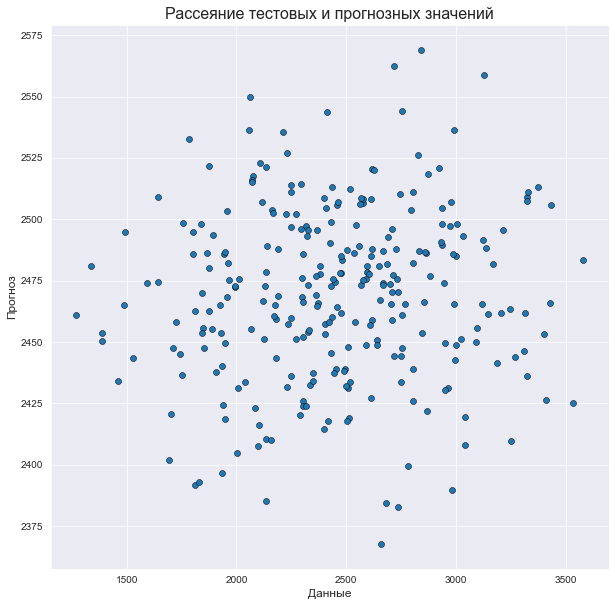

,Данные,Прогноз
0,1993.459958,2472.217918
1,2304.313891,2426.077808
2,2429.619356,2472.748191
3,3188.136358,2441.659824
4,3167.779711,2481.768610
...,...,...
272,2498.894803,2431.937646
273,1841.004409,2453.697584
274,2156.666591,2410.028727
275,2509.612948,2447.855288


In [142]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict_1 = model_base_1.predict(Xtest1_1)
predict_1_values = np.ravel(predict_1)
#Тестовые данные
Ytst_1 = Ytest1_1.copy()
test_1_values = np.ravel(Ytst_1)
#Преобразуем нормализованные данные к исходным
col_1 = ["Прочность при растяжении, МПа"]
#Определим параметры, которые использовались для нормализации
min_1 = np.min(df[col_1])
max_1 = np.max(df[col_1])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict_1_values):
    predict_1_values[i] = predict_1_values[i]*(max_1 - min_1) + min_1
    test_1_values[i] = test_1_values[i]*(max_1 - min_1) + min_1
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results_1 = pd.DataFrame({'Данные': test_1_values,'Прогноз': predict_1_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=16)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results_1, edgecolor='black', palette='cubehelix', marker="o")
plt.show()
feature_results_1

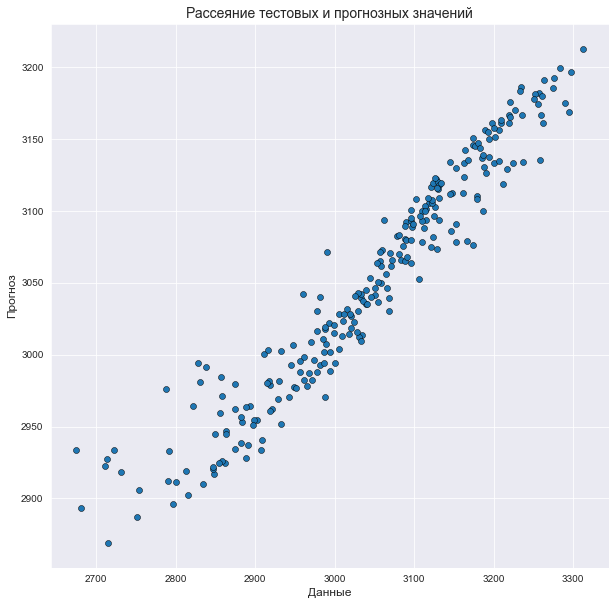

,Данные,Прогноз
0,2731.187634,2918.466881
1,3005.029020,3003.927511
2,3095.598833,3100.544471
3,2910.996260,3000.398009
4,3118.143272,3105.850278
...,...,...
247,2985.209632,3010.800784
248,3039.836511,3045.180054
249,2874.154431,2962.153945
250,3067.883163,3030.528017


In [140]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict_2 = model_base_2.predict(Xtest2_1)
predict_2_values = np.ravel(predict_2)
#Тестовые данные
Ytst_2 = Ytest2_1.copy()
test_2_values = np.ravel(Ytst_2)
#Преобразуем нормализованные данные к исходным
col_2 = ["Прочность при растяжении, МПа"]
#Определим параметры, которые использовались для нормализации
min_2 = np.min(df[col_2])
max_2 = np.max(df[col_2])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict_2_values):
    predict_2_values[i] = predict_2_values[i]*(max_2 - min_2) + min_2
    test_2_values[i] = test_2_values[i]*(max_2 - min_2) + min_2
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results_2 = pd.DataFrame({'Данные': test_2_values,'Прогноз': predict_2_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results_2, edgecolor='black', palette='cubehelix', marker="o")

plt.show()
feature_results_2

### Метод градиентного бустинга

Зададим сетку параметров, по которым будем оптимизировать модель (вторая модель)

In [145]:
t_search_11 = {'n_estimators': list(np.linspace(100, 500, 5, dtype = int)),
             'loss': ['ls', 'lad', 'huber'],
             'max_depth': [2, 3, 5, 10, 15]}
#В качестве второй модели будем использовать метод градиентного бустинга
clf_11 = GradientBoostingRegressor()

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
Количество блоков для перекрестной проверки cv = 10

In [146]:
model_11 = GridSearchCV(estimator = clf_11, scoring = 'r2', param_grid = t_search_11, cv = 10, verbose= 1, n_jobs = -1)
model_11.fit(Xtrain1_2,np.ravel(Ytrain1_2))
#Используем преобразование np.ravel() массива [[],[],...] к одномерному массиву [,,...]

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'loss': ['ls', 'lad', 'huber'],
                         'max_depth': [2, 3, 5, 10, 15],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='r2', verbose=1)

In [147]:
best_estimator = model_11.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model_11.best_score_)

GradientBoostingRegressor(loss='lad', max_depth=2)
-0.05833184778133009


Зададим сетку параметров, по которым будем оптимизировать модель (вторая модель)

In [148]:
t_search_22 = {'n_estimators': list(np.linspace(100, 500, 5, dtype = int)),
             'loss': ['ls', 'lad', 'huber'],
             'max_depth': [2, 3, 5, 10, 15]}
#В качестве второй модели будем использовать метод градиентного бустинга
clf_22 = GradientBoostingRegressor()

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2) 
Количество блоков для перекрестной проверки cv = 10

In [149]:
model_22 = GridSearchCV(estimator = clf_22, scoring = 'r2', param_grid = t_search_22, cv = 10, verbose= 1, n_jobs = -1)
model_22.fit(Xtrain2_2,np.ravel(Ytrain2_2))
#Используем преобразование np.ravel() массива [[],[],...] к одномерному массиву [,,...]

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'loss': ['ls', 'lad', 'huber'],
                         'max_depth': [2, 3, 5, 10, 15],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='r2', verbose=1)

In [150]:
best_estimator = model_22.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model_22.best_score_)

GradientBoostingRegressor(max_depth=2, n_estimators=500)
0.9896989075717396


Определяем функцию для вычисления точности модели. На входе модель, а также входные параметры и целевая переменная

In [151]:
def evaluate_2(model, test_features, test_labels):
    #Делаем предсказание на основе входных параметров
    predictions = model.predict(test_features)
    #Преобразуем к виду [[],[],...] из одномерного массива
    predict = np.reshape(predictions,(predictions.size, 1))
    #Считаем абсолютные ошибки в предсказаниях (разность между предсказанным значением и целевым значением)
    errors = abs(predict - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    #Определяем точность модели
    accuracy = 100 - mape
    print('Средняя абсолютная ошибка: {:0.4f}'.format(np.mean(errors.values)))
    #print('Точность = {:0.2f}%.'.format(accuracy[0]))
    return accuracy

Подставляем оптимальные гиперпараметры в модель

In [152]:
model_base_11 = GradientBoostingRegressor(loss='lad', max_depth=2)
#Обучаем модель
model_base_11.fit(Xtrain1_2,np.ravel(Ytrain1_2))

GradientBoostingRegressor(loss='lad', max_depth=2)

In [ ]:
Оцениваем точность на тренировочном наборе

In [153]:
base_accuracy = evaluate_2(model_base_11, Xtrain1_2, Ytrain1_2)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base_11, Xtest1_2, Ytest1_2)

Средняя абсолютная ошибка: 0.1288
Средняя абсолютная ошибка: 0.1655


Подставляем оптимальные гиперпараметры в модель

In [154]:
model_base_22 = GradientBoostingRegressor(loss='lad', max_depth=2)
#Обучаем модель
model_base_22.fit(Xtrain2_2,np.ravel(Ytrain2_2))

GradientBoostingRegressor(loss='lad', max_depth=2)

Оцениваем точность на тренировочном наборе

Оцениваем точность на тестовом наборе

In [155]:
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate_2(model_base_22, Xtrain2_2, Ytrain2_2)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base_22, Xtest2_2, Ytest2_2)

Средняя абсолютная ошибка: 0.0050
Средняя абсолютная ошибка: 0.0085


In [156]:
#Важность папаметров в модели
importances_11 = model_base_11.feature_importances_
#получаем названия колонок параметров
feature_list_11 = list(Xtrain1_2.columns)
#Формируем таблицу для представления
feature_results_11 = pd.DataFrame({'Параметр': feature_list_11,'Важность параметра': importances_11})
#Сортируем по уменьшению важности
feature_results_11 = feature_results_11.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [157]:
feature_results_11

,Параметр,Важность параметра
0,"Поверхностная плотность, г/м2",0.237175
1,"Плотность, кг/м3",0.197958
2,"Количество отвердителя, м.%",0.139710
3,"модуль упругости, ГПа",0.114360
4,"Температура вспышки, С_2",0.102849
5,"Потребление смолы, г/м2",0.066593
6,"Содержание эпоксидных групп,%_2",0.056362
7,Плотность нашивки,0.050393
8,Шаг нашивки,0.034600
9,"Угол нашивки, град",0.000000


In [158]:
#Важность папаметров в модели
importances_22 = model_base_22.feature_importances_
#получаем названия колонок параметров
feature_list_22 = list(Xtrain2_2.columns)
#Формируем таблицу для представления
feature_results_22 = pd.DataFrame({'Параметр': feature_list_22,'Важность параметра': importances_22})
#Сортируем по уменьшению важности
feature_results_22 = feature_results_22.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [159]:
feature_results_22

,Параметр,Важность параметра
0,"Плотность, кг/м3",0.438427
1,"модуль упругости, ГПа",0.278864
2,"Поверхностная плотность, г/м2",0.196900
3,"Температура вспышки, С_2",0.028335
4,"Потребление смолы, г/м2",0.019608
5,"Содержание эпоксидных групп,%_2",0.019214
6,Плотность нашивки,0.007240
7,"Угол нашивки, град",0.006026
8,"Количество отвердителя, м.%",0.003950
9,Шаг нашивки,0.001436


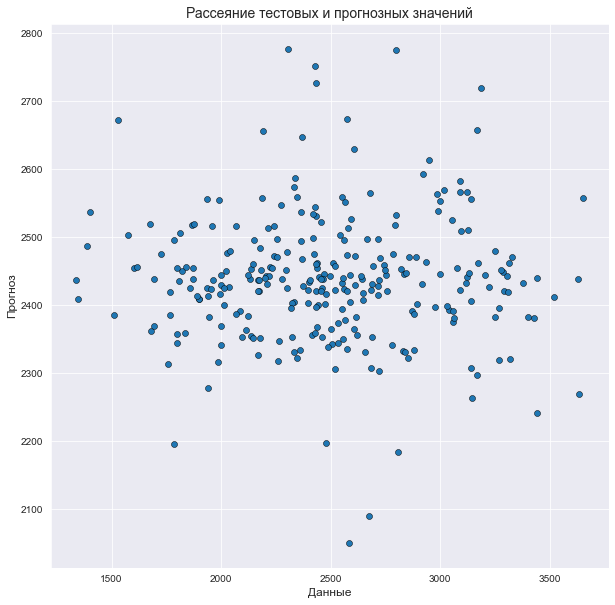

,Данные,Прогноз
0,2610.449767,2473.034736
1,2715.834461,2498.081368
2,1680.971057,2362.814401
3,1673.355146,2519.270206
4,1960.882953,2437.678365
...,...,...
272,2256.858423,2471.742267
273,2262.415717,2347.568053
274,2438.219683,2368.266324
275,1991.478742,2555.127038


In [161]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict_11 = model_base_11.predict(Xtest1_2)
predict_11_values = np.ravel(predict_11)
#Тестовые данные
Ytst_11 = Ytest1_2.copy()
test_11_values = np.ravel(Ytst_11)
#Преобразуем нормализованные данные к исходным
col_11 = ["Прочность при растяжении, МПа"]
#Определим параметры, которые использовались для нормализации
min_11 = np.min(df[col_11])
max_11 = np.max(df[col_11])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict_11_values):
    predict_11_values[i] = predict_11_values[i]*(max_11 - min_11) + min_11
    test_11_values[i] = test_11_values[i]*(max_11 - min_11) + min_11
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results_11 = pd.DataFrame({'Данные': test_11_values,'Прогноз': predict_11_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results_11, edgecolor='black', palette='cubehelix')
plt.show()
feature_results_11

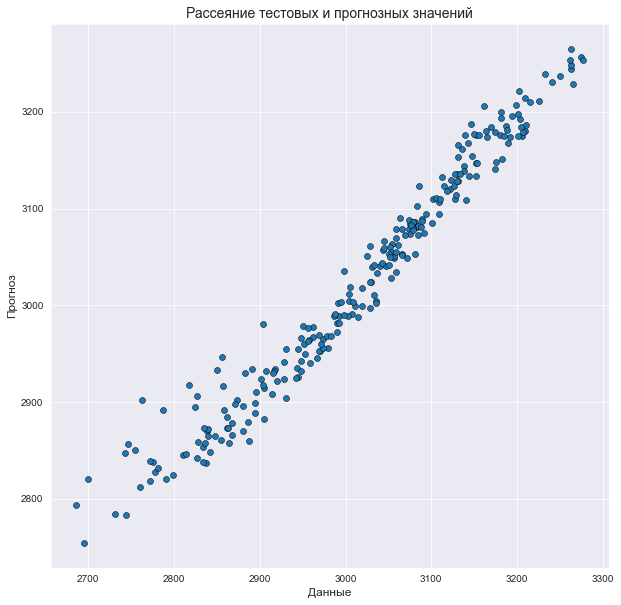

,Данные,Прогноз
0,3075.513003,3084.535920
1,3019.465343,2999.180338
2,3058.533799,3034.767054
3,3129.901407,3136.223928
4,3083.324200,3102.851986
...,...,...
247,2685.747892,2793.348055
248,3028.420736,3024.451303
249,3152.256939,3133.135592
250,3032.628666,3041.220577


In [162]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict_22 = model_base_22.predict(Xtest2_2)
predict_22_values = np.ravel(predict_22)
#Тестовые данные
Ytst_22 = Ytest2_2.copy()
test_22_values = np.ravel(Ytst_22)
#Преобразуем нормализованные данные к исходным
col_22 = ["Прочность при растяжении, МПа"]
#Определим параметры, которые использовались для нормализации
min_22 = np.min(df[col_22])
max_22 = np.max(df[col_22])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict_22_values):
    predict_22_values[i] = predict_22_values[i]*(max_22 - min_22) + min_22
    test_22_values[i] = test_22_values[i]*(max_22 - min_22) + min_22
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results_22 = pd.DataFrame({'Данные': test_22_values,'Прогноз': predict_22_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results_22, edgecolor='black', palette='cubehelix')
plt.show()
feature_results_22

Отделяем выходные переменные и входные

Теперь проверим модели для прогнозирования Модуль упругости при растяжении, ГПа

In [163]:
col_names_out_2 = ["Модуль упругости при растяжении, ГПа"]
col_names_in_2 =  ["Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2",
                   "Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град","Шаг нашивки","Плотность нашивки"]

#Выходные
trg_11 = df_minmax_n[col_names_out_2]
trg_22 = df_norm_n[col_names_out_2]
#Входные
trn_11 = df_minmax_n[col_names_in_2]
trn_22 = df_norm_n[col_names_in_2]


тестовая и обучающая выборки 70/30

In [164]:
Xtrain11, Xtest11, Ytrain11, Ytest11 = train_test_split(trn_11, trg_11, test_size=0.3)
Xtrain111, Xtest111, Ytrain111, Ytest111 = train_test_split(trn_11, trg_11, test_size=0.3)

Xtrain22, Xtest22, Ytrain22, Ytest22 = train_test_split(trn_22, trg_22, test_size=0.3)
Xtrain222, Xtest222, Ytrain222, Ytest222 = train_test_split(trn_22, trg_22, test_size=0.3)

Зададим сетку параметров, по которым будем оптимизировать модель

In [165]:
#t_search21 = {'fit_intercept': [True, False],
#               'positive': [True, False]}
t_search11 = {'fit_intercept': [True, False]}
#               'positive': [True, False]}
#В качестве первой модели будем использовать линейную регрессию
clf11 = LinearRegression()
t_search11

{'fit_intercept': [True, False]}

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2) 

Количество блоков для перекрестной проверки cv = 10

In [166]:
model11 = GridSearchCV(estimator = clf11, scoring = 'r2', param_grid = t_search11, cv = 10, verbose= 1, n_jobs = -1)
model11.fit(Xtrain11,Ytrain11)

Fitting 10 folds for each of 2 candidates, totalling 20 fits


GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'fit_intercept': [True, False]}, scoring='r2',
             verbose=1)

In [168]:
best_estimator = model11.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model11.best_score_)

LinearRegression()
-0.026111116626460085


In [169]:
#Подставляем оптимальные гиперпараметры в модель
model_base11 = LinearRegression()
#Обучаем модель
model_base11.fit(Xtrain11,Ytrain11)

LinearRegression()

In [171]:
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate(model_base11, Xtrain11,Ytrain11)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate(model_base11, Xtest11, Ytest11)

Средняя абсолютная ошибка: 0.1608
Средняя абсолютная ошибка: 0.1509


In [172]:
#Важность папаметров в модели
importances11 = np.ravel(model_base11.coef_)
#получаем названия колонок параметров
feature_list11 = list(Xtrain11.columns)
#Формируем таблицу для представления
feature_results11 = pd.DataFrame({'Параметр': feature_list11,'Важность параметра': importances11})
#Сортируем по уменьшению важности
feature_results11 = feature_results11.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [174]:
feature_results11

,Параметр,Важность параметра
0,"Содержание эпоксидных групп,%_2",0.063776
1,"Потребление смолы, г/м2",0.047994
2,"Поверхностная плотность, г/м2",0.029864
3,Шаг нашивки,0.012579
4,Плотность нашивки,0.003684
5,"модуль упругости, ГПа",-0.000659
6,"Угол нашивки, град",-0.003470
7,"Температура вспышки, С_2",-0.019054
8,"Плотность, кг/м3",-0.028149
9,"Количество отвердителя, м.%",-0.055559


Зададим сетку параметров, по которым будем оптимизировать модель

In [175]:
#t_search21 = {'fit_intercept': [True, False],
#               'positive': [True, False]}
t_search22 = {'fit_intercept': [True, False]}
#               'positive': [True, False]}
#В качестве первой модели будем использовать линейную регрессию
clf22 = LinearRegression()
t_search22

{'fit_intercept': [True, False]}

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2) 

Количество блоков для перекрестной проверки cv = 10

In [176]:
model22 = GridSearchCV(estimator = clf22, scoring = 'r2', param_grid = t_search11, cv = 10, verbose= 1, n_jobs = -1)
model22.fit(Xtrain22,Ytrain22)

Fitting 10 folds for each of 2 candidates, totalling 20 fits


GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'fit_intercept': [True, False]}, scoring='r2',
             verbose=1)

In [177]:
best_estimator = model22.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model22.best_score_)

LinearRegression()
0.7267829904556276


In [178]:
#Подставляем оптимальные гиперпараметры в модель
model_base22 = LinearRegression()
#Обучаем модель
model_base22.fit(Xtrain22,Ytrain22)

LinearRegression()

In [180]:
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate(model_base22, Xtrain22,Ytrain22)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate(model_base22, Xtest22, Ytest22)

Средняя абсолютная ошибка: 0.0009
Средняя абсолютная ошибка: 0.0009


In [181]:
#Важность папаметров в модели
importances22 = np.ravel(model_base22.coef_)
#получаем названия колонок параметров
feature_list22 = list(Xtrain22.columns)
#Формируем таблицу для представления
feature_results22 = pd.DataFrame({'Параметр': feature_list22,'Важность параметра': importances22})
#Сортируем по уменьшению важности
feature_results22 = feature_results22.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [182]:
feature_results22

,Параметр,Важность параметра
0,"Содержание эпоксидных групп,%_2",0.348776
1,Шаг нашивки,0.090455
2,"Плотность, кг/м3",0.025882
3,Плотность нашивки,0.019128
4,"Температура вспышки, С_2",0.013774
5,"Количество отвердителя, м.%",0.008711
6,"Потребление смолы, г/м2",0.007674
7,"Угол нашивки, град",0.003853
8,"модуль упругости, ГПа",0.000047
9,"Поверхностная плотность, г/м2",-0.000353


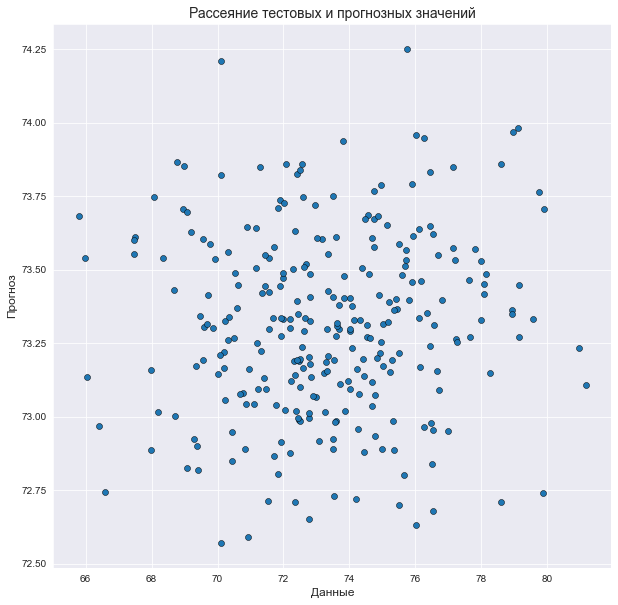

,Данные,Прогноз
0,75.187942,73.390211
1,74.672377,73.608982
2,76.007115,72.632404
3,74.554006,73.686407
4,72.325588,73.189232
...,...,...
272,74.079019,73.232463
273,73.543128,73.192495
274,71.175111,73.641605
275,70.060483,73.210493


In [183]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict11 = model_base11.predict(Xtest11)
predict11_values = np.ravel(predict11)
#Тестовые данные
tv11 = Ytest11.copy()
test11_values = np.ravel(tv11)
#Преобразуем нормализованные данные к исходным
col11 = ["Модуль упругости при растяжении, ГПа"]
#Определим параметры, которые использовались для нормализации
min11 = np.min(df[col11])
max11 = np.max(df[col11])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict11_values):
    predict11_values[i] = predict11_values[i]*(max11 - min11) + min11
    test11_values[i] = test11_values[i]*(max11 - min11) + min11
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results11 = pd.DataFrame({'Данные': test11_values,'Прогноз': predict11_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results11, edgecolor='black', palette='cubehelix')
plt.show()
feature_results11

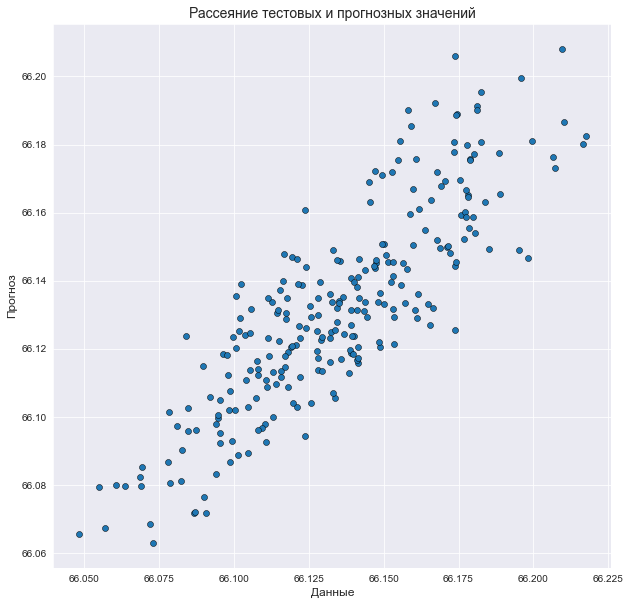

,Данные,Прогноз
0,66.104819,66.103029
1,66.160714,66.175785
2,66.159139,66.185353
3,66.127873,66.125390
4,66.177853,66.179916
...,...,...
247,66.210186,66.186612
248,66.111366,66.123212
249,66.129569,66.123408
250,66.135667,66.117103


In [184]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict22 = model_base22.predict(Xtest22)
predict22_values = np.ravel(predict22)
#Тестовые данные
tv22 = Ytest22.copy()
test22_values = np.ravel(tv22)
#Преобразуем нормализованные данные к исходным
col22 = ["Модуль упругости при растяжении, ГПа"]
#Определим параметры, которые использовались для нормализации
min22 = np.min(df[col22])
max22 = np.max(df[col22])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict22_values):
    predict22_values[i] = predict22_values[i]*(max22 - min22) + min22
    test22_values[i] = test22_values[i]*(max22 - min22) + min22
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results22 = pd.DataFrame({'Данные': test22_values,'Прогноз': predict22_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results22, edgecolor='black', palette='cubehelix')
plt.show()
feature_results22

Зададим сетку параметров, по которым будем оптимизировать модель

In [185]:
t_search111 = {'kernel': ['linear', 'poly', 'rbf'],
               'degree': list(np.linspace(3, 5, 3, dtype = int))}
#В качестве второй модели будем использовать метод опорных векторов
clf111 = SVR()

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)

Количество блоков для перекрестной проверки cv = 10

In [186]:
model111 = GridSearchCV(estimator = clf111, scoring = 'r2', param_grid = t_search111, cv = 10, verbose= 1, n_jobs = -1)
model111.fit(Xtrain111,np.ravel(Ytrain111))
#Используем преобразование np.ravel() массива [[],[],...] к одномерному массиву [,,...]

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'degree': [3, 4, 5],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='r2', verbose=1)

In [187]:
best_estimator = model111.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model111.best_score_)

SVR(kernel='linear')
-0.0304111012748157


Подставляем оптимальные гиперпараметры в модель

In [188]:
model_base111 = SVR(kernel='linear')
#Обучаем модель
model_base111.fit(Xtrain111,np.ravel(Ytrain111))

SVR(kernel='linear')

Оцениваем точность на тренировочном и тестовых наборах

In [189]:
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate_2(model_base111, Xtrain111, Ytrain111)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base111,Xtest111, Ytest111)

Средняя абсолютная ошибка: 0.1581
Средняя абсолютная ошибка: 0.1585


In [190]:
#Зададим сетку параметров, по которым будем оптимизировать модель
t_search222 = {'kernel': ['linear', 'poly', 'rbf'],
               'degree': list(np.linspace(3, 5, 3, dtype = int))}
#В качестве второй модели будем использовать метод опорных векторов
clf222 = SVR()

Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)

Количество блоков для перекрестной проверки cv = 10

In [191]:
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
#Количество блоков для перекрестной проверки cv = 10
model222 = GridSearchCV(estimator = clf222, scoring = 'r2', param_grid = t_search222, cv = 10, verbose= 1, n_jobs = -1)
model222.fit(Xtrain222,np.ravel(Ytrain222))
#Используем преобразование np.ravel() массива [[],[],...] к одномерному массиву [,,...]

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'degree': [3, 4, 5],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='r2', verbose=1)

In [192]:
best_estimator = model222.best_estimator_
#Выводим гиперпараметры для оптимальной модели
print(best_estimator)
#выводим точность оптимального трейнера
print(model222.best_score_)

SVR(kernel='linear')
-0.012247459119005466


Подставляем оптимальные гиперпараметры в модель и обучаем модель

In [193]:
#Подставляем оптимальные гиперпараметры в модель
model_base222 = SVR(kernel='linear')
#Обучаем модель
model_base222.fit(Xtrain222,np.ravel(Ytrain222))

SVR(kernel='linear')

Оцениваем точность 

In [194]:
#Оцениваем точность на тренировочном наборе
base_accuracy = evaluate_2(model_base222, Xtrain222, Ytrain222)
#Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base222,Xtest222, Ytest222)

Средняя абсолютная ошибка: 0.0018
Средняя абсолютная ошибка: 0.0018


Просматриваем информацию

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    float64
 11  Шаг нашивки       

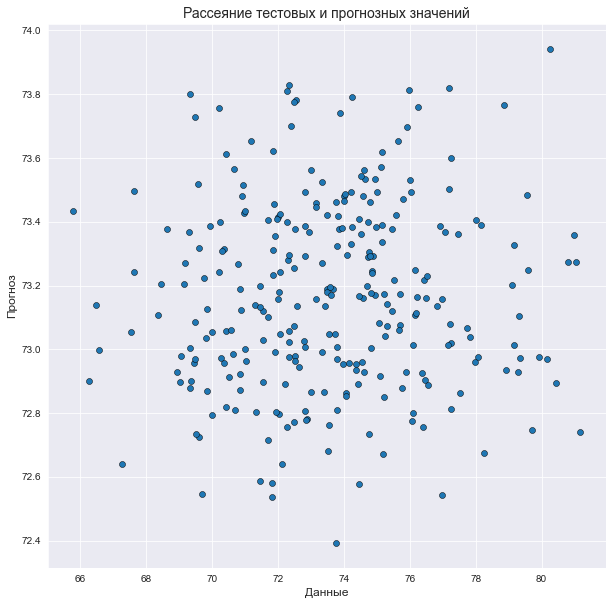

,Данные,Прогноз
0,72.076773,73.048322
1,75.309657,73.074724
2,72.501611,73.256052
3,72.124020,72.639594
4,72.351939,73.022872
...,...,...
272,77.256415,73.600548
273,70.221071,73.242249
274,74.782273,73.293516
275,71.934726,72.802767


In [196]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict111 = model_base111.predict(Xtest111)
predict111_values = np.ravel(predict111)
#Тестовые данные
tv111 = Ytest111.copy()
test111_values = np.ravel(tv111)
#Преобразуем нормализованные данные к исходным
col111 = ["Модуль упругости при растяжении, ГПа"]
#Определим параметры, которые использовались для нормализации
min111 = np.min(df[col111])
max111 = np.max(df[col111])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict111_values):
    predict111_values[i] = predict111_values[i]*(max111 - min111) + min111
    test111_values[i] = test111_values[i]*(max111 - min111) + min111
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results111 = pd.DataFrame({'Данные': test111_values,'Прогноз': predict111_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results111, edgecolor='black', palette='cubehelix')
plt.show()
feature_results111

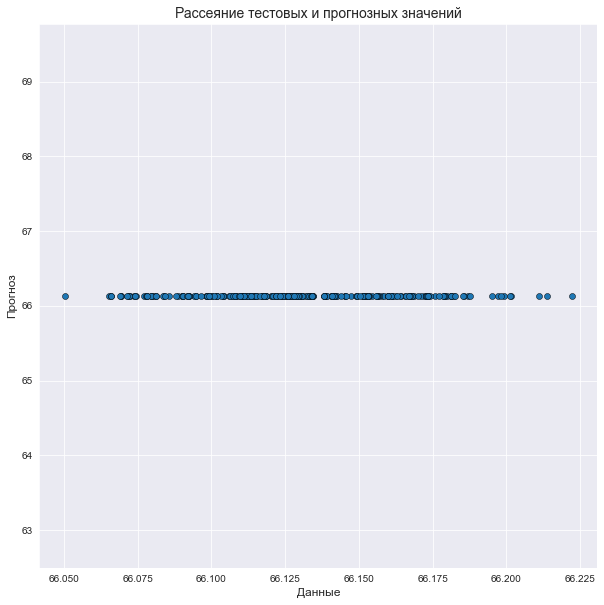

,Данные,Прогноз
0,66.123800,66.132373
1,66.151416,66.132373
2,66.167024,66.132373
3,66.161214,66.132373
4,66.173399,66.132373
...,...,...
247,66.126000,66.132373
248,66.150265,66.132373
249,66.081114,66.132373
250,66.201315,66.132373


In [197]:
plt.figure(figsize=(10, 10))
#Спрогнозированные данные
predict222 = model_base222.predict(Xtest222)
predict222_values = np.ravel(predict222)
#Тестовые данные
tv222 = Ytest222.copy()
test222_values = np.ravel(tv222)
#Преобразуем нормализованные данные к исходным
col222 = ["Модуль упругости при растяжении, ГПа"]
#Определим параметры, которые использовались для нормализации
min222 = np.min(df[col222])
max222 = np.max(df[col222])
#Сделаем преобразование, обратное нормализации (для нормализации использовался MinMaxScaler от 0 до 1)
i = 0
while i < len(predict222_values):
    predict222_values[i] = predict222_values[i]*(max222 - min222) + min222
    test222_values[i] = test222_values[i]*(max222 - min222) + min222
    i += 1
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results222 = pd.DataFrame({'Данные': test222_values,'Прогноз': predict222_values})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results222, edgecolor='black', palette='cubehelix')
plt.show()
feature_results222

In [198]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,2.927964,1974.118744,736.119982,111.136066,22.200570,286.181128,482.429070,73.303464,2461.491315,218.048059,45.976139,6.931939,57.562887
std,0.895472,71.040648,327.607008,26.753228,2.393926,39.420764,280.437329,3.025864,453.564734,57.137475,45.013829,2.514184,11.122204
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.793845,1250.392802,72.530873,0.000000,0.037639,28.661632
25%,2.320191,1923.318006,498.538615,92.856591,20.556328,259.205321,264.345872,71.241213,2148.175736,179.875097,0.000000,5.143644,50.275385
50%,2.907832,1977.321002,736.178435,111.162090,22.177681,286.220763,457.732246,73.247594,2455.974462,218.697660,90.000000,6.972862,57.584225
75%,3.549367,2020.053266,956.955626,130.109815,23.956980,313.012786,695.531920,75.310130,2751.233766,256.623860,90.000000,8.612094,64.840898
max,5.314144,2161.565216,1628.000000,181.828448,28.955094,386.067992,1291.340115,81.203147,3654.434359,359.052220,90.000000,13.732404,86.012427


In [199]:
df_norm_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,0.000868,0.587569,0.216978,0.032887,0.006601,0.085021,0.142062,0.021821,0.742763,0.064855,0.013891,0.002028,0.017140
std,0.000275,0.056993,0.092124,0.008474,0.000926,0.014082,0.081065,0.002203,0.056655,0.017766,0.013515,0.000760,0.003525
min,0.000163,0.444650,0.000709,0.011339,0.004113,0.049402,0.001902,0.016105,0.590461,0.021630,0.000000,0.000011,0.008164
25%,0.000679,0.548948,0.151021,0.027292,0.005925,0.075135,0.078825,0.020292,0.706068,0.052063,0.000000,0.001505,0.014780
50%,0.000857,0.585227,0.219229,0.032910,0.006589,0.083934,0.138593,0.021720,0.747345,0.064468,0.022461,0.002013,0.017152
75%,0.001052,0.626059,0.280808,0.038817,0.007208,0.094452,0.199600,0.023319,0.782554,0.076808,0.026792,0.002523,0.019443
max,0.001593,0.743130,0.476145,0.055088,0.009122,0.123083,0.368343,0.027834,0.877580,0.114133,0.034285,0.003983,0.026496


In [200]:
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Создаем нейронную сеть

### Первый вариант исполнения

In [201]:
df_NN = df.copy()

In [202]:
df_NN.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0


In [203]:
X1 = df_minmax_n.copy()
y1 = X1.pop('Соотношение матрица-наполнитель')

X2 = df_norm_n.copy()
y2 = X2.pop('Соотношение матрица-наполнитель')

In [204]:
y1

0      0.274768
1      0.274768
2      0.466552
3      0.465836
4      0.424236
         ...   
917    0.361662
918    0.607674
919    0.573391
920    0.662497
921    0.684036
Name: Соотношение матрица-наполнитель, Length: 922, dtype: float64

In [205]:
y2

0      0.000499
1      0.000499
2      0.000744
3      0.000746
4      0.000699
         ...   
917    0.000700
918    0.001078
919    0.000953
920    0.001191
921    0.001071
Name: Соотношение матрица-наполнитель, Length: 837, dtype: float64

In [206]:
X1

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


In [207]:
X2

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.022522,0.735625,0.038520,0.027733,0.002797,0.014489
918,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.022819,0.738645,0.036842,0.028164,0.003306,0.016820
919,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.021709,0.773510,0.068729,0.026143,0.001209,0.019645
920,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.023802,0.665970,0.063368,0.028931,0.002029,0.018728


Разбиваем выборку на тестировочную, валидационную и тестовую часть

Случайное распределение начинается с 1 , чтобы не было совсем случайным

In [208]:
X1_train_val, X1_test, y1_train_val, y1_test = train_test_split(X1, y1, test_size=0.3)
X1_train, X1_val, y1_train, y1_val = train_test_split(X1_train_val, y1_train_val, test_size=0.3)

X2_train_val, X2_test, y2_train_val, y2_test = train_test_split(X2, y2, test_size=0.3)
X2_train, X2_val, y2_train, y2_val = train_test_split(X2_train_val, y2_train_val, test_size=0.3)

In [209]:
X1trn1, X1test1, Y1trn1, Y1test1 = train_test_split(X1, y1, test_size=0.3)
X1trn2, X1test2, Y1trn2, Y1test2 = train_test_split(X1, y1, test_size=0.3)
X1trn3, X1test3, Y1trn3, Y1test3 = train_test_split(X1, y1, test_size=0.3)

X2trn1, X2test1, Y2trn1, Y2test1 = train_test_split(X2, y2, test_size=0.3)
X2trn2, X2test2, Y2trn2, Y2test2 = train_test_split(X2, y2, test_size=0.3)
X2trn3, X2test3, Y2trn3, Y2test3 = train_test_split(X2, y2, test_size=0.3)

In [210]:
X1test2

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
68,0.714554,0.435797,0.672598,0.485290,0.606979,0.279300,0.405833,0.645490,0.564279,0.0,0.330843,0.418110
209,0.185062,0.208168,0.419356,0.556450,0.517467,0.347406,0.568498,0.707604,0.610741,0.0,0.590163,0.486607
735,0.796750,0.212854,0.639823,0.375182,0.842704,0.238743,0.666269,0.366049,0.116771,1.0,0.326730,0.736446
367,0.626775,0.567330,0.349397,0.686805,0.548359,0.492922,0.240023,0.228407,0.464501,0.0,0.385381,0.476759
335,0.158582,0.593573,0.199072,0.026629,0.517354,0.298155,0.346319,0.294067,0.631676,0.0,0.373634,0.849055
...,...,...,...,...,...,...,...,...,...,...,...,...
377,0.572051,0.460766,0.648652,0.491174,0.503444,0.056423,0.742719,0.605408,0.528535,0.0,0.536400,0.710983
526,0.931898,0.431804,0.204022,0.496738,0.318259,0.408733,0.366970,0.808443,0.743006,1.0,0.248579,0.583466
136,0.564147,0.620307,0.481147,0.121021,0.692610,0.127634,0.453108,0.372081,0.305683,0.0,0.549097,0.524335
652,0.582417,0.386686,0.133749,0.531192,0.312489,0.567000,0.441792,0.284249,0.553320,1.0,0.325623,0.503480


In [211]:
def plot_loss(history, y_max):
    plt.plot(history.history['loss'], label='loss')
    plt.ylim([0, y_max])
    plt.xlabel('Эпоха')
    plt.ylabel('MAE [Соотношение матрица-наполнитель]')
    plt.legend()
    plt.grid(True)

In [212]:
from keras import models
from tensorflow.keras import layers
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_classification

Для рекомендации соотношения «матрица-наполнитель» разработана простая модель глубокого обучения с помощью библиотеки Keras.
Модель состоит из трех скрытых уровней. Первый уровень содержит 64 нейрона, что немногим более чем в три раза превышает объем входных данных (10 входных переменных). Последующие скрытые уровни содержат 64 и 1 нейрон. Снижение числа нейронов на каждом уровне сжимает информацию, которую сеть обработала на предыдущих уровнях.
Скрытые уровни нейронной сети трансформируются функциями актива-ции. Эти функции являются важными элементами сетевой инфраструктуры, так как они вносят в систему нелинейность.
Для эксперимента были выбраны три функции активации:
1. tanh (арктангенс),
2. relu (выпрямленная линейная единица),
3. sigmoid (сигмоида 1/(1+exp(-x)) )

Архитектура нейронной сети

In [214]:
def build_model1():
    model1=models.Sequential()
    model1.add(layers.Dense(64, activation='tanh', input_shape=(X1trn1.shape[1],)))
    model1.add(layers.Dense(64, activation='tanh'))
    model1.add(layers.Dense(1))
    model1.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model1

Далее была определена функция стоимости сети, которая используется для генерации оценки отклонения между прогнозами сети и реальными результатами наблюдений в ходе обучения. Для решения проблем с регрессией используют функцию средней квадратичной ошибки (Mean Squared Error). Данная функция вычисляет среднее квадратичное отклонение между предсказаниями и целями.

В качестве оптимизатора использовался RMSprop-оптимизатор, алгоритм которого похож на метод градиентного спуска с импульсом. Оптимизатор RMSprop ограничивает колебания в вертикальном направлении


processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


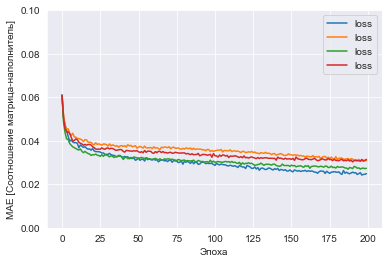

In [217]:
k = 4
num_val_samples1 = len(X1trn1) // k
num_epochs1 = 200
all_scores1 = []
for i in range(k):
    print('processing fold #', i)
    # Подготовьте данные проверки: данные из раздела #k
    val_data1 = X1trn1[i * num_val_samples1: (i + 1) * num_val_samples1]
    val_targets1 = Y1trn1[i * num_val_samples1: (i + 1) * num_val_samples1]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data1 = np.concatenate(
        [X1trn1[:i * num_val_samples1],
         X1trn1[(i + 1) * num_val_samples1:]],
        axis=0)
    partial_train_targets1 = np.concatenate(
        [Y1trn1[:i * num_val_samples1],
         Y1trn1[(i + 1) * num_val_samples1:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model1 = build_model1()
    # Обучить модель (в тихом режиме, verbose = 0)
    history1 = model1.fit(partial_train_data1, partial_train_targets1,
                  epochs=num_epochs1, batch_size=1, verbose=0)
    plot_loss(history1,0.1)
    # Оцениваем модель на основе данных проверки
    val_mse1, val_mae1 = model1.evaluate(val_data1, val_targets1, verbose=0)
    all_scores1.append(val_mae1)

In [218]:
predict1 = model1.predict(X1test1)

In [219]:
all_scores1

[0.18905894458293915,
 0.14951787889003754,
 0.18391068279743195,
 0.1624741405248642]

In [220]:
np.mean(all_scores1)

0.1712404116988182

После обучения для модели нейронной сети была определена средняя абсолютная ошибка на тестовом наборе данных.

Средняя абсолютная ошибка: 0.171.


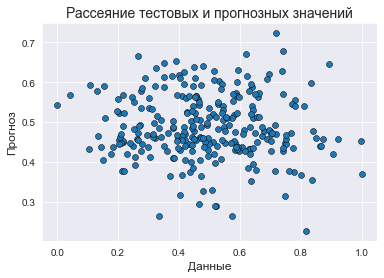

,Данные,Прогноз
0,0.439831,0.501854
1,0.638328,0.539216
2,0.274799,0.427661
3,0.381253,0.410576
4,0.455313,0.564241
...,...,...
272,0.648514,0.571335
273,0.419445,0.405875
274,0.341934,0.505846
275,0.526656,0.550951


In [221]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results1 = pd.DataFrame({'Данные': Y1test1.to_numpy(),'Прогноз': predict1.reshape(len(predict1))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results1, edgecolor='black', palette='cubehelix')
plt.show()
feature_results1

In [222]:
def build_model12():
    model12=models.Sequential()
    model12.add(layers.Dense(64, activation='tanh', input_shape=(X1trn2.shape[1],)))
    model12.add(layers.Dense(64, activation='tanh'))
    model12.add(layers.Dense(1))
    model12.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model12

processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


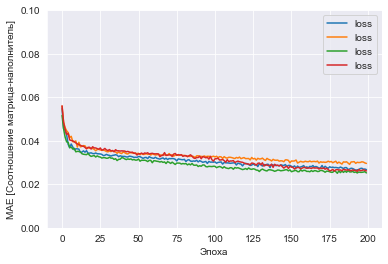

In [225]:
k2 = 4
num_val_samples12 = len(X1trn2) // k2
num_epochs12 = 200
all_scores12 = []
for i2 in range(k2):
    print('processing fold #', i2)
    # Подготовьте данные проверки: данные из раздела #k
    val_data12 = X1trn2[i2 * num_val_samples12: (i2 + 1) * num_val_samples12]
    val_targets12 = Y1trn2[i2 * num_val_samples12: (i2 + 1) * num_val_samples12]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data12 = np.concatenate(
        [X1trn2[:i2 * num_val_samples12],
         X1trn2[(i2 + 1) * num_val_samples12:]],
        axis=0)
    partial_train_targets12 = np.concatenate(
        [Y1trn2[:i2 * num_val_samples12],
         Y1trn2[(i2 + 1) * num_val_samples12:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model12 = build_model12()
    # Обучить модель (в тихом режиме, verbose=0)
    history12 = model12.fit(partial_train_data12, partial_train_targets12,
                  epochs=num_epochs12, batch_size=1, verbose=0)
    plot_loss(history12,0.1)
    # Оцениваем модель на основе данных проверки
    val_mse12, val_mae12 = model12.evaluate(val_data12, val_targets12, verbose=0)
    all_scores12.append(val_mae12)

In [227]:
predict12 = model12.predict(X1test2)

In [248]:
all_scores12

[0.18138600885868073,
 0.15812675654888153,
 0.17748667299747467,
 0.16110657155513763]

In [249]:
np.mean(all_scores12)

0.16952650249004364

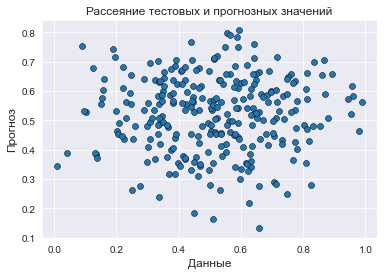

,Данные,Прогноз
0,0.387258,0.438928
1,0.588735,0.784112
2,0.504202,0.463572
3,0.528359,0.638538
4,0.505854,0.534838
...,...,...
272,0.739697,0.503467
273,0.524701,0.544280
274,0.198417,0.533502
275,0.409386,0.625002


In [250]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results12 = pd.DataFrame({'Данные': Y1test2.to_numpy(),'Прогноз': predict12.reshape(len(predict12))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=12)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results12, edgecolor='black', palette='cubehelix')
plt.show()
feature_results12

In [229]:
def build_model13():
    model13=models.Sequential()
    model13.add(layers.Dense(64, activation='sigmoid', input_shape=(X1trn3.shape[1],)))
    model13.add(layers.Dense(64, activation='sigmoid'))
    model13.add(layers.Dense(1))
    model13.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model13

processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


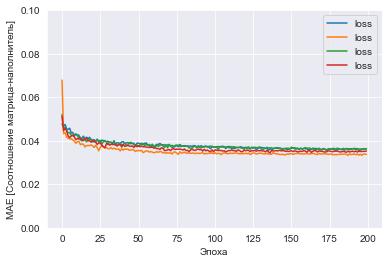

In [232]:
k3 = 4
num_val_samples13 = len(X1trn3) // k3
num_epochs13 = 200
all_scores13 = []
for i3 in range(k3):
    print('processing fold #', i3)
    # Подготовьте данные проверки: данные из раздела #k
    val_data13 = X1trn3[i3 * num_val_samples13: (i3 + 1) * num_val_samples13]
    val_targets13 = Y1trn3[i3 * num_val_samples13: (i3 + 1) * num_val_samples13]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data13 = np.concatenate(
        [X1trn3[:i3 * num_val_samples13],
         X1trn3[(i3 + 1) * num_val_samples13:]],
        axis=0)
    partial_train_targets13 = np.concatenate(
        [Y1trn3[:i3 * num_val_samples13],
         Y1trn3[(i3 + 1) * num_val_samples13:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model13 = build_model13()
    # Обучить модель (в тихом режиме, verbose=0)
    history13 = model13.fit(partial_train_data13, partial_train_targets13,
                  epochs=num_epochs13, batch_size=1, verbose=0)
    plot_loss(history13,0.1)
    # Оцениваем модель на основе данных проверки
    val_mse13, val_mae13 = model13.evaluate(val_data13, val_targets13, verbose=0)
    all_scores13.append(val_mae13)

In [233]:
predict13 = model13.predict(X1test3)

In [244]:
all_scores13

[0.14999693632125854,
 0.16233162581920624,
 0.14788849651813507,
 0.1549447923898697]

In [246]:
np.mean(all_scores13)

0.15379046276211739

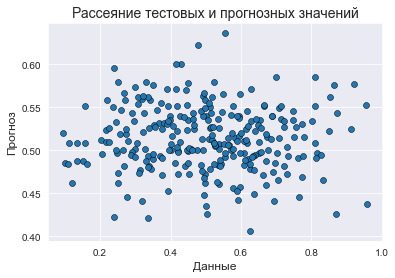

,Данные,Прогноз
0,0.319138,0.441282
1,0.366300,0.531129
2,0.397774,0.540102
3,0.722423,0.481907
4,0.666214,0.550901
...,...,...
272,0.589733,0.510593
273,0.494837,0.467828
274,0.223971,0.509313
275,0.298759,0.492468


In [247]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results13 = pd.DataFrame({'Данные': Y1test3.to_numpy(),'Прогноз': predict13.reshape(len(predict13))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results13, edgecolor='black', palette='cubehelix')
plt.show()
feature_results13

In [235]:
#X2trn1, X2test1, Y2trn1, Y2test1 = train_test_split(X2, y2, test_size=0.3)
#X2trn2, X2test2, Y2trn2, Y2test2 = train_test_split(X2, y2, test_size=0.3)
#X2trn3, X2test3, Y2trn3, Y2test3 = train_test_split(X2, y2, test_size=0.3)

In [236]:
X2test2

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
54,0.674683,0.085216,0.034892,0.006674,0.098817,0.137058,0.023390,0.704775,0.100024,0.000000,0.000757,0.021622
700,0.632106,0.112527,0.035444,0.007824,0.096256,0.086362,0.024473,0.751284,0.058078,0.029893,0.002751,0.020918
496,0.616538,0.356741,0.034144,0.006660,0.076159,0.187150,0.021964,0.664119,0.087659,0.028315,0.002272,0.023497
320,0.644112,0.224338,0.037444,0.006570,0.074284,0.069644,0.023854,0.718380,0.075691,0.000000,0.001855,0.024619
655,0.549309,0.163637,0.039427,0.004984,0.078286,0.125193,0.020755,0.800179,0.080423,0.024190,0.001824,0.018096
...,...,...,...,...,...,...,...,...,...,...,...,...
132,0.509015,0.171998,0.014731,0.006596,0.064845,0.029361,0.019576,0.835765,0.082121,0.000000,0.001104,0.018971
412,0.513346,0.139478,0.022115,0.005101,0.087506,0.232451,0.019526,0.804892,0.080021,0.000000,0.001895,0.013255
287,0.638818,0.100010,0.040063,0.007761,0.116815,0.268787,0.021413,0.701122,0.043739,0.000000,0.002173,0.020052
193,0.616450,0.340459,0.028111,0.007055,0.081345,0.251889,0.023068,0.654146,0.066547,0.000000,0.000047,0.017453


In [237]:
def build_model21():
    model21=models.Sequential()
    model21.add(layers.Dense(64, activation='tanh', input_shape=(X2trn1.shape[1],)))
    model21.add(layers.Dense(64, activation='tanh'))
    model21.add(layers.Dense(1))
    model21.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model21

processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


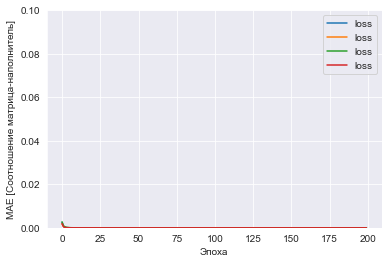

In [238]:
k = 4
num_val_samples21 = len(X1trn1) // k
num_epochs21 = 200
all_scores21 = []
for i in range(k):
    print('processing fold #', i)
    # Подготовьте данные проверки: данные из раздела #k
    val_data21 = X2trn1[i * num_val_samples21: (i + 1) * num_val_samples21]
    val_targets21 = Y2trn1[i * num_val_samples12: (i + 1) * num_val_samples21]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data21 = np.concatenate(
        [X2trn1[:i * num_val_samples21],
         X2trn1[(i + 1) * num_val_samples21:]],
        axis=0)
    partial_train_targets21 = np.concatenate(
        [Y2trn1[:i * num_val_samples21],
         Y2trn1[(i + 1) * num_val_samples21:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model21 = build_model21()
    # Обучить модель (в тихом режиме,  verbose=0)
    history21 = model21.fit(partial_train_data21, partial_train_targets21,
                  epochs=num_epochs21, batch_size=1, verbose=0)
    plot_loss(history21,0.1)
    ## Оцениваем модель на основе данных проверки
    val_mse21, val_mae21 = model21.evaluate(val_data21, val_targets21, verbose=0)
    all_scores21.append(val_mae21)

In [239]:
predict21 = model21.predict(X2test1)

In [241]:
all_scores21

[0.00039395870408043265,
 0.000518019194714725,
 0.00038435717578977346,
 0.0003645074903033674]

In [242]:
np.mean(all_scores21)

0.00041521064122207463

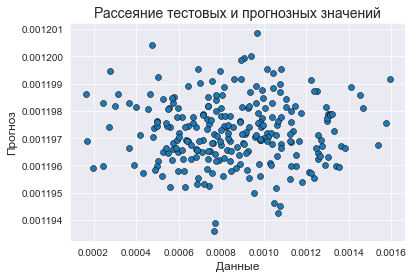

,Данные,Прогноз
0,0.000658,0.001196
1,0.000925,0.001197
2,0.000365,0.001198
3,0.001363,0.001197
4,0.000635,0.001197
...,...,...
247,0.001078,0.001199
248,0.001220,0.001196
249,0.001266,0.001196
250,0.000604,0.001197


In [243]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results21 = pd.DataFrame({'Данные': Y2test1.to_numpy(),'Прогноз': predict21.reshape(len(predict21))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results21, edgecolor='black', palette='cubehelix')
plt.show()
feature_results21

In [251]:
def build_model22():
    model22=models.Sequential()
    model22.add(layers.Dense(64, activation='tanh', input_shape=(X2trn2.shape[1],)))
    model22.add(layers.Dense(64, activation='tanh'))
    model22.add(layers.Dense(1))
    model22.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model22

processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


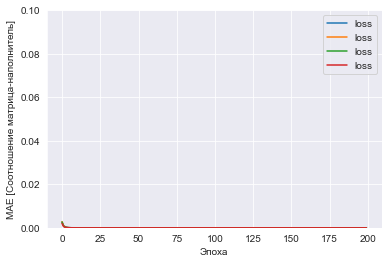

In [254]:
k2 = 4
num_val_samples22 = len(X2trn2) // k2
num_epochs22 = 200
all_scores22 = []
for i2 in range(k2):
    print('processing fold #', i2)
    # Подготовьте данные проверки: данные из раздела #k
    val_data22 = X2trn2[i2 * num_val_samples22: (i2 + 1) * num_val_samples22]
    val_targets22 = Y2trn2[i2 * num_val_samples22: (i2 + 1) * num_val_samples22]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data22 = np.concatenate(
        [X2trn2[:i2 * num_val_samples22],
         X2trn2[(i2 + 1) * num_val_samples22:]],
        axis=0)
    partial_train_targets22 = np.concatenate(
        [Y2trn2[:i2 * num_val_samples22],
         Y2trn2[(i2 + 1) * num_val_samples22:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model22 = build_model22()
    # Обучите модель (в тихом режиме, verbose=0)
    history22 = model22.fit(partial_train_data22, partial_train_targets22,
                  epochs=num_epochs22, batch_size=1, verbose=0)
    plot_loss(history22,0.1)
    # Оцениваем модель на основе данных проверки
    val_mse22, val_mae22 = model22.evaluate(val_data22, val_targets22, verbose=0)
    all_scores22.append(val_mae22)

In [255]:
predict22 = model22.predict(X2test2)

In [256]:
all_scores22

[0.0003346882003825158,
 0.0008271291735582054,
 0.00024771798052825034,
 0.00022360881848726422]

In [257]:
np.mean(all_scores22)

0.0004082860432390589

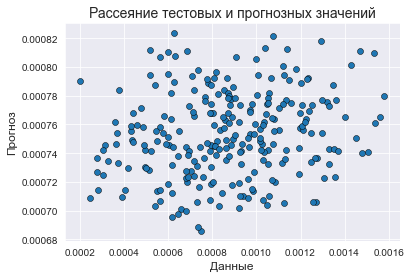

,Данные,Прогноз
0,0.000879,0.000773
1,0.000893,0.000750
2,0.001236,0.000792
3,0.000794,0.000768
4,0.001193,0.000726
...,...,...
247,0.000789,0.000708
248,0.000920,0.000719
249,0.001071,0.000765
250,0.000809,0.000792


In [263]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results22 = pd.DataFrame({'Данные': Y2test2.to_numpy(),'Прогноз': predict22.reshape(len(predict22))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results22, edgecolor='black', palette='cubehelix')
plt.show()
feature_results22

In [261]:
def build_model33():
    model33=models.Sequential()
    model33.add(layers.Dense(64, activation='sigmoid', input_shape=(X2trn3.shape[1],)))
    model33.add(layers.Dense(64, activation='sigmoid'))
    model33.add(layers.Dense(1))
    model33.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    return model33

processing fold # 0
processing fold # 1
processing fold # 2
processing fold # 3


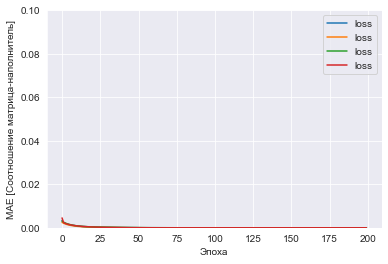

In [262]:
k2 = 4
num_val_samples33 = len(X2trn3) // k2
num_epochs33 = 200
all_scores33 = []
for i2 in range(k2):
    print('processing fold #', i2)
    # Подготовьте данные проверки: данные из раздела #k
    val_data33 = X2trn2[i2 * num_val_samples33: (i2 + 1) * num_val_samples33]
    val_targets33 = Y2trn3[i2 * num_val_samples33: (i2 + 1) * num_val_samples33]
# Подготовьте данные обучения: данные из всех остальных разделов
    partial_train_data33 = np.concatenate(
        [X2trn3[:i2 * num_val_samples33],
         X2trn3[(i2 + 1) * num_val_samples33:]],
        axis=0)
    partial_train_targets33 = np.concatenate(
        [Y2trn3[:i2 * num_val_samples33],
         Y2trn3[(i2 + 1) * num_val_samples33:]],
        axis=0)
    
    # Собираем модель Keras (уже скомпилированную)
    model33 = build_model33()
    # Обучите модель (в тихом режиме, verbose=0)
    history33 = model33.fit(partial_train_data33, partial_train_targets33,
                  epochs=num_epochs33, batch_size=1, verbose=0)
    plot_loss(history33,0.1)
    # Оцениваем модель на основе данных проверки
    val_mse33, val_mae33 = model33.evaluate(val_data33, val_targets33, verbose=0)
    all_scores33.append(val_mae33)

In [264]:
predict33 = model33.predict(X2test3)

In [265]:
all_scores33

[0.0008295731386169791,
 0.0007019577315077186,
 0.002649577334523201,
 0.0005410686717368662]

In [266]:
np.mean(all_scores33)

0.0011805442190961912

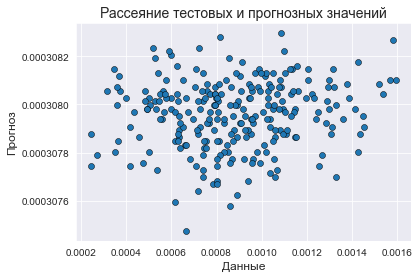

,Данные,Прогноз
0,0.000769,0.000308
1,0.000913,0.000308
2,0.000870,0.000308
3,0.000893,0.000308
4,0.001195,0.000308
...,...,...
247,0.001415,0.000308
248,0.000862,0.000308
249,0.000573,0.000308
250,0.001319,0.000308


In [267]:
#Создадим датасет с тестовыми данными и прогнозными значениями
feature_results33 = pd.DataFrame({'Данные': Y2test3.to_numpy(),'Прогноз': predict33.reshape(len(predict33))})
#Выведем график рассеяния. В случае идеального прогноза график походил бы на прямую
sns.set_style('darkgrid')
plt.title('Рассеяние тестовых и прогнозных значений',size=14)
plt.xlabel('Данные',size=12)
plt.ylabel('Прогноз',size=12)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results33, edgecolor='black', palette='cubehelix')
plt.show()
feature_results33

In [270]:
model1.save('Models/model11.h5')
model12.save('Models/model12.h5')
model13.save('Models/model13.h5')

model21.save('Models/model21.h5')
model22.save('Models/model22.h5')
model33.save('Models/model23.h5')

In [273]:
#Ввод данных пользователем user
user = df.copy(deep = True)
user = user.reset_index()
user = user.drop(labels=range(1, 922), axis=0)
user.drop(['index'], inplace=True, axis=1)

print('Введите параметры:') 
a = 0 
for i in df.columns: 
    if a != 0 and a != 7 and a !=8: 
        print(col[a]) 
        y = input() 
        user[col[a]].values[0] = float(y) 
    else: 
        user[col[a]].values[0] = 0 
    a+=1
    if a == 13:
        break

Введите параметры:
Плотность, кг/м3
0.1
модуль упругости, ГПа
0.8
Количество отвердителя, м.%
0.6
Содержание эпоксидных групп,%_2
0.04
Температура вспышки, С_2
0.9
Поверхностная плотность, г/м2
0.3
Потребление смолы, г/м2
0.07
Угол нашивки, град
1
Шаг нашивки
0.06
Плотность нашивки
0.7


In [274]:
user.drop('Соотношение матрица-наполнитель', inplace=True, axis=1)

In [275]:
user

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.1,0.8,0.6,0.04,0.9,0.3,0.0,0.0,0.07,1.0,0.06,0.7


In [276]:
pred11 = model1.predict(user)
pred12 = model12.predict(user)
pred13 = model13.predict(user)

pred21 = model21.predict(user)
pred22 = model22.predict(user)
pred23 = model33.predict(user)

In [277]:
print(pred11, pred12, pred13)
print('\n')
print(pred21, pred22, pred23)

[[0.45240209]] [[0.18375595]] [[0.426705]]


[[0.00119994]] [[0.0008333]] [[0.00031743]]


In [278]:
pred_inversed = pd.DataFrame([])
pred_inversed.at[0,0] = float(pred11)

for i in range(1, 13):
    p = 0
    pred_inversed.at[0,i] = float(p)
pred_inversed

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.452402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [293]:
#Возвращает предсказанное значание (в размерности до нормализации)
Y_trans = df_std_X1.inverse_transform(pred_inversed)
Y_trans2 = df_std_X2.inverse_transform(pred_inversed)
print(Y_trans[0,0])
print(Y_trans2[0,0])

0.5843530482542842
0.0009918497554419698


In [294]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,2.927964,1974.118744,736.119982,111.136066,22.200570,286.181128,482.429070,73.303464,2461.491315,218.048059,45.976139,6.931939,57.562887
std,0.895472,71.040648,327.607008,26.753228,2.393926,39.420764,280.437329,3.025864,453.564734,57.137475,45.013829,2.514184,11.122204
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.793845,1250.392802,72.530873,0.000000,0.037639,28.661632
25%,2.320191,1923.318006,498.538615,92.856591,20.556328,259.205321,264.345872,71.241213,2148.175736,179.875097,0.000000,5.143644,50.275385
50%,2.907832,1977.321002,736.178435,111.162090,22.177681,286.220763,457.732246,73.247594,2455.974462,218.697660,90.000000,6.972862,57.584225
75%,3.549367,2020.053266,956.955626,130.109815,23.956980,313.012786,695.531920,75.310130,2751.233766,256.623860,90.000000,8.612094,64.840898
max,5.314144,2161.565216,1628.000000,181.828448,28.955094,386.067992,1291.340115,81.203147,3654.434359,359.052220,90.000000,13.732404,86.012427


### Второй вариант исполнения нейронной сети

In [43]:
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [44]:
# Сформируем входы и выход для модели

tv = df['Соотношение матрица-наполнитель']
tr_v = df.loc[:, df.columns != 'Соотношение матрица-наполнитель']

# Разбиваем выборки на обучающую и тестовую
x_train, x_test, y_train, y_test = train_test_split(tr_v, tv, test_size = 0.3, random_state = 14)

In [45]:
# Нормализуем данные

x_train_n = tf.keras.layers.Normalization(axis =-1)
x_train_n.adapt(np.array(x_train))

In [46]:
def create_model(lyrs=[32], act='softmax', opt='SGD', dr=0.1):
    
    seed = 7
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    model = Sequential()
    model.add(Dense(lyrs[0], input_dim=x_train.shape[1], activation=act)) 
    for i in range(1,len(lyrs)):
        model.add(Dense(lyrs[i], activation=act))
    
    model.add(Dropout(dr))
    model.add(Dense(3, activation='tanh'))  # выходной слой
    
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['mae', 'accuracy'])
 
    return model


In [47]:
# строим модель
model = KerasClassifier(build_fn=create_model, verbose=0)

# определяем параметры
batch_size = [4, 10, 20, 50, 100]
epochs = [10, 50, 100, 200, 300]
param_grid = dict(batch_size=batch_size, epochs=epochs)

# поиск оптимальных параметров
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    cv=10,
                    verbose=1, n_jobs=-1)

grid_result = grid.fit(x_train, y_train)

C:\Users\PC\AppData\Local\Temp\ipykernel_17116\1647395477.py:2: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, verbose=0)


Fitting 10 folds for each of 25 candidates, totalling 250 fits


In [48]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.004639 using {'batch_size': 100, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 50}
0.003077 (0.009231) with: {'batch_size': 4, 'epochs': 100}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 300}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 10}
0.000000 (0.000000) with: {'batch_size': 10, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 100}
0.003077 (0.009231) with: {'batch_size': 10, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 300}
0.000000 (0.000000) with: {'batch_size': 20, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 20, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 20, 'epochs': 100}
0.003077 (0.009231) with: {'batch_size': 20, 'epochs': 200}
0.003101 (0.006202) with: {'batch_size': 20, 'epochs': 300}
0.001538 (0.004615) with: {'batch_size': 50, 'epochs': 1

In [49]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Nadam']
param_grid = dict(opt=optimizer)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

C:\Users\PC\AppData\Local\Temp\ipykernel_17116\2369695373.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)


Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ............................................opt=SGD; total time=   6.7s
[CV] END ............................................opt=SGD; total time=   7.1s
[CV] END ............................................opt=SGD; total time=   6.7s
[CV] END ............................................opt=SGD; total time=   6.5s
[CV] END ............................................opt=SGD; total time=   6.6s
[CV] END ............................................opt=SGD; total time=   7.2s
[CV] END ............................................opt=SGD; total time=   7.0s
[CV] END ............................................opt=SGD; total time=   7.0s
[CV] END ............................................opt=SGD; total time=   7.0s
[CV] END ............................................opt=SGD; total time=   7.1s
[CV] END ........................................opt=RMSprop; total time=   6.7s
[CV] END .......................................

In [50]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003077 using {'opt': 'Adadelta'}
0.000000 (0.000000) with: {'opt': 'SGD'}
0.001538 (0.004615) with: {'opt': 'RMSprop'}
0.001538 (0.004615) with: {'opt': 'Adagrad'}
0.003077 (0.009231) with: {'opt': 'Adadelta'}
0.001563 (0.004688) with: {'opt': 'Adam'}
0.001538 (0.004615) with: {'opt': 'Nadam'}


In [51]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

layers = [[8],[16, 4],[32, 8, 3],[12, 6, 3], [64, 64, 3], [128, 64, 16, 3]]
param_grid = dict(lyrs=layers)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

C:\Users\PC\AppData\Local\Temp\ipykernel_17116\3302332215.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)


Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ...........................................lyrs=[8]; total time=   7.4s
[CV] END ...........................................lyrs=[8]; total time=   6.7s
[CV] END ...........................................lyrs=[8]; total time=   6.7s
[CV] END ...........................................lyrs=[8]; total time=   6.6s
[CV] END ...........................................lyrs=[8]; total time=   6.6s
[CV] END ...........................................lyrs=[8]; total time=   7.2s
[CV] END ...........................................lyrs=[8]; total time=   7.1s
[CV] END ...........................................lyrs=[8]; total time=   7.5s
[CV] END ...........................................lyrs=[8]; total time=   7.4s
[CV] END ...........................................lyrs=[8]; total time=   7.3s
[CV] END .......................................lyrs=[16, 4]; total time=   7.1s
[CV] END .......................................

In [52]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.001538 using {'lyrs': [8]}
0.001538 (0.004615) with: {'lyrs': [8]}
0.001538 (0.004615) with: {'lyrs': [16, 4]}
0.001538 (0.004615) with: {'lyrs': [32, 8, 3]}
0.001538 (0.004615) with: {'lyrs': [12, 6, 3]}
0.001538 (0.004615) with: {'lyrs': [64, 64, 3]}
0.001538 (0.004615) with: {'lyrs': [128, 64, 16, 3]}


In [53]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
param_grid = dict(act=activation)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=10)
grid_result = grid.fit(x_train, y_train)

C:\Users\PC\AppData\Local\Temp\ipykernel_17116\2770061730.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)


In [54]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'act': 'linear'}
0.001538 (0.004615) with: {'act': 'softmax'}
0.001538 (0.004615) with: {'act': 'softplus'}
0.001538 (0.004615) with: {'act': 'softsign'}
0.001538 (0.004615) with: {'act': 'relu'}
0.001538 (0.004615) with: {'act': 'tanh'}
0.001538 (0.004615) with: {'act': 'sigmoid'}
0.001538 (0.004615) with: {'act': 'hard_sigmoid'}
0.003101 (0.006202) with: {'act': 'linear'}


In [55]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

drops = [0.0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.5]
param_grid = dict(dr=drops)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(x_train, y_train)

C:\Users\PC\AppData\Local\Temp\ipykernel_17116\1840449608.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)


Fitting 10 folds for each of 7 candidates, totalling 70 fits
[CV] END .............................................dr=0.0; total time=   7.4s
[CV] END .............................................dr=0.0; total time=   6.9s
[CV] END .............................................dr=0.0; total time=   7.1s
[CV] END .............................................dr=0.0; total time=   7.3s
[CV] END .............................................dr=0.0; total time=   7.4s
[CV] END .............................................dr=0.0; total time=   7.6s
[CV] END .............................................dr=0.0; total time=   7.2s
[CV] END .............................................dr=0.0; total time=   7.2s
[CV] END .............................................dr=0.0; total time=   7.3s
[CV] END .............................................dr=0.0; total time=   7.2s
[CV] END ............................................dr=0.01; total time=   6.8s
[CV] END .......................................

In [56]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'dr': 0.0}
0.003101 (0.006202) with: {'dr': 0.0}
0.003077 (0.009231) with: {'dr': 0.01}
0.001538 (0.004615) with: {'dr': 0.05}
0.001538 (0.004615) with: {'dr': 0.1}
0.003077 (0.009231) with: {'dr': 0.2}
0.001538 (0.004615) with: {'dr': 0.3}
0.001538 (0.004615) with: {'dr': 0.5}


In [57]:
# построение окончательной модели
model = create_model(lyrs=[128, 64, 16, 3], dr=0.05)

print(model.summary())

Model: "sequential_195"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_490 (Dense)           (None, 128)               1664      
                                                                 
 dense_491 (Dense)           (None, 64)                8256      
                                                                 
 dense_492 (Dense)           (None, 16)                1040      
                                                                 
 dense_493 (Dense)           (None, 3)                 51        
                                                                 
 dropout_195 (Dropout)       (None, 3)                 0         
                                                                 
 dense_494 (Dense)           (None, 3)                 12        
                                                                 
Total params: 11,023
Trainable params: 11,023
Non-tr

In [58]:
# обучаем нейросеть, 80/20 CV
model_hist = model.fit(x_train, 
    y_train, 
    epochs = 100, 
    verbose = 1, 
    validation_split = 0.2)

Epoch 1/100
17/17 [==============================] - 1s 16ms/step - loss: 14.9643 - mae: 2.6744 - accuracy: 0.0000e+00 - val_loss: 13.3745 - val_mae: 2.3506 - val_accuracy: 0.0000e+00
Epoch 2/100
17/17 [==============================] - 0s 4ms/step - loss: 12.9562 - mae: 2.4967 - accuracy: 0.0000e+00 - val_loss: 12.2133 - val_mae: 2.2316 - val_accuracy: 0.0000e+00
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 11.7873 - mae: 2.4084 - accuracy: 0.0000e+00 - val_loss: 11.2919 - val_mae: 2.1756 - val_accuracy: 0.0000e+00
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 7.3932 - mae: 2.3009 - accuracy: 0.0000e+00 - val_loss: -5.7961 - val_mae: 1.8155 - val_accuracy: 0.0000e+00
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: -7.0463 - mae: 2.0142 - accuracy: 0.0000e+00 - val_loss: -6.9721 - val_mae: 1.7984 - val_accuracy: 0.0000e+00
Epoch 6/100
17/17 [==============================] - 0s 4ms/step - loss: -8.3336 - ma

17/17 [==============================] - 0s 4ms/step - loss: -29.7791 - mae: 1.9852 - accuracy: 0.0000e+00 - val_loss: -27.1246 - val_mae: 1.7795 - val_accuracy: 0.0000e+00
Epoch 90/100
17/17 [==============================] - 0s 4ms/step - loss: -29.7081 - mae: 1.9852 - accuracy: 0.0000e+00 - val_loss: -27.1246 - val_mae: 1.7795 - val_accuracy: 0.0000e+00
Epoch 91/100
17/17 [==============================] - 0s 4ms/step - loss: -29.6146 - mae: 1.9852 - accuracy: 0.0000e+00 - val_loss: -27.1246 - val_mae: 1.7795 - val_accuracy: 0.0000e+00
Epoch 92/100
17/17 [==============================] - 0s 4ms/step - loss: -29.8508 - mae: 1.9852 - accuracy: 0.0000e+00 - val_loss: -27.1246 - val_mae: 1.7795 - val_accuracy: 0.0000e+00
Epoch 93/100
17/17 [==============================] - 0s 4ms/step - loss: -29.7734 - mae: 1.9852 - accuracy: 0.0000e+00 - val_loss: -27.1246 - val_mae: 1.7795 - val_accuracy: 0.0000e+00
Epoch 94/100
17/17 [==============================] - 0s 4ms/step - loss: -29.6201 

In [59]:
# оценим модель
scores = model.evaluate(x_test, y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

9/9 [==============================] - 0s 2ms/step - loss: -28.9481 - mae: 1.9057 - accuracy: 0.0000e+00

mae: 190.57%


In [60]:
# Посмотрим на потери модели

model_hist.history

{'loss': [14.964320182800293,
  12.956192016601562,
  11.787344932556152,
  7.393210411071777,
  -7.04628849029541,
  -8.333569526672363,
  -9.655481338500977,
  -10.969303131103516,
  -12.287620544433594,
  -13.657464027404785,
  -15.019466400146484,
  -16.54376220703125,
  -18.0119571685791,
  -19.48176383972168,
  -20.9980411529541,
  -22.771644592285156,
  -24.40959358215332,
  -26.070762634277344,
  -27.6115779876709,
  -28.506088256835938,
  -29.627939224243164,
  -29.4199275970459,
  -29.54404067993164,
  -29.619714736938477,
  -29.48793601989746,
  -29.899377822875977,
  -29.424030303955078,
  -29.559293746948242,
  -29.541921615600586,
  -29.558809280395508,
  -29.58097267150879,
  -29.778472900390625,
  -29.69386863708496,
  -29.623443603515625,
  -29.671123504638672,
  -29.623353958129883,
  -29.560853958129883,
  -29.57990837097168,
  -29.846599578857422,
  -29.749814987182617,
  -29.67443084716797,
  -29.515586853027344,
  -29.80388641357422,
  -29.5745849609375,
  -29.561

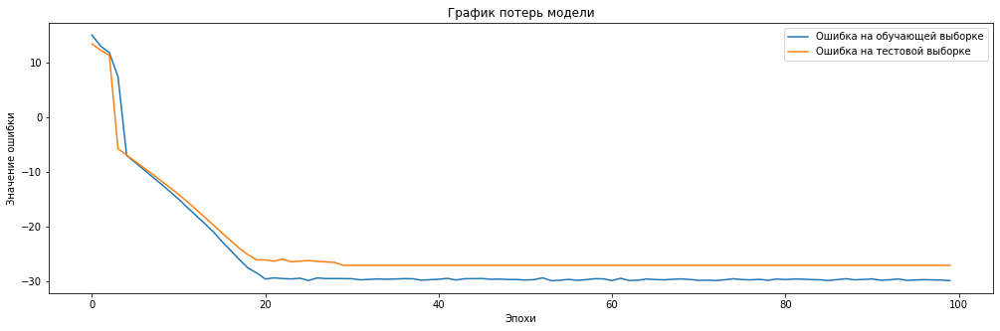

In [61]:
# Посмотрим на график потерь на тренировочной и тестовой выборках
def model_loss_plot(model_hist):
    plt.figure(figsize = (17,5))
    plt.plot(model_hist.history['loss'],
             label = 'ошибка на обучающей выборке')
    plt.plot(model_hist.history['val_loss'],
            label = 'ошибка на тестовой выборке')
    plt.title('График потерь модели')
    plt.ylabel('Значение ошибки')
    plt.xlabel('Эпохи')
    plt.legend(['Oшибка на обучающей выборке', 'Ошибка на тестовой выборке'], loc='best')
    plt.show()
model_loss_plot(model_hist)

9/9 [==============================] - 0s 1ms/step


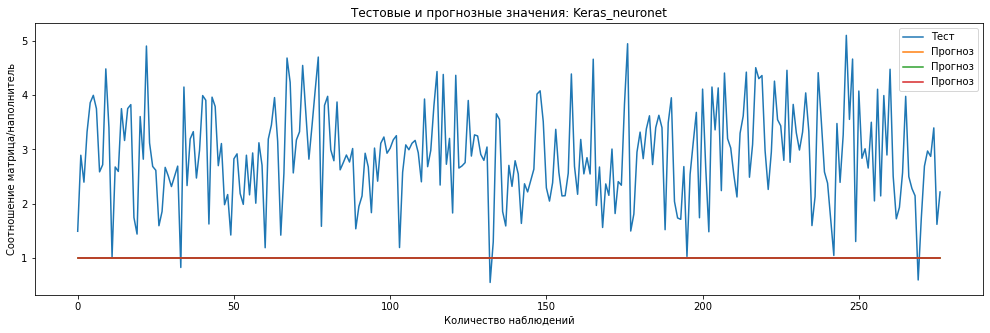

In [62]:
# Зададим функцию для визуализации факт/прогноз для результатов моделей
# Посмотрим на график результата работы модели
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label = 'Тест')
    plt.plot(predict, label = 'Прогноз')
    plt.legend(loc = 'best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()
actual_and_predicted_plot(y_test.values, model.predict(x_test.values), 'Cоотношение матрица/наполнитель', 'Keras_neuronet')

На данном этапе исследовательскую работу можно считать завершенной. В ходе работы был задействован датасет с реальными данными, произведена его подробная опись и сопутствующий анализ; построено множество разнообразных графиков; осуществлено разбиение данных на обучающую и тестовую выборки с использованием множества вспомогательных модулей, которая во многом облегчила процесс машинного обучения и в целом была очень полезным инструментом в ходе работы над выпускной квалификационной работой.
Были сделаны выводы что использованные при разработке моделей подходы не позволили получить сколько-нибудь достоверных прогнозов. Применённые модели регрессии не показали высокой эффективности в прогнозировании свойств композитов. Невозможно определить из свойств материалов соотношение «матрица – наполнитель» 
Данный факт не указывает на то, что прогнозирование характеристик композитных материалов на основании предоставленного набора данных невозможно, но может указывать на недостатки базы данных, подходов, использованных при прогнозе, необходимости пересмотра инструментов для прогнозирования.